# Import Libraries

In [15]:
import yt
import unyt
import caesar

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.lines import Line2D
from matplotlib.legend import Legend
# from matplotlib.patches import Rectangle

import pprint
import os
import copy
import gc
import dill
import h5py

In [16]:
gc.isenabled()

True

# Dictionary of simulation runs

In [24]:
sim_dict = {    
    r'Manhattan Suite (L0) - Halo 0':{
        'halo_file':'/scratch/aspadawe/snapshots/ManhattanSuite/Simba/simba_9Rvir_1x/halo00000/halo00000/Groups/snap_props/v5/halo_0_props-v5.hdf5',
        'sim':'Simba',
    },

    # r'Manhattan Suite (L0) - Halo 0':{
    #     'halo_file':'/scratch/aspadawe/snapshots/ManhattanSuite/Simba/simba_9Rvir_1x/halo00000/halo00000/Groups/snap_props/v5/halo_0_props-snap_53-v5.hdf5',
    #     'sim':'Simba',
    # },
    
    # r'Manhattan Suite (L1) - Halo 0':{
    #     'halo_file':'/scratch/aspadawe/snapshots/ManhattanSuite/Simba/simba_9Rvir_8x/halo00000/Groups/halo_0_props.hdf5',
    #     'sim':'Simba',
    # },
}

In [25]:
for sim, sim_info in sim_dict.items():
    print(sim)

    # with open(sim_info['halo_file'], 'rb') as f:
    #     sim_info['halo_props'] = dill.load(f)
    #     pprint.pprint(sim_info['halo_props']['halo']['snap_num'])

    f = h5py.File(sim_info['halo_file'], 'r')
    sim_info['halo_props'] = f
    print(list(sim_info['halo_props'].keys()))
    # print(f['/halo/snap_num'][:])
    # print(f['halo']['snap_num'][:])
    # print(f['halo']['num_major_mergers_cm'][:])
    # print(f['halo']['ssfr_100'][:])
    # print(f['central']['snap_num'][:])
    # print(f['central']['mass_weighted_temperature'][:])
    

    # with h5py.File(sim_info['halo_file'], 'r') as f:
    #     sim_info['halo_props'] = f
    #     print(list(sim_info['halo_props'].keys()))
    #     # print(f['/halo/snap_num'][:])
    #     print(f['halo']['snap_num'][:])
    #     print(f['halo']['num_major_mergers_cm'][:])
    #     # print(f['halo']['ssfr_100'][:])
    #     print(f['central']['snap_num'][:])
    #     print(f['central']['mass_weighted_temperature'][:])
    #     # print(f['central']['ssfr_100'][:])

    print()

Manhattan Suite (L0) - Halo 0
['central', 'halo']



# Plot

## Properties available

In [26]:
log_props = ['m2500c', 'm500c', 'm200c',
             'r2500c', 'r500c', 'r200c',
             'r2500c_cm', 'r500c_cm', 'r200c_cm',
             'bh_mdot', 'bh_fedd', 'bh_mdot_edd',
             'sfr', 'sfr_100', 'ssfr', 'ssfr_100',
             'temperature', 'mass_weighted_temperature', 'mass_weighted_cgm_temperature',
             'gas_mass', 'stellar_mass', 'dm_mass', 'bh_mass', 'dust_mass', 'HI_mass', 'H2_mass',
             'gas_30kpc_mass', 'stellar_30kpc_mass', 'dm_30kpc_mass', 'bh_30kpc_mass', 'dust_30kpc_mass', 'HI_30kpc_mass', 'H2_30kpc_mass',
             'gas_half_mass_radius', 'stellar_half_mass_radius', 'dm_half_mass_radius', 'bh_half_mass_radius', 'baryon_half_mass_radius', 'total_half_mass_radius', 
             'gas_r20_radius', 'stellar_r20_radius', 'dm_r20_radius', 'bh_r20_radius', 'baryon_r20_radius', 'total_r20_radius', 
             'gas_r80_radius', 'stellar_r80_radius', 'dm_r80_radius', 'bh_r80_radius', 'baryon_r80_radius', 'total_r80_radius',
             'gas_half_mass_radius_cm', 'stellar_half_mass_radius_cm', 'dm_half_mass_radius_cm', 'bh_half_mass_radius_cm', 'baryon_half_mass_radius_cm', 'total_half_mass_radius_cm', 
             'gas_r20_radius_cm', 'stellar_r20_radius_cm', 'dm_r20_radius_cm', 'bh_r20_radius_cm', 'baryon_r20_radius_cm', 'total_r20_radius_cm', 
             'gas_r80_radius_cm', 'stellar_r80_radius_cm', 'dm_r80_radius_cm', 'bh_r80_radius_cm', 'baryon_r80_radius_cm', 'total_r80_radius_cm',
             'mass_weighted_metallicity', 'sfr_weighted_metallicity', 'stellar_metallicity', 'mass_weighted_cgm_metallicity', 'temp_weighted_cgm_metallicity',
             'mass_weighted_stellar_age', 'metal_weighted_stellar_age',
             'local_mass_density_300kpccm', 'local_mass_density_1000kpccm', 'local_mass_density_3000kpccm', 
             'local_number_density_300kpccm', 'local_number_density_1000kpccm', 'local_number_density_3000kpccm', 
             'baryon_L_rotation', 'gas_L_rotation', 'stellar_L_rotation', 'dm_L_rotation', 'total_L_rotation',
             'H2_mass', 'H2_ism_mass', 'HI_mass', 'HI_ism_mass', 'baryon_mass', 'bh_mass', 'dm_mass', 'dm2_mass', 'dust_mass', 'gas_mass', 'stellar_mass', 'total_mass'
             'H2_mass', 'H2_30kpc_mass', 'H2_ism_mass', 'HI_mass', 'HI_30kpc_mass', 'HI_ism_mass', 'baryon_mass', 'bh_mass', 'bh_30kpc_mass', 'bh_stellar_half_mass_radius_mass', 'dm2_30kpc', 'dm2_stellar_half_mass_radius_mass', 'dm_30kpc_mass', 'dm_stellar_half_mass_radius_mass', 'dust_mass', 'gas_mass', 'gas_30kpc_mass', 'gas_stellar_half_mass_radius_mass', 'star_30kpc_mass', 'star_stellar_half_mass_radius_mass', 'stellar_mass', 'total_mass',
             'ngas', 'ndm', 'nstar', 'nbh',
             'nPartType0_30ckpc', 'nPartType0_50ckpc', 'nPartType1_30ckpc', 'nPartType1_50ckpc', 'nPartType2_30ckpc', 'nPartType2_50ckpc', 'nPartType4_30ckpc', 'nPartType4_50ckpc', 'nPartType5_30ckpc', 'nPartType5_50ckpc',
             'bh_Lbol', 'bh_Lbol_30ckpc', 'bh_Lbol_3ckpc', 'bh_Lbol_50ckpc',
             'bh_Lbol_acc', 'bh_Lbol_acc_30ckpc', 'bh_Lbol_acc_3ckpc', 'bh_Lbol_acc_50ckpc',
             'bh_mdot_acc',
             'mPartType0_30ckpc',
 'mPartType0_3ckpc',
 'mPartType0_50ckpc',
 'mPartType0_Aviv_sub_virial_dave+2019_30ckpc',
 'mPartType0_Aviv_sub_virial_dave+2019_3ckpc',
 'mPartType0_Aviv_sub_virial_dave+2019_50ckpc',
 'mPartType0_Aviv_super_virial_dave+2019_30ckpc',
 'mPartType0_Aviv_super_virial_dave+2019_3ckpc',
 'mPartType0_Aviv_super_virial_dave+2019_50ckpc',
 'mPartType0_Sokolowska+2018_cold_30ckpc',
 'mPartType0_Sokolowska+2018_cold_3ckpc',
 'mPartType0_Sokolowska+2018_cold_50ckpc',
 'mPartType0_Sokolowska+2018_hot_30ckpc',
 'mPartType0_Sokolowska+2018_hot_3ckpc',
 'mPartType0_Sokolowska+2018_hot_50ckpc',
 'mPartType0_Sokolowska+2018_warm_30ckpc',
 'mPartType0_Sokolowska+2018_warm_3ckpc',
 'mPartType0_Sokolowska+2018_warm_50ckpc',
 'mPartType0_Sokolowska+2018_warm_hot_30ckpc',
 'mPartType0_Sokolowska+2018_warm_hot_3ckpc',
 'mPartType0_Sokolowska+2018_warm_hot_50ckpc',
 'mPartType0_van_de_Voort_2019_ICM_30ckpc',
 'mPartType0_van_de_Voort_2019_ICM_3ckpc',
 'mPartType0_van_de_Voort_2019_ICM_50ckpc',
 'mPartType0_van_de_Voort_2019_WHIM_30ckpc',
 'mPartType0_van_de_Voort_2019_WHIM_3ckpc',
 'mPartType0_van_de_Voort_2019_WHIM_50ckpc',
 'mPartType0_van_de_Voort_2019_cold_halo_gas_30ckpc',
 'mPartType0_van_de_Voort_2019_cold_halo_gas_3ckpc',
 'mPartType0_van_de_Voort_2019_cold_halo_gas_50ckpc',
 'mPartType0_van_de_Voort_2019_diffuse_IGM_30ckpc',
 'mPartType0_van_de_Voort_2019_diffuse_IGM_3ckpc',
 'mPartType0_van_de_Voort_2019_diffuse_IGM_50ckpc',
 'mPartType0_van_de_Voort_2019_star_forming_ISM_30ckpc',
 'mPartType0_van_de_Voort_2019_star_forming_ISM_3ckpc',
 'mPartType0_van_de_Voort_2019_star_forming_ISM_50ckpc',
 'mPartType1_30ckpc',
 'mPartType1_3ckpc',
 'mPartType1_50ckpc',
 'mPartType2_30ckpc',
 'mPartType2_3ckpc',
 'mPartType2_50ckpc',
 'mPartType4_30ckpc',
 'mPartType4_3ckpc',
 'mPartType4_50ckpc',
 'mPartType5_30ckpc',
 'mPartType5_3ckpc',
 'mPartType5_50ckpc',
 'mPartType5_phys_30ckpc',
 'mPartType5_phys_3ckpc',
 'mPartType5_phys_50ckpc',
             'nPartType0_30ckpc',
 'nPartType0_3ckpc',
 'nPartType0_50ckpc',
 'nPartType1_30ckpc',
 'nPartType1_3ckpc',
 'nPartType1_50ckpc',
 'nPartType2_30ckpc',
 'nPartType2_3ckpc',
 'nPartType2_50ckpc',
 'nPartType4_30ckpc',
 'nPartType4_3ckpc',
 'nPartType4_50ckpc',
 'nPartType5_30ckpc',
 'nPartType5_3ckpc',
 'nPartType5_50ckpc',
 'nPartType5_jets_30ckpc',
 'nPartType5_jets_3ckpc',
 'nPartType5_jets_50ckpc',
 'nPartType5_no_accretion_30ckpc',
 'nPartType5_no_accretion_3ckpc',
 'nPartType5_no_accretion_50ckpc',
 'nPartType5_quasar_30ckpc',
 'nPartType5_quasar_3ckpc',
 'nPartType5_quasar_50ckpc',
             'Tvir_dave+2019',
 'Tvir_van_ve_Voort_2019',
 'Tvir_van_ve_Voort_2019_v2',
 'bh_Lbol_acc_r200c',
 'bh_Lbol_acc_r2500c',
 'bh_Lbol_acc_r500c',
 'bh_Lbol_r200c',
 'bh_Lbol_r2500c',
 'bh_Lbol_r500c',
             'mPartType0_Aviv_sub_virial_dave+2019_r200c',
 'mPartType0_Aviv_sub_virial_dave+2019_r2500c',
 'mPartType0_Aviv_sub_virial_dave+2019_r500c',
 'mPartType0_Aviv_super_virial_dave+2019_r200c',
 'mPartType0_Aviv_super_virial_dave+2019_r2500c',
 'mPartType0_Aviv_super_virial_dave+2019_r500c',
 'mPartType0_Sokolowska+2018_cold_r200c',
 'mPartType0_Sokolowska+2018_cold_r2500c',
 'mPartType0_Sokolowska+2018_cold_r500c',
 'mPartType0_Sokolowska+2018_hot_r200c',
 'mPartType0_Sokolowska+2018_hot_r2500c',
 'mPartType0_Sokolowska+2018_hot_r500c',
 'mPartType0_Sokolowska+2018_warm_hot_r200c',
 'mPartType0_Sokolowska+2018_warm_hot_r2500c',
 'mPartType0_Sokolowska+2018_warm_hot_r500c',
 'mPartType0_Sokolowska+2018_warm_r200c',
 'mPartType0_Sokolowska+2018_warm_r2500c',
 'mPartType0_Sokolowska+2018_warm_r500c',
 'mPartType0_r200c',
 'mPartType0_r2500c',
 'mPartType0_r500c',
 'mPartType0_van_de_Voort_2019_ICM_r200c',
 'mPartType0_van_de_Voort_2019_ICM_r2500c',
 'mPartType0_van_de_Voort_2019_ICM_r500c',
 'mPartType0_van_de_Voort_2019_WHIM_r200c',
 'mPartType0_van_de_Voort_2019_WHIM_r2500c',
 'mPartType0_van_de_Voort_2019_WHIM_r500c',
 'mPartType0_van_de_Voort_2019_cold_halo_gas_r200c',
 'mPartType0_van_de_Voort_2019_cold_halo_gas_r2500c',
 'mPartType0_van_de_Voort_2019_cold_halo_gas_r500c',
 'mPartType0_van_de_Voort_2019_diffuse_IGM_r200c',
 'mPartType0_van_de_Voort_2019_diffuse_IGM_r2500c',
 'mPartType0_van_de_Voort_2019_diffuse_IGM_r500c',
 'mPartType0_van_de_Voort_2019_star_forming_ISM_r200c',
 'mPartType0_van_de_Voort_2019_star_forming_ISM_r2500c',
 'mPartType0_van_de_Voort_2019_star_forming_ISM_r500c',
 'mPartType1_r200c',
 'mPartType1_r2500c',
 'mPartType1_r500c',
 'mPartType2_r200c',
 'mPartType2_r2500c',
 'mPartType2_r500c',
 'mPartType4_r200c',
 'mPartType4_r2500c',
 'mPartType4_r500c',
 'mPartType5_phys_r200c',
 'mPartType5_phys_r2500c',
 'mPartType5_phys_r500c',
 'mPartType5_r200c',
 'mPartType5_r2500c',
 'mPartType5_r500c',
             'nPartType0_r200c',
 'nPartType0_r2500c',
 'nPartType0_r500c',
 'nPartType1_r200c',
 'nPartType1_r2500c',
 'nPartType1_r500c',
 'nPartType2_r200c',
 'nPartType2_r2500c',
 'nPartType2_r500c',
 'nPartType4_r200c',
 'nPartType4_r2500c',
 'nPartType4_r500c',
 'nPartType5_jets_r200c',
 'nPartType5_jets_r2500c',
 'nPartType5_jets_r500c',
 'nPartType5_no_accretion_r200c',
 'nPartType5_no_accretion_r2500c',
 'nPartType5_no_accretion_r500c',
 'nPartType5_quasar_r200c',
 'nPartType5_quasar_r2500c',
 'nPartType5_quasar_r500c',
 'nPartType5_r200c',
 'nPartType5_r2500c',
 'nPartType5_r500c',
            ]

In [27]:
props = []
for sim, sim_info in sim_dict.items():
    print(sim, sim_info)
    for obj_type in list(sim_info['halo_props'].keys()):
        for prop in list(sim_info['halo_props'][obj_type].keys()):
            if prop not in props:
                props.append(prop)

Manhattan Suite (L0) - Halo 0 {'halo_file': '/scratch/aspadawe/snapshots/ManhattanSuite/Simba/simba_9Rvir_1x/halo00000/halo00000/Groups/snap_props/v5/halo_0_props-v5.hdf5', 'sim': 'Simba', 'halo_props': <HDF5 file "halo_0_props-v5.hdf5" (mode r)>}


## Props

In [28]:
props

['H2_30kpc_mass',
 'H2_ism_mass',
 'H2_mass',
 'HI_30kpc_mass',
 'HI_ism_mass',
 'HI_mass',
 'PartType0_NWindLaunches_30ckpc',
 'PartType0_NWindLaunches_3ckpc',
 'PartType0_NWindLaunches_50ckpc',
 'PartType0_NWindLaunches_nowind_30ckpc',
 'PartType0_NWindLaunches_nowind_3ckpc',
 'PartType0_NWindLaunches_nowind_50ckpc',
 'PartType0_NWindLaunches_nowind_r50star',
 'PartType0_NWindLaunches_nowind_r80tot',
 'PartType0_NWindLaunches_onlywind_30ckpc',
 'PartType0_NWindLaunches_onlywind_3ckpc',
 'PartType0_NWindLaunches_onlywind_50ckpc',
 'PartType0_NWindLaunches_onlywind_r50star',
 'PartType0_NWindLaunches_onlywind_r80tot',
 'PartType0_NWindLaunches_r50star',
 'PartType0_NWindLaunches_r80tot',
 'age',
 'baryon_half_mass_radius',
 'baryon_half_mass_radius_cm',
 'baryon_mass',
 'baryon_r20_radius',
 'baryon_r20_radius_cm',
 'baryon_r80_radius',
 'baryon_r80_radius_cm',
 'baryon_velocity_dispersion',
 'baryon_velocity_dispersion_cm',
 'bh_30kpc_mass',
 'bh_Lbol_30ckpc',
 'bh_Lbol_3ckpc',
 'bh_L

In [30]:
props[-400:]

['nPartType0_r50star',
 'nPartType0_r80tot',
 'nPartType1_30ckpc',
 'nPartType1_3ckpc',
 'nPartType1_50ckpc',
 'nPartType1_r50star',
 'nPartType1_r80tot',
 'nPartType2_30ckpc',
 'nPartType2_3ckpc',
 'nPartType2_50ckpc',
 'nPartType2_r50star',
 'nPartType2_r80tot',
 'nPartType4_30ckpc',
 'nPartType4_3ckpc',
 'nPartType4_50ckpc',
 'nPartType4_r50star',
 'nPartType4_r80tot',
 'nPartType5_30ckpc',
 'nPartType5_3ckpc',
 'nPartType5_50ckpc',
 'nPartType5_jets_30ckpc',
 'nPartType5_jets_3ckpc',
 'nPartType5_jets_50ckpc',
 'nPartType5_jets_ascale_30ckpc',
 'nPartType5_jets_ascale_3ckpc',
 'nPartType5_jets_ascale_50ckpc',
 'nPartType5_jets_ascale_r50star',
 'nPartType5_jets_ascale_r80tot',
 'nPartType5_jets_r50star',
 'nPartType5_jets_r80tot',
 'nPartType5_no_accretion_30ckpc',
 'nPartType5_no_accretion_3ckpc',
 'nPartType5_no_accretion_50ckpc',
 'nPartType5_no_accretion_r50star',
 'nPartType5_no_accretion_r80tot',
 'nPartType5_quasar_30ckpc',
 'nPartType5_quasar_3ckpc',
 'nPartType5_quasar_50c

In [19]:
aa = np.array([1,2,3,4])
bb = np.roll(copy.deepcopy(aa), 1)
bb[0] = 0
print(aa)
print(bb)
print(aa - bb)

[1 2 3 4]
[0 1 2 3]
[1 1 1 1]


## Plot all properties over time

H2_30kpc_mass

Manhattan Suite (L0) - Halo 0

halo
H2_30kpc_mass does not exist
central
[ 6 25 27]
8.137687997232026
[13730551.99999998 13730551.99999998 13730551.99999998]



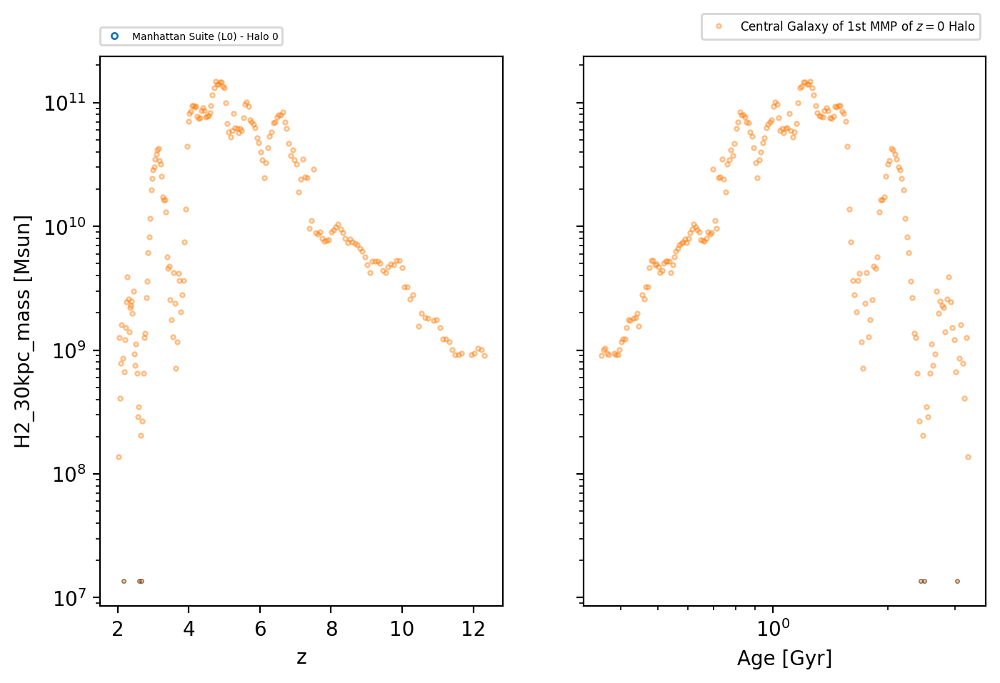


H2_ism_mass

Manhattan Suite (L0) - Halo 0

halo
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219]
[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1

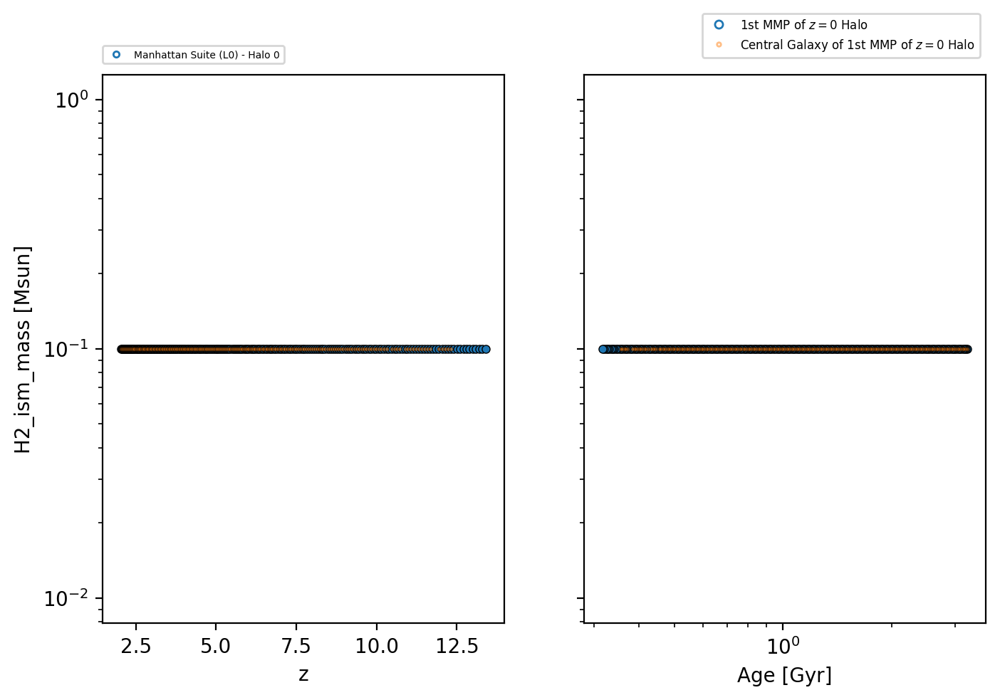


H2_mass

Manhattan Suite (L0) - Halo 0

halo
[210 211 212 213 214 215 216 217 218 219]
8.125773715782383
[13358992.79999998 13358992.79999998 13358992.79999998 13358992.79999998
 13358992.79999998 13358992.79999998 13358992.79999998 13358992.79999998
 13358992.79999998 13358992.79999998]
central
[]
8.966184807707577
[]



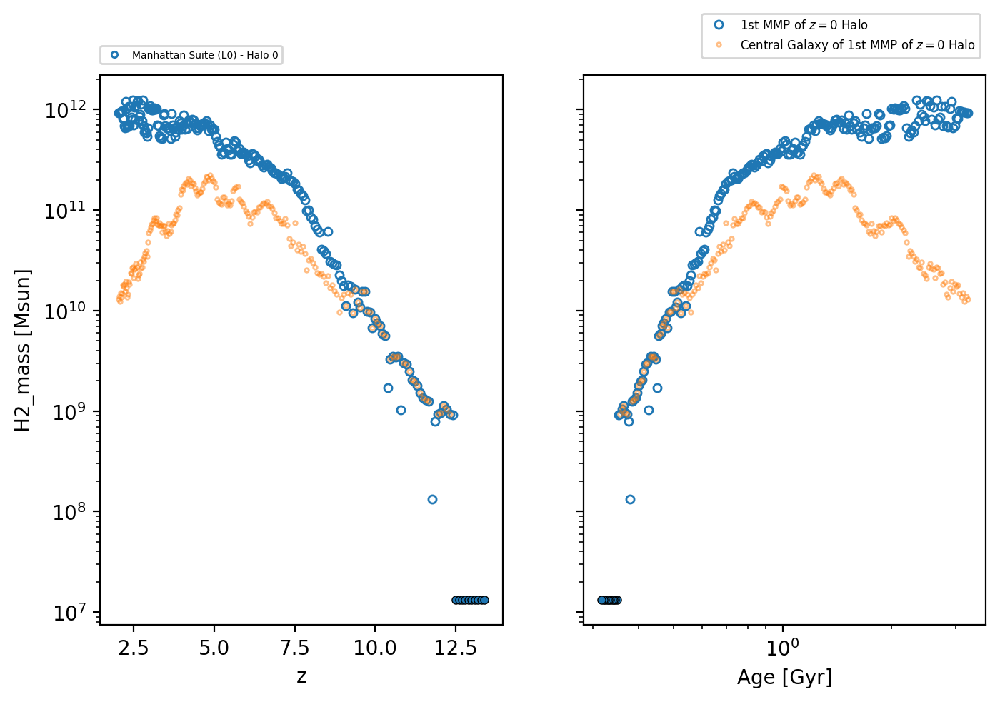


HI_30kpc_mass

Manhattan Suite (L0) - Halo 0

halo
HI_30kpc_mass does not exist
central
[]
1.1745590128227725
[]



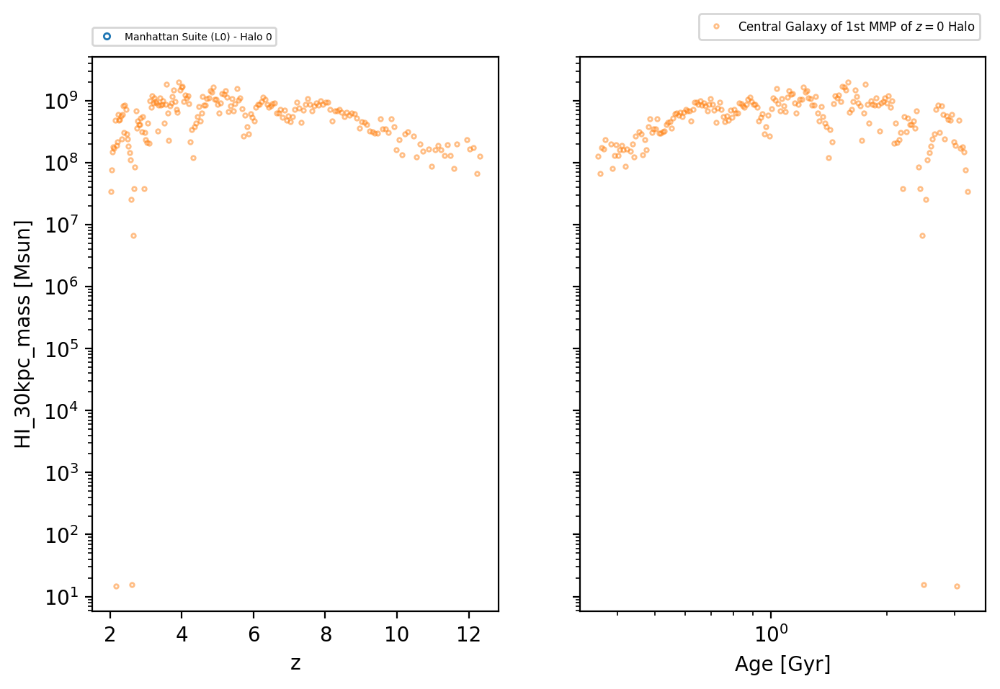


HI_ism_mass

Manhattan Suite (L0) - Halo 0

halo
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219]
[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1

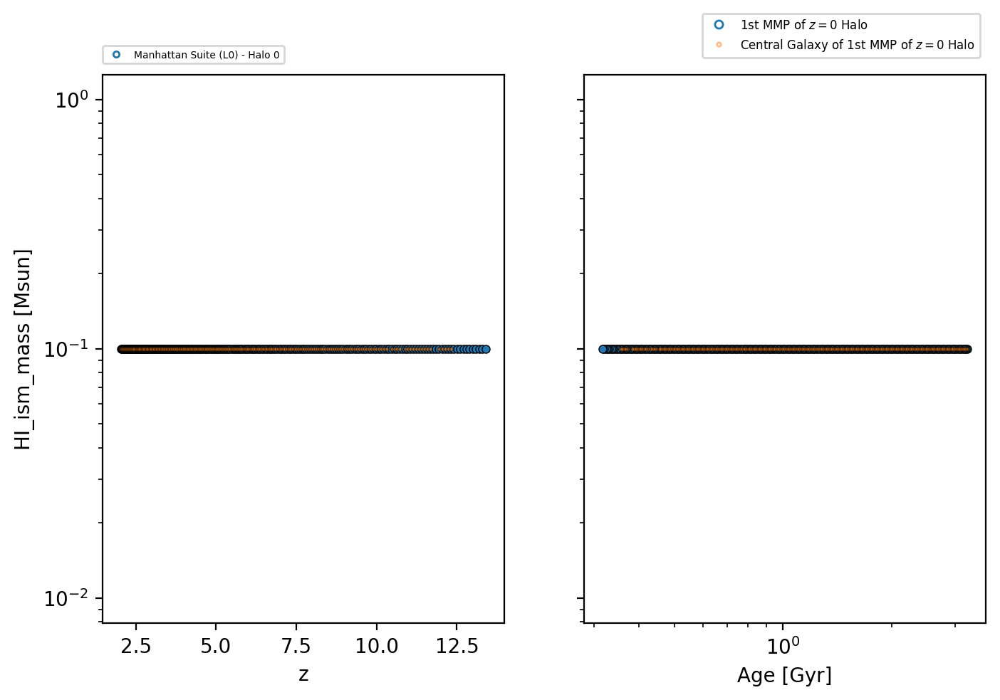


HI_mass

Manhattan Suite (L0) - Halo 0

halo
[]
8.397307409968391
[]
central
[]
9.640947467248482
[]



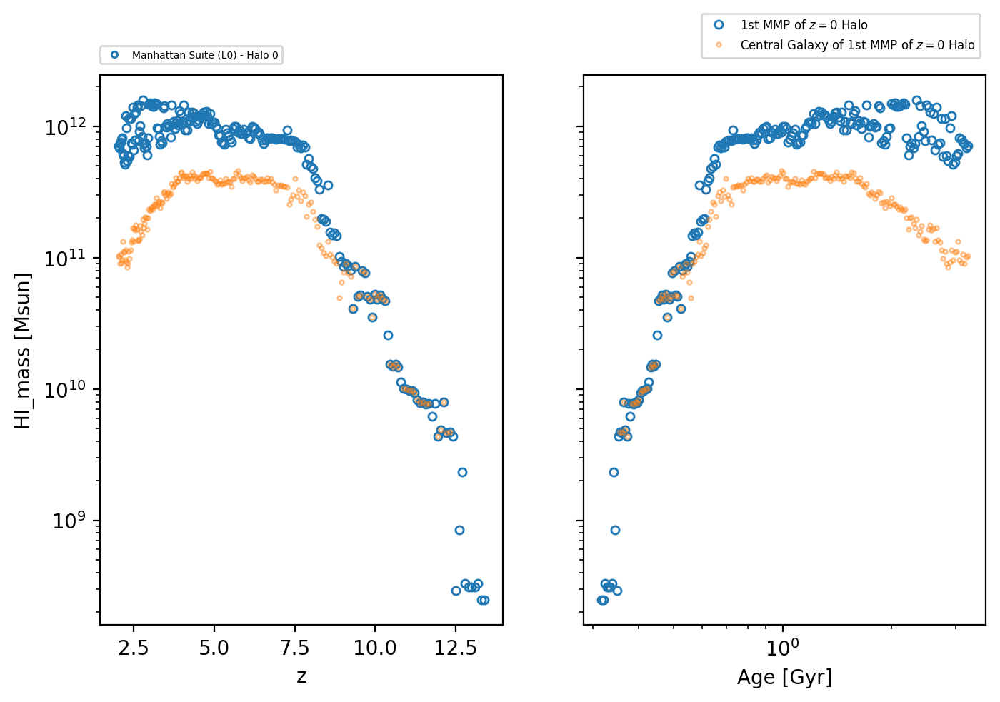


age

Manhattan Suite (L0) - Halo 0

halo
central



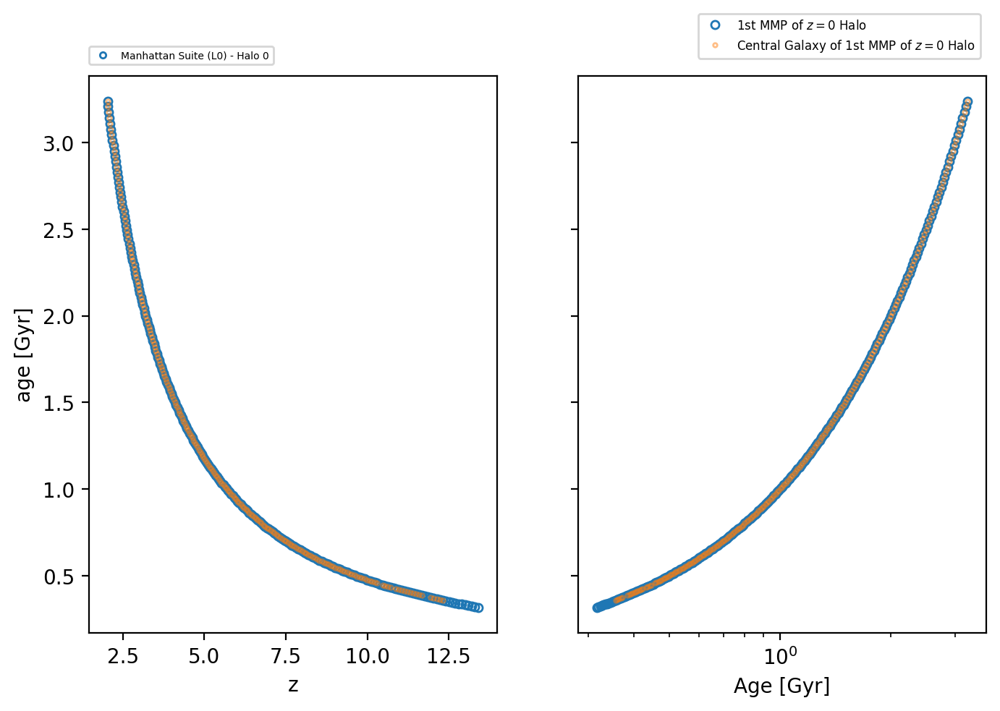


baryon_half_mass_radius

Manhattan Suite (L0) - Halo 0

halo
[]
0.5291138907397998
[]
central
[]
-0.7312890487824123
[]



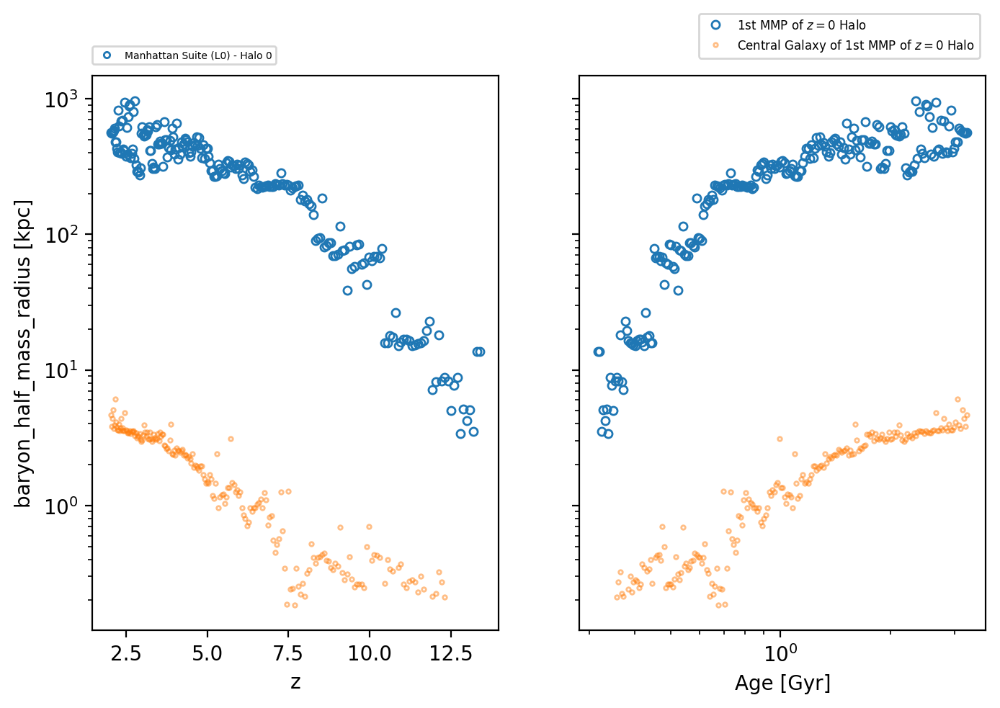


baryon_half_mass_radius_cm

Manhattan Suite (L0) - Halo 0

halo
[]
1.668950236406116
[]
central
[]
0.19692466188851931
[]



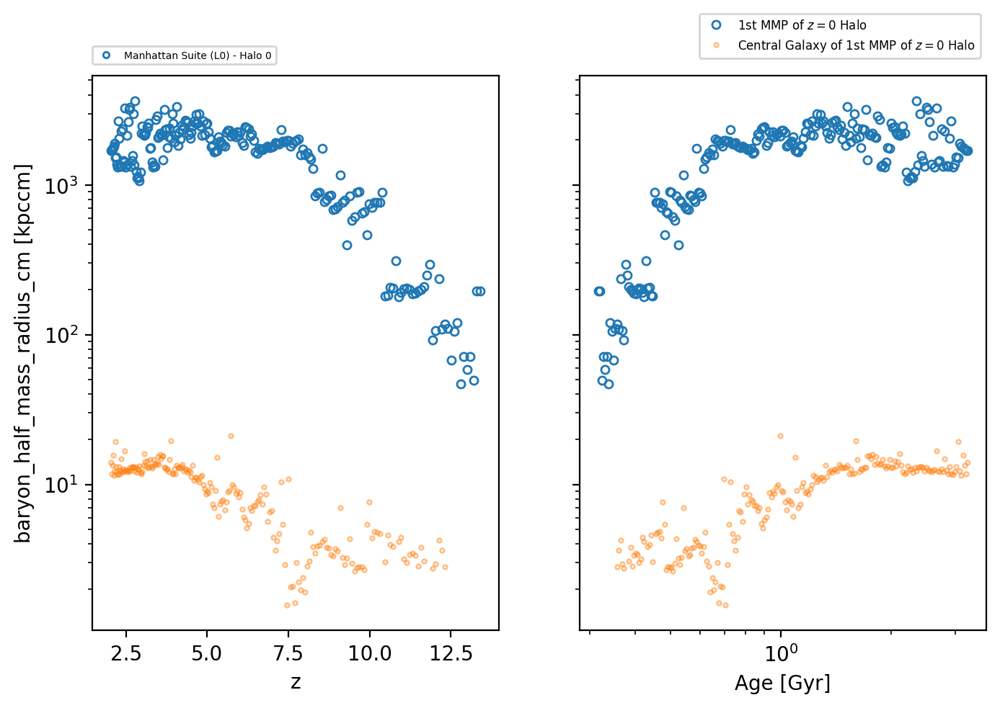


baryon_mass

Manhattan Suite (L0) - Halo 0

halo
[]
8.635856918847642
[]
central
[]
9.33482707103836
[]



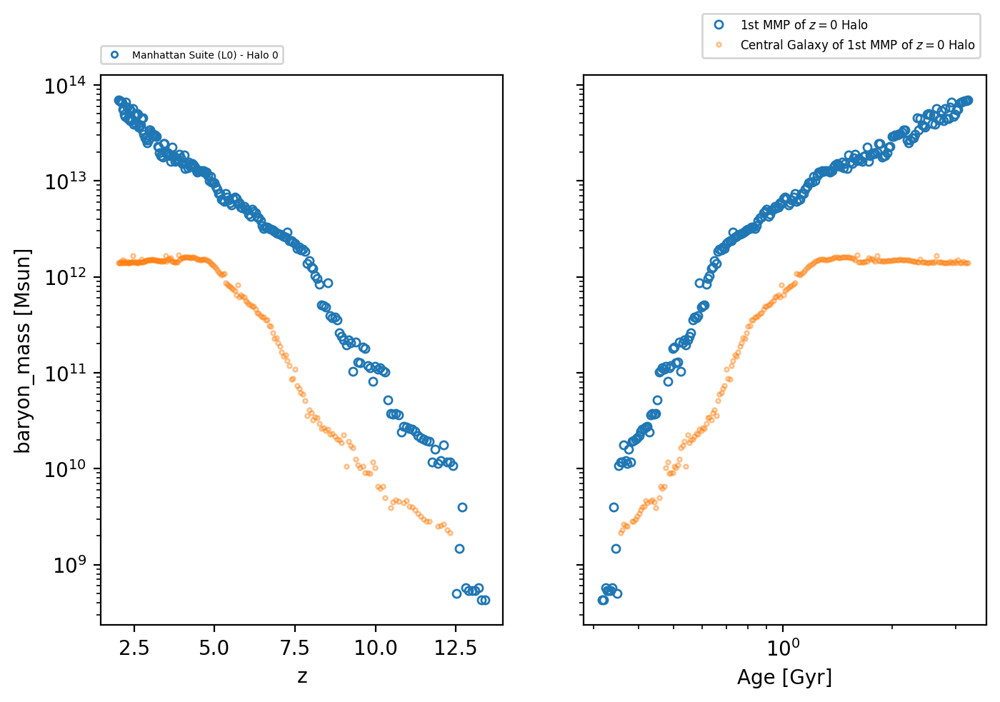


baryon_r20_radius

Manhattan Suite (L0) - Halo 0

halo
[]
-0.29290743155319227
[]
central
[]
-1.0571150089318042
[]



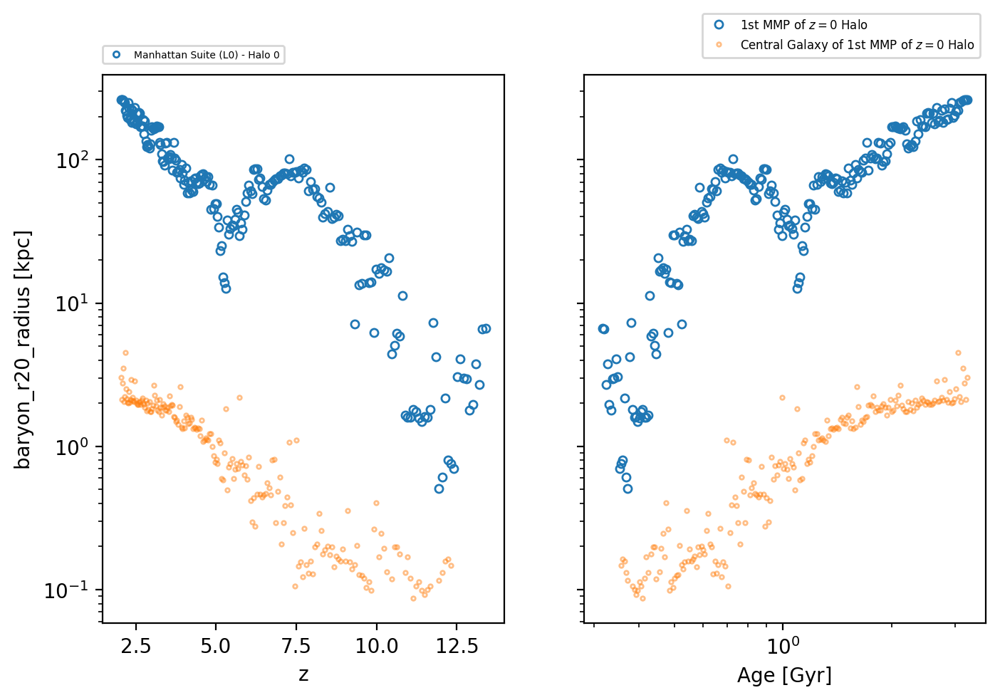


baryon_r20_radius_cm

Manhattan Suite (L0) - Halo 0

halo
[]
0.8191080733076536
[]
central
[]
-0.0482430387996938
[]



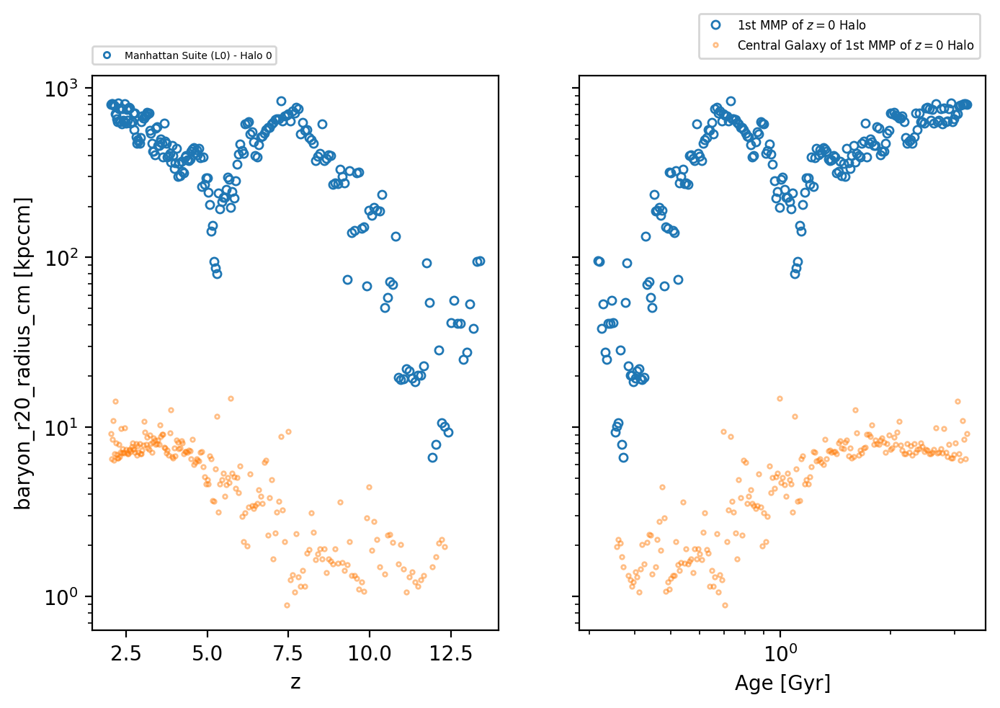


baryon_r80_radius

Manhattan Suite (L0) - Halo 0

halo
[]
0.741961876030056
[]
central
[]
-0.3983717980189912
[]



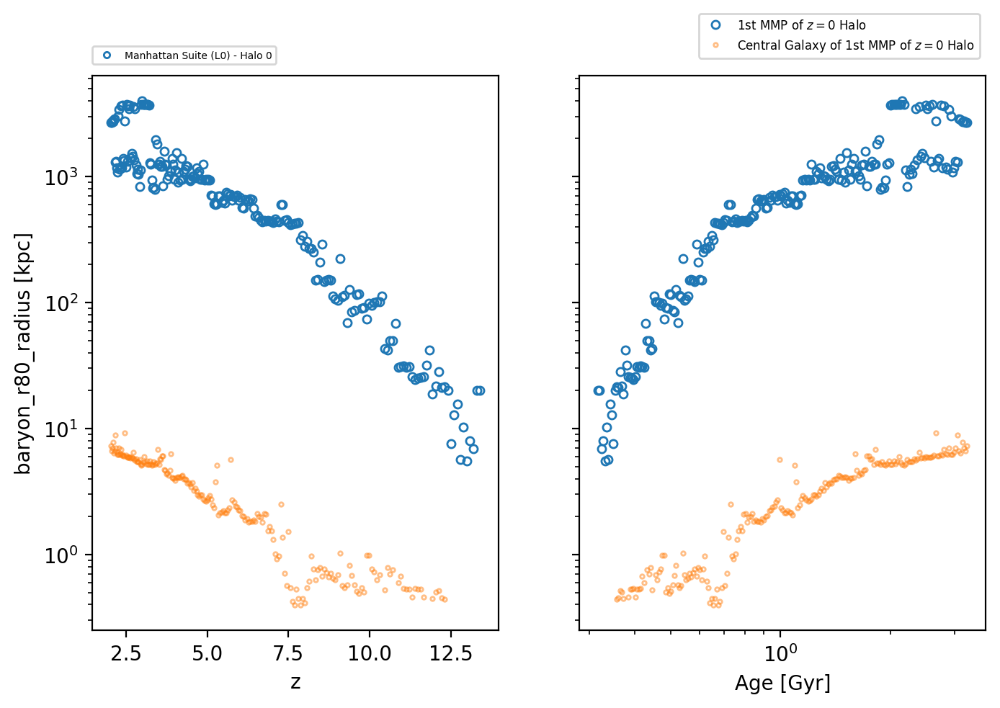


baryon_r80_radius_cm

Manhattan Suite (L0) - Halo 0

halo
[]
1.88798091862158
[]
central
[]
0.5405779722399893
[]



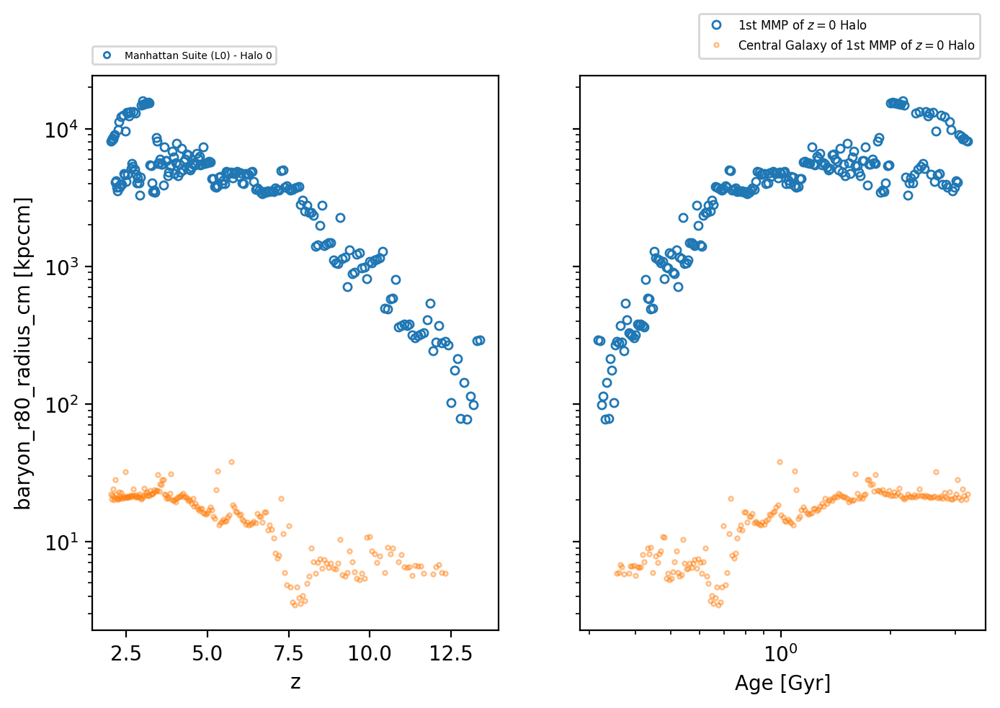


baryon_velocity_dispersion

Manhattan Suite (L0) - Halo 0

halo
central



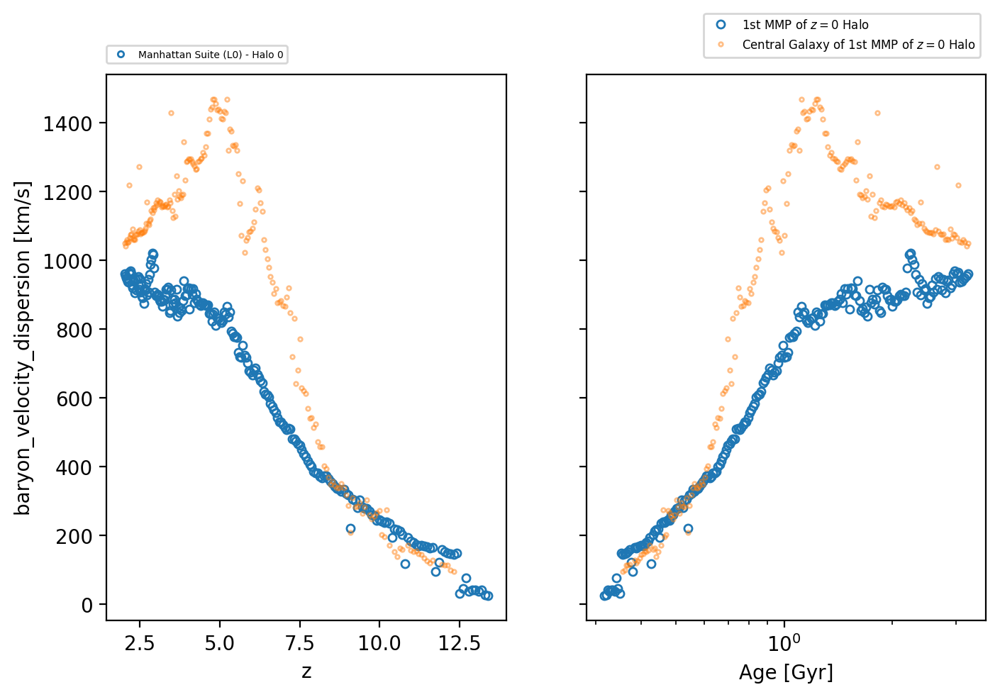


baryon_velocity_dispersion_cm

Manhattan Suite (L0) - Halo 0

halo
central



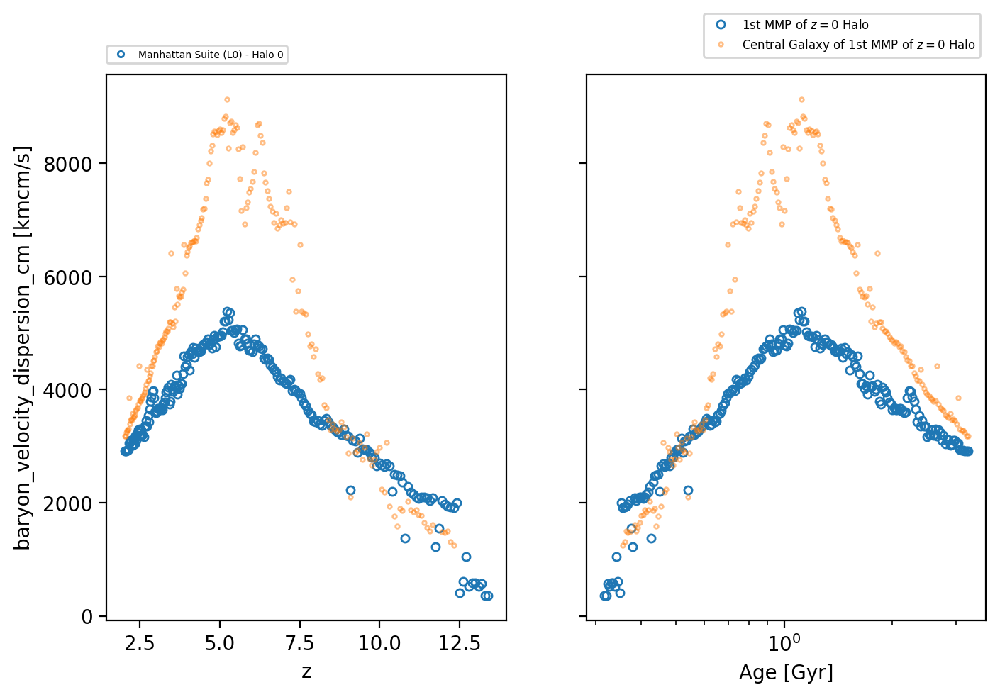


bh_30kpc_mass

Manhattan Suite (L0) - Halo 0

halo
bh_30kpc_mass does not exist
central
[169 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204]
4.206858882043339
[1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328]



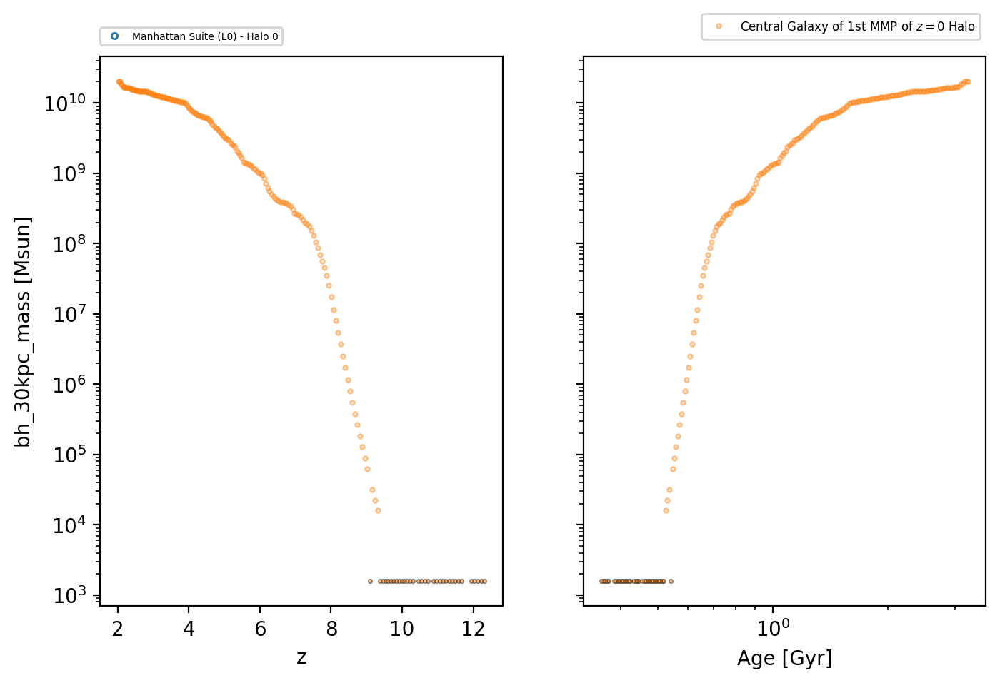


bh_Lbol

Manhattan Suite (L0) - Halo 0

halo
bh_Lbol does not exist
central
[  0   1   2   3   4   5   6   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  26  27  29  30  31  32  33  34  35  36  38  39  41  42
  45  46  48  49  50  51  53  54  55  58  59  60  62  63  64  65  66  75
  77  78  79  80  81  82  85 169]
42.9512110604008
[8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+41 8.93739722e+41
 8.93739722e+41 8.93739722e+41 8.93739722e+

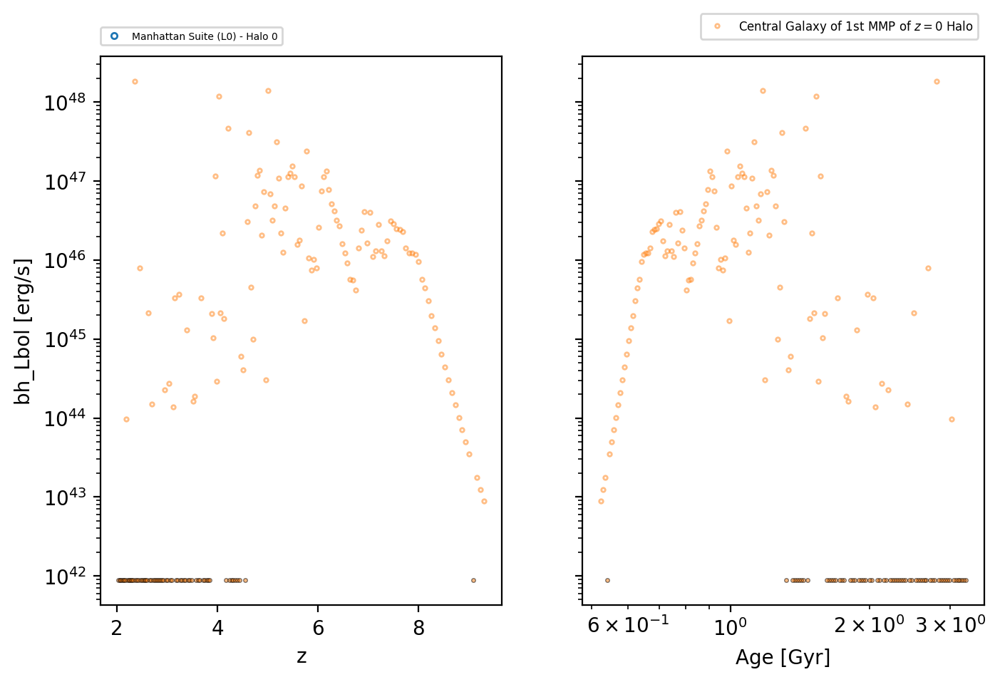


bh_Lbol_30ckpc

Manhattan Suite (L0) - Halo 0

halo
[  0   1   3   4   5   6  13  16  21  22  23  24  26  27  30  31  32  33
  34  35  39  45  46  48  49  50  51  55  59  60  62  63  64  65  66  75
  77  78  79  80  82 169]
31.897618087253864
[7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30 7.89983621e+30 7.89983621e+30
 7.89983621e+30 7.89983621e+30]
central
[  0   1   3   4   5   6  13  16  21  22  23  24  26  27  30  31  32  33
  34  35  39  45  46  48  49  50 

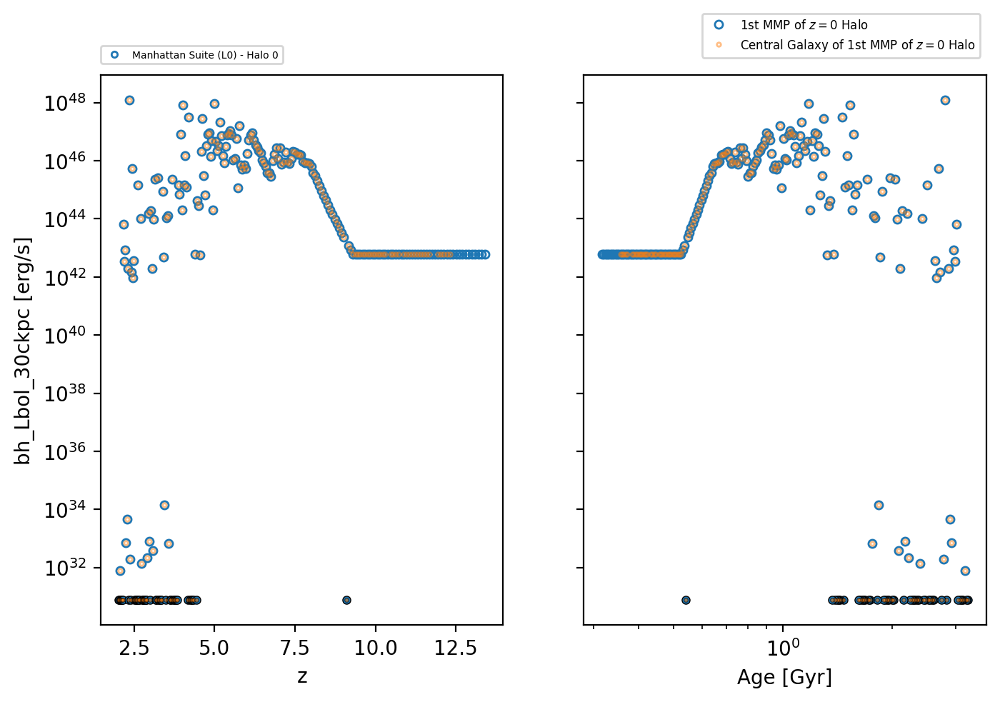


bh_Lbol_3ckpc

Manhattan Suite (L0) - Halo 0

halo
[  0   1   2   3   4   5   6   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  26  27  29  30  31  32  33  34  35  36  38  39  41  42
  45  46  48  49  50  51  53  54  55  58  59  60  62  63  64  65  66  73
  75  77  78  79  80  81  82  85 169]
42.78260948764492
[6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6.06191005e+41 6.06191005e+41 6.06191005e+41 6.06191005e+41
 6

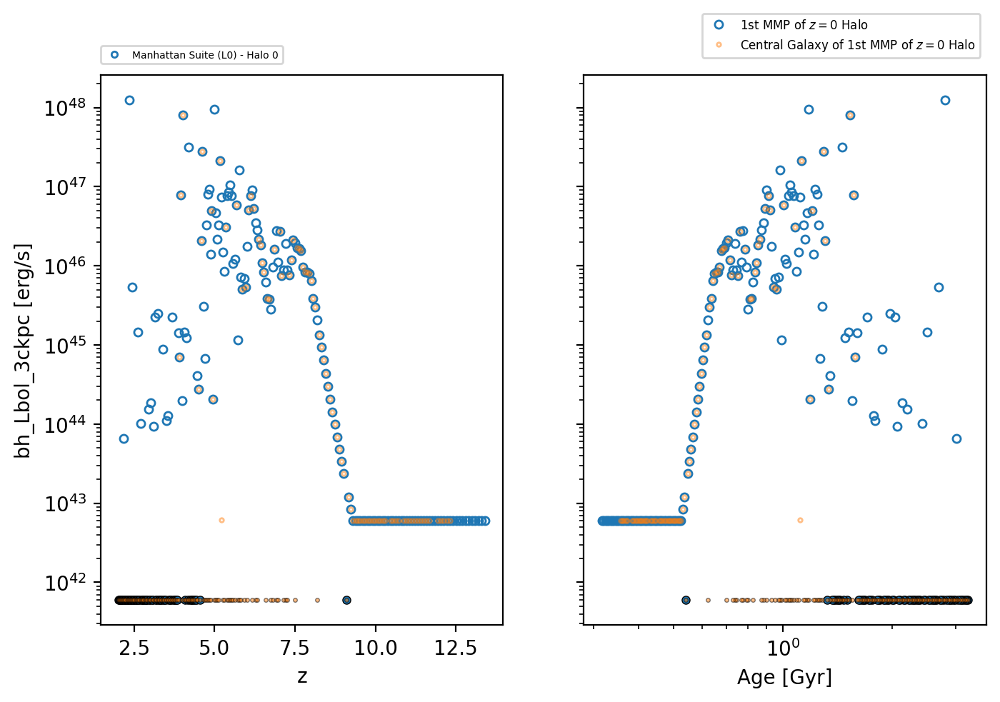


bh_Lbol_50ckpc

Manhattan Suite (L0) - Halo 0

halo
[  0   1   3  16  21  22  23  24  26  27  30  33  39  45  46  48  49  50
  51  55  59  60  62  63  64  66  75  77  79  80  82 169]
31.819260440972343
[6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30
 6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30
 6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30
 6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30
 6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30
 6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30
 6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30
 6.59569312e+30 6.59569312e+30 6.59569312e+30 6.59569312e+30]
central
[  0   1   3  16  21  22  23  24  26  27  30  33  39  45  46  48  49  50
  51  55  59  60  62  63  64  66  75  77  79  80  82 169]
31.73677773449303
[5.45478622e+30 5.45478622e+30 5.45478622e+30 5.45478622e+30
 5.45478622e+30 5.45478622e+30 5.45478622e+30 5.45478622e+30
 5.45478622e+30 5.45478622e+3

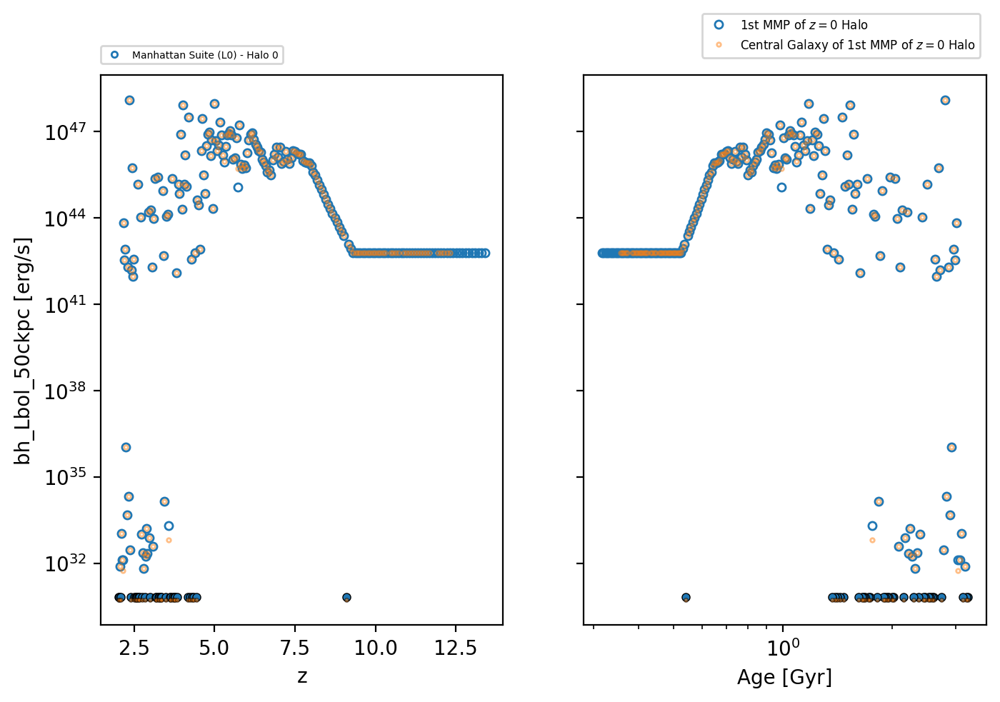


bh_Lbol_acc

Manhattan Suite (L0) - Halo 0

halo
bh_Lbol_acc does not exist
central
[  0   1   2   3   4   5   6   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  26  27  29  30  31  32  33  34  35  36  38  39  41  42
  45  46  48  49  50  51  53  54  55  58  59  60  62  63  64  65  66  75
  77  78  79  80  81  82  85 169]
42.996968550961476
[9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.93044135e+41 9.93044135e+41
 9.93044135e+41 9.93044135e+41 9.

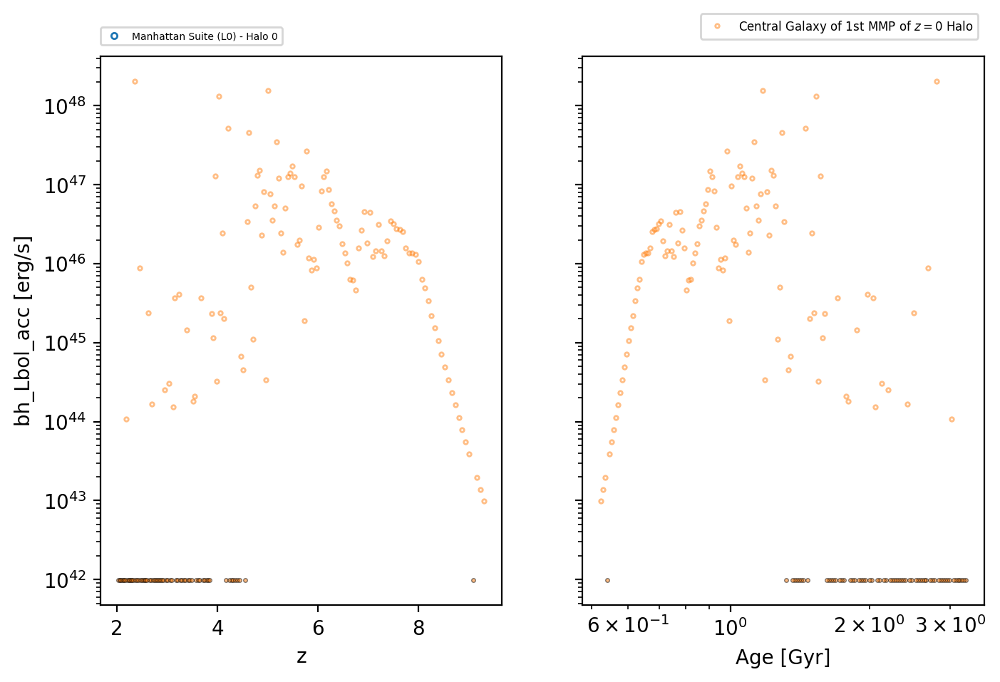


bh_Lbol_acc_30ckpc

Manhattan Suite (L0) - Halo 0

halo
[  0   1   3   4   5   6  13  16  21  22  23  24  26  27  30  31  32  33
  34  35  39  45  46  48  49  50  51  55  59  60  62  63  64  65  66  75
  77  78  79  80  82 169]
31.94337557781454
[8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30 8.77759579e+30 8.77759579e+30
 8.77759579e+30 8.77759579e+30]
central
[  0   1   3   4   5   6  13  16  21  22  23  24  26  27  30  31  32  33
  34  35  39  45  46  48  49  

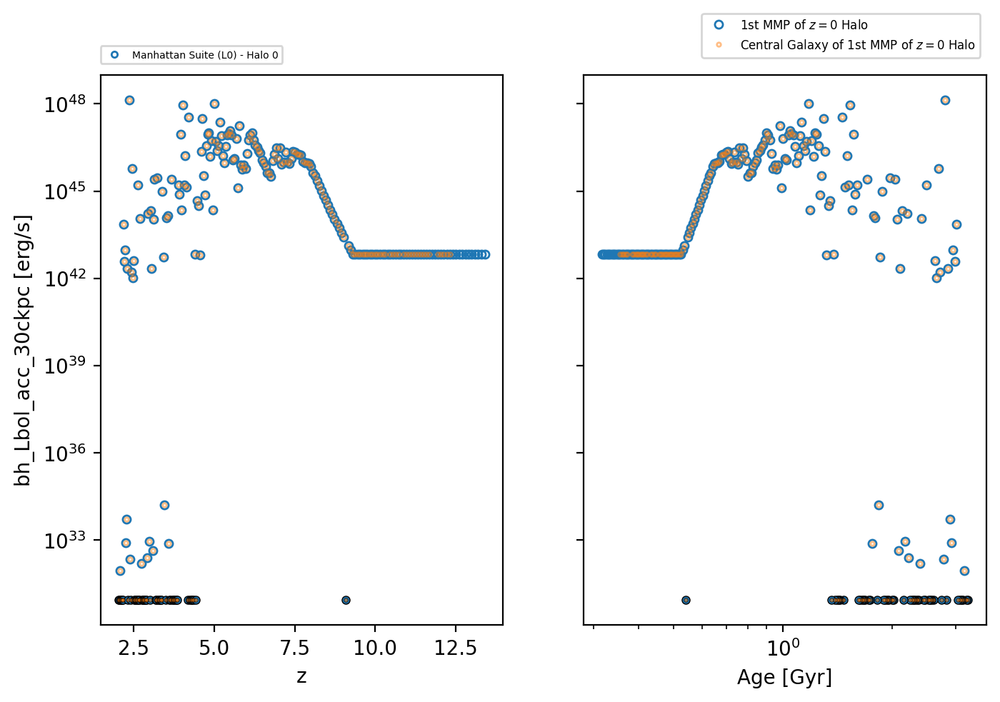


bh_Lbol_acc_3ckpc

Manhattan Suite (L0) - Halo 0

halo
[  0   1   2   3   4   5   6   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  26  27  29  30  31  32  33  34  35  36  38  39  41  42
  45  46  48  49  50  51  53  54  55  58  59  60  62  63  64  65  66  73
  75  77  78  79  80  81  82  85 169]
42.828366978205594
[6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+41
 6.73545561e+41 6.73545561e+41 6.73545561e+41 6.73545561e+

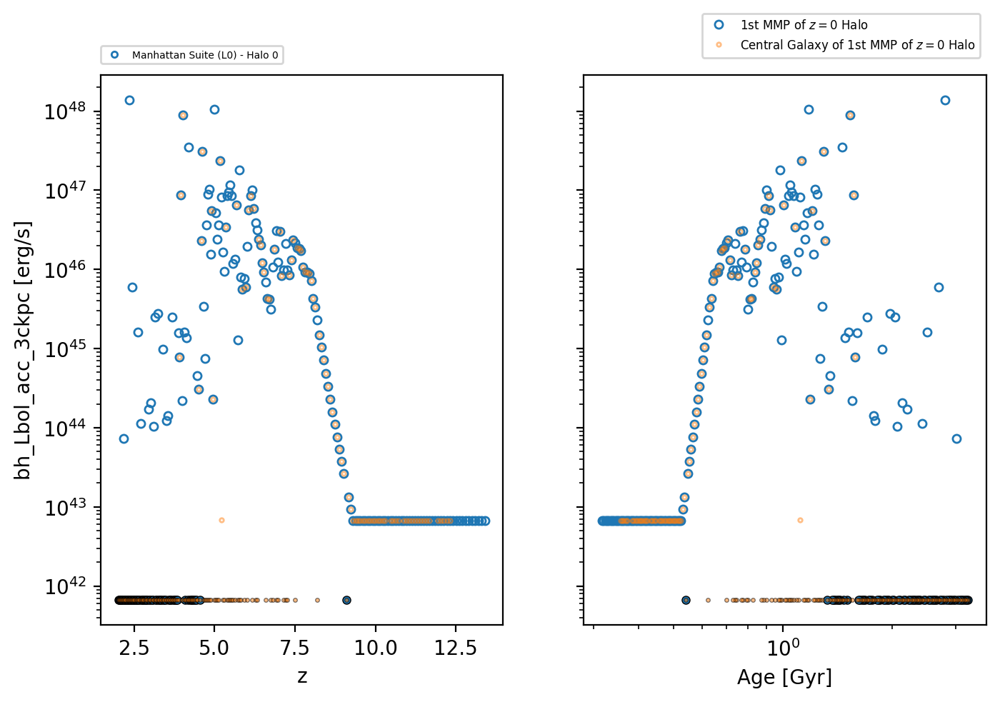


bh_Lbol_acc_50ckpc

Manhattan Suite (L0) - Halo 0

halo
[  0   1   3  16  21  22  23  24  26  27  30  33  39  45  46  48  49  50
  51  55  59  60  62  63  64  66  75  77  79  80  82 169]
31.865017931533018
[7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30
 7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30
 7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30
 7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30
 7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30
 7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30
 7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30
 7.32854791e+30 7.32854791e+30 7.32854791e+30 7.32854791e+30]
central
[  0   1   3  16  21  22  23  24  26  27  30  33  39  45  46  48  49  50
  51  55  59  60  62  63  64  66  75  77  79  80  82 169]
31.782535225053707
[6.06087357e+30 6.06087357e+30 6.06087357e+30 6.06087357e+30
 6.06087357e+30 6.06087357e+30 6.06087357e+30 6.06087357e+30
 6.06087357e+30 6.060873

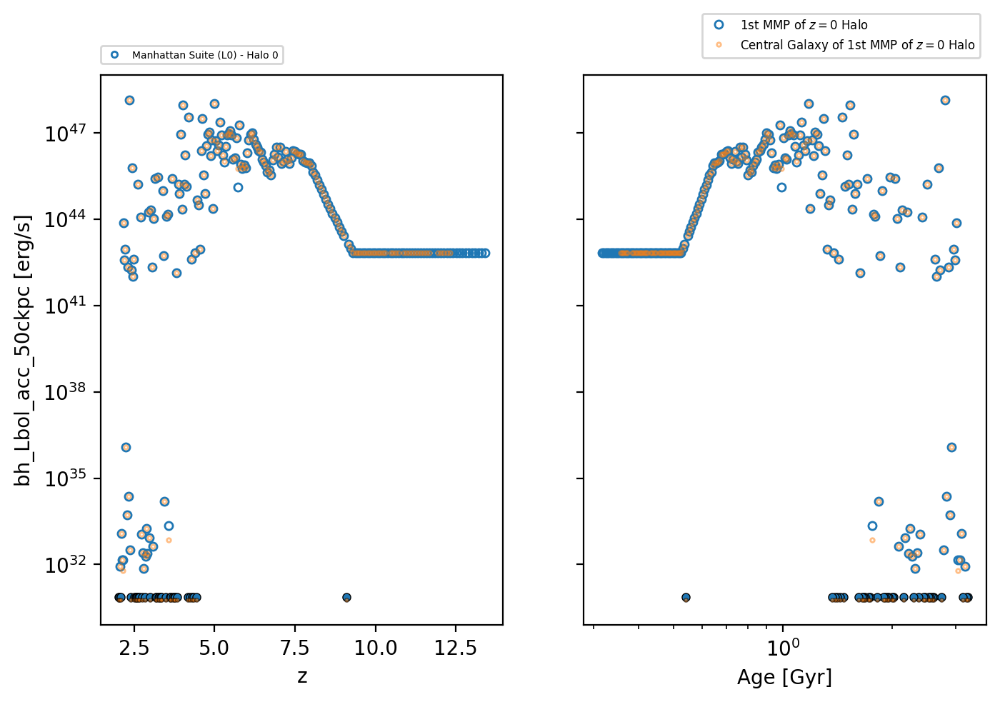


bh_fedd

Manhattan Suite (L0) - Halo 0

halo
bh_fedd does not exist
central
[  0   1   2   3   4   5   6   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  26  27  29  30  31  32  33  34  35  36  38  39  41  42
  45  46  48  49  50  51  53  54  55  58  59  60  62  63  64  65  66  75
  77  78  79  80  81  82  85 169]
-4.33793118463893
[4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06 4.5927078e-06
 4.5927078e-0

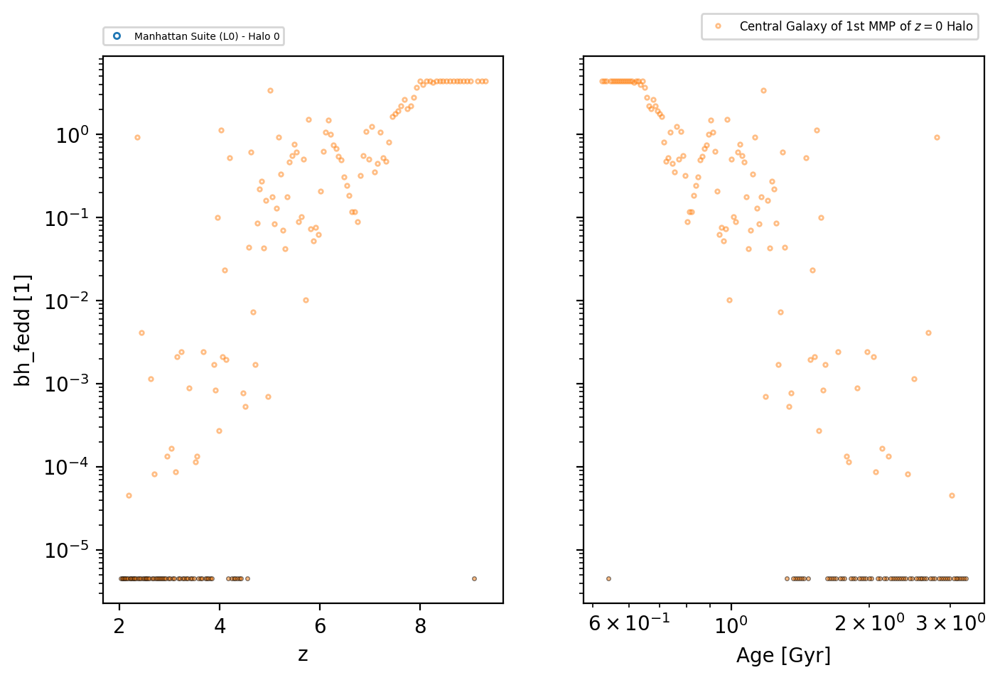


bh_mass

Manhattan Suite (L0) - Halo 0

halo
[169 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207
 208 209 210 211 212 213 214 215 216 217 218 219]
4.206858882043339
[1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328 1610.12236328 1610.12236328
 1610.12236328 1610.12236328 1610.12236328]
central
[169 173 174 175 176 177 178 179 180 181 182 183 

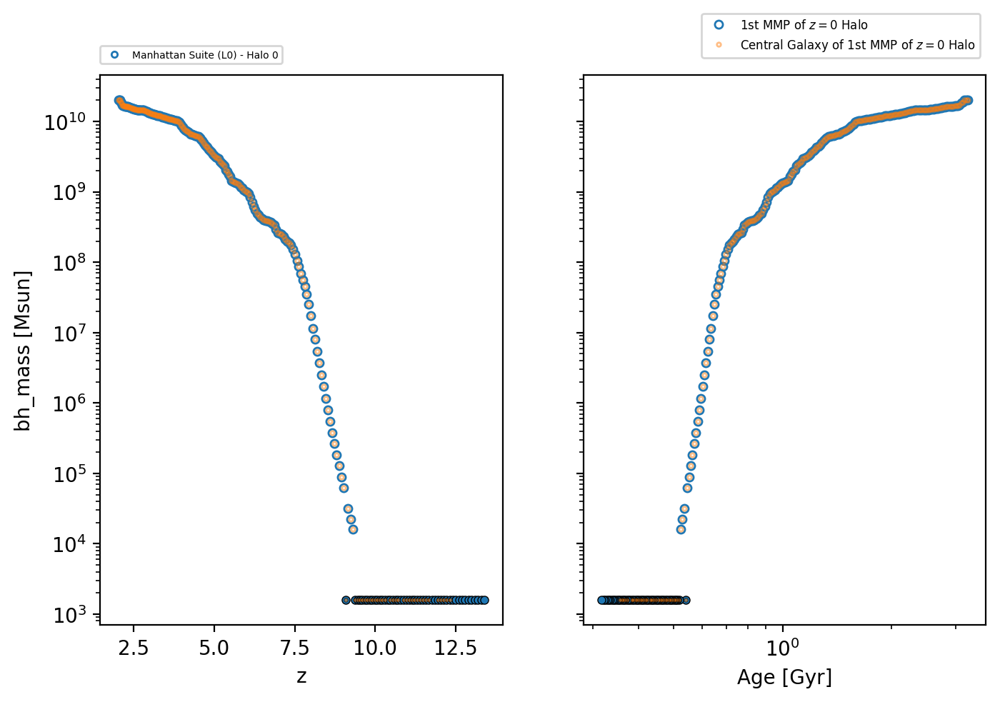


bh_mdot

Manhattan Suite (L0) - Halo 0

halo
bh_mdot does not exist
central
[  0   1   2   3   4   5   6   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  26  27  29  30  31  32  33  34  35  36  38  39  41  42
  45  46  48  49  50  51  53  54  55  58  59  60  62  63  64  65  66  75
  77  78  79  80  81  82  85 169]
-2.8018335968696864
[0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782 0.00015782
 0.00015782 0.00015782 0.00015782 0.00015782 0.

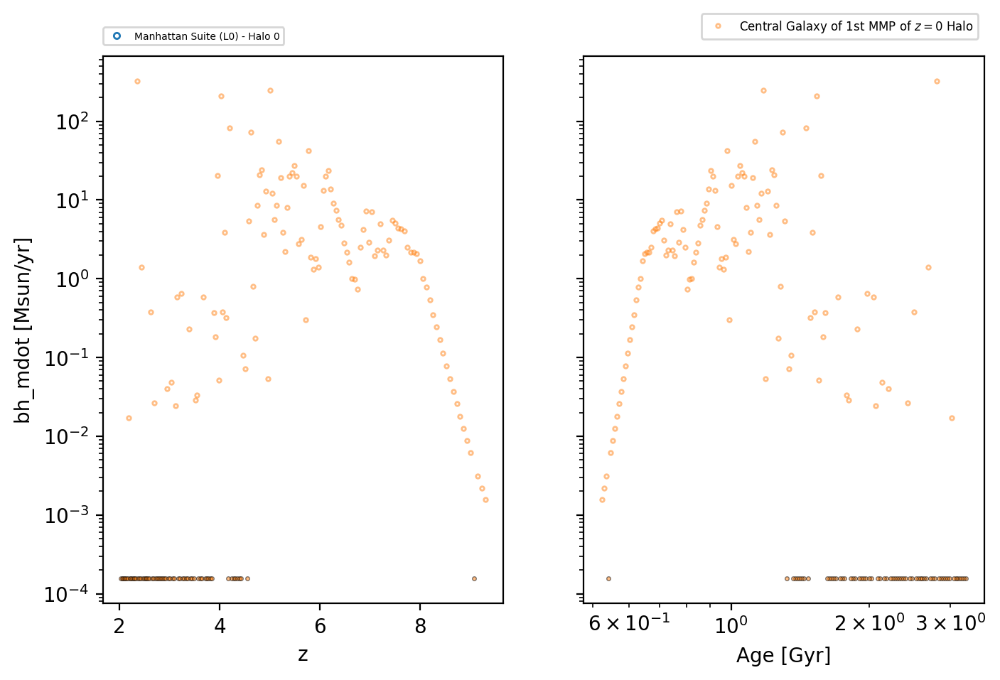


bh_mdot_acc

Manhattan Suite (L0) - Halo 0

halo
bh_mdot_acc does not exist
central
[  0   1   2   3   4   5   6   8   9  10  11  12  13  15  16  17  19  20
  21  22  23  24  26  27  29  30  31  32  33  34  35  36  38  39  41  42
  45  46  48  49  50  51  53  54  55  58  59  60  62  63  64  65  66  75
  77  78  79  80  81  82  85 169]
-2.756076106309011
[0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536 0.00017536
 0.00017536 0.00017536 0.00017536 0.0001

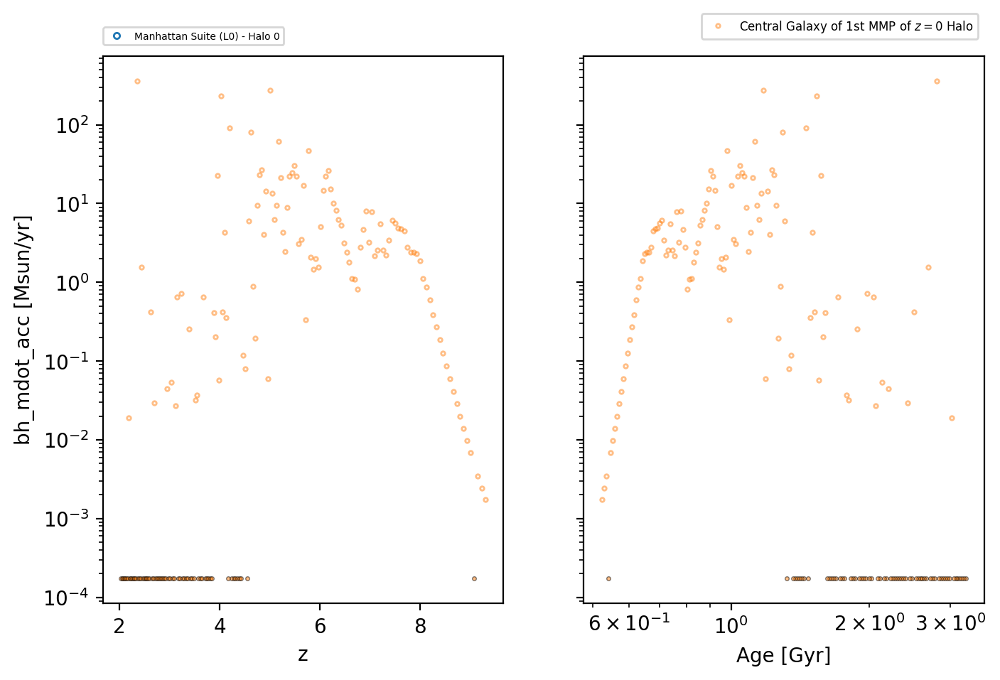


bh_mdot_edd

Manhattan Suite (L0) - Halo 0

halo
bh_mdot_edd does not exist
central
[]
nan
[]



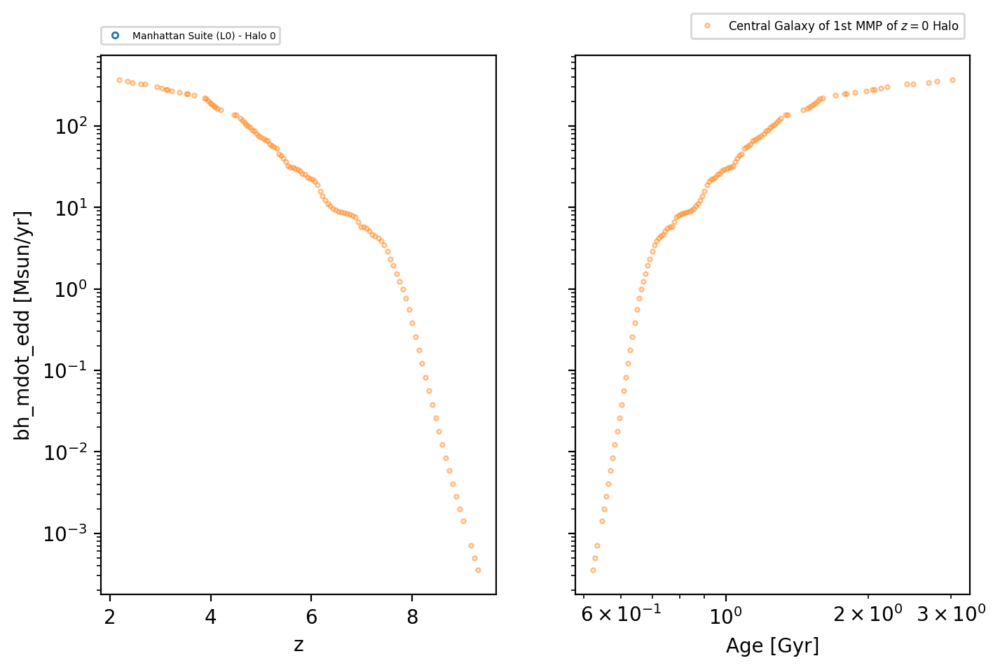


bh_stellar_half_mass_radius_mass

Manhattan Suite (L0) - Halo 0

halo
bh_stellar_half_mass_radius_mass does not exist
central
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204]
[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1

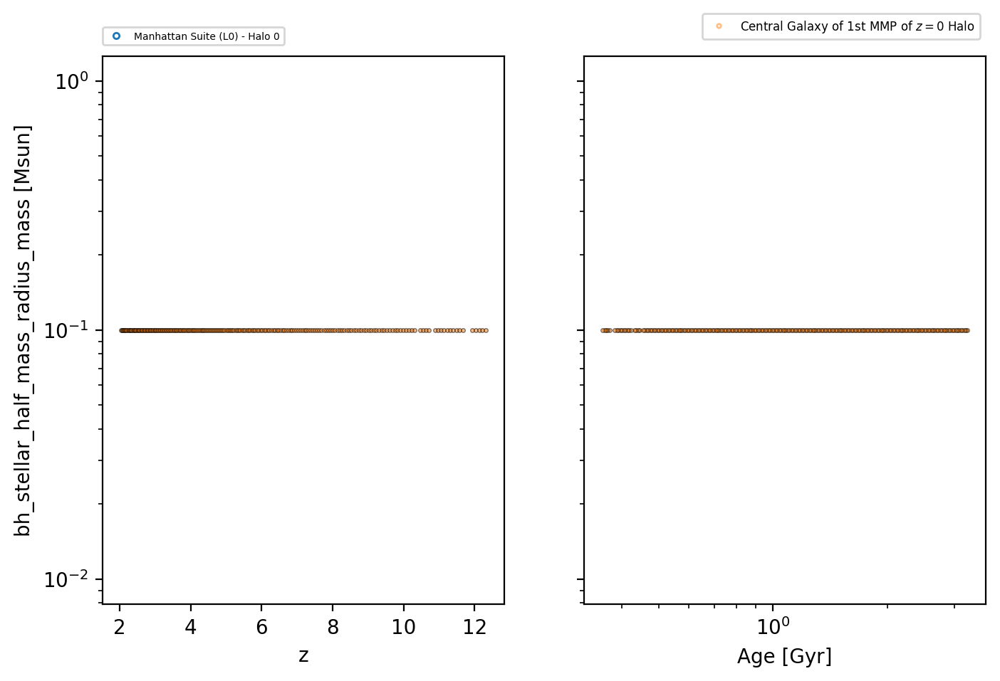


compos_x_cm

Manhattan Suite (L0) - Halo 0

halo
central



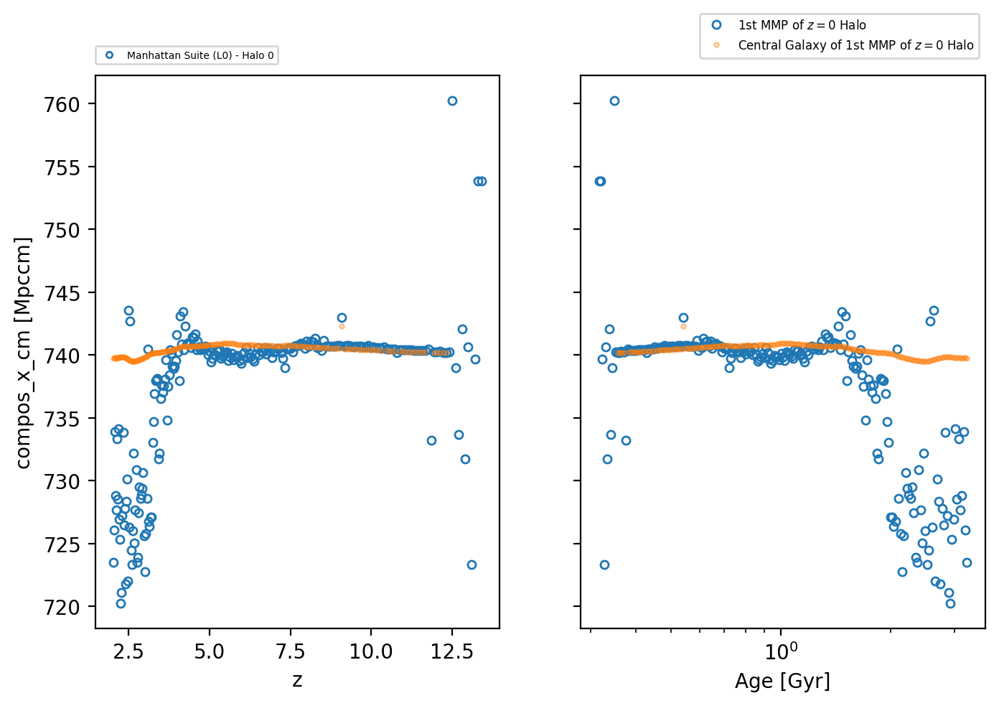


compos_x_phys

Manhattan Suite (L0) - Halo 0

halo
central



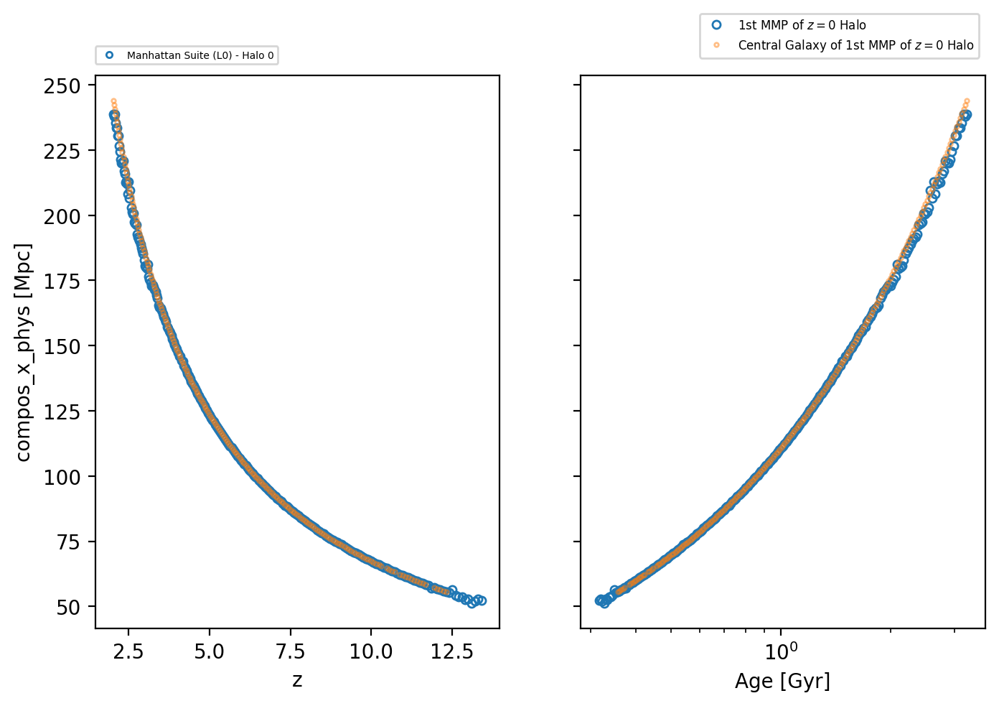


compos_y_cm

Manhattan Suite (L0) - Halo 0

halo
central



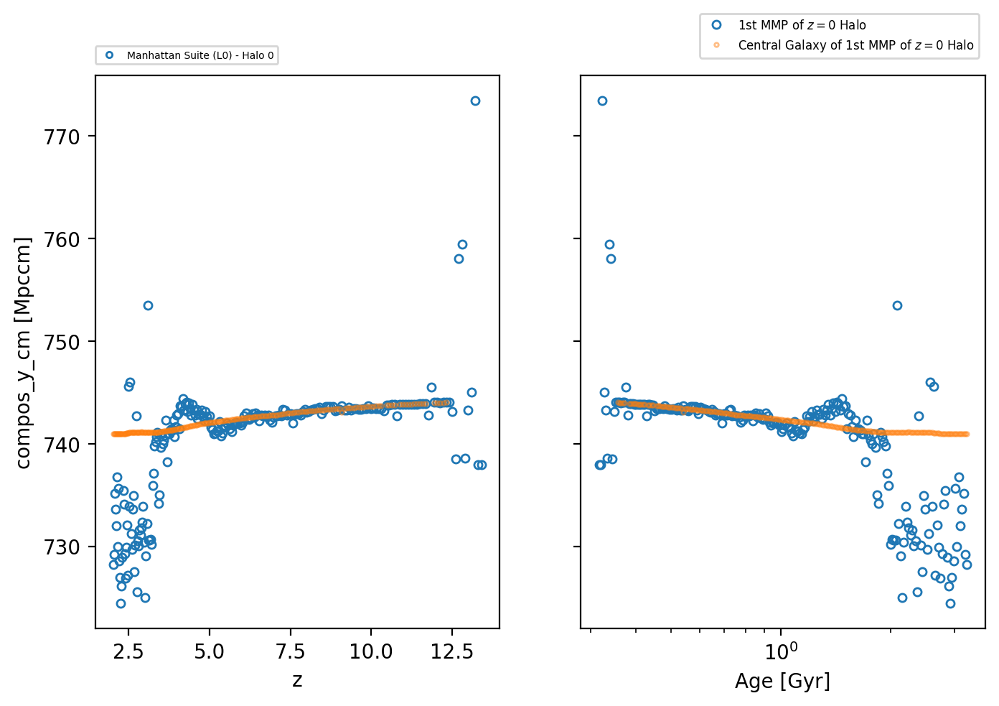


compos_y_phys

Manhattan Suite (L0) - Halo 0

halo
central



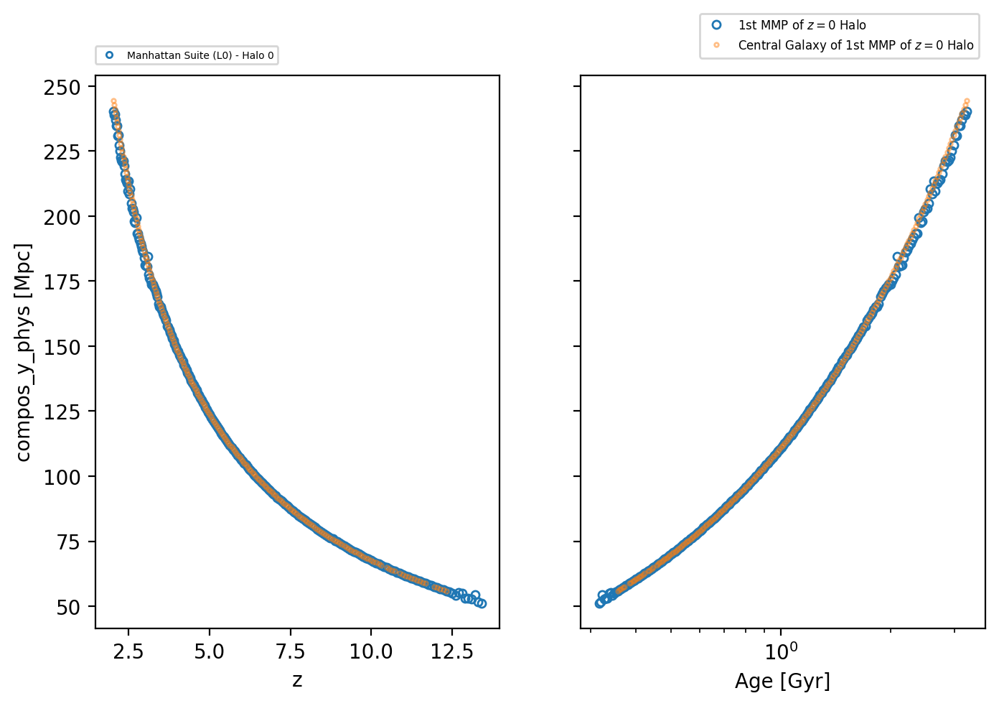


compos_z_cm

Manhattan Suite (L0) - Halo 0

halo
central



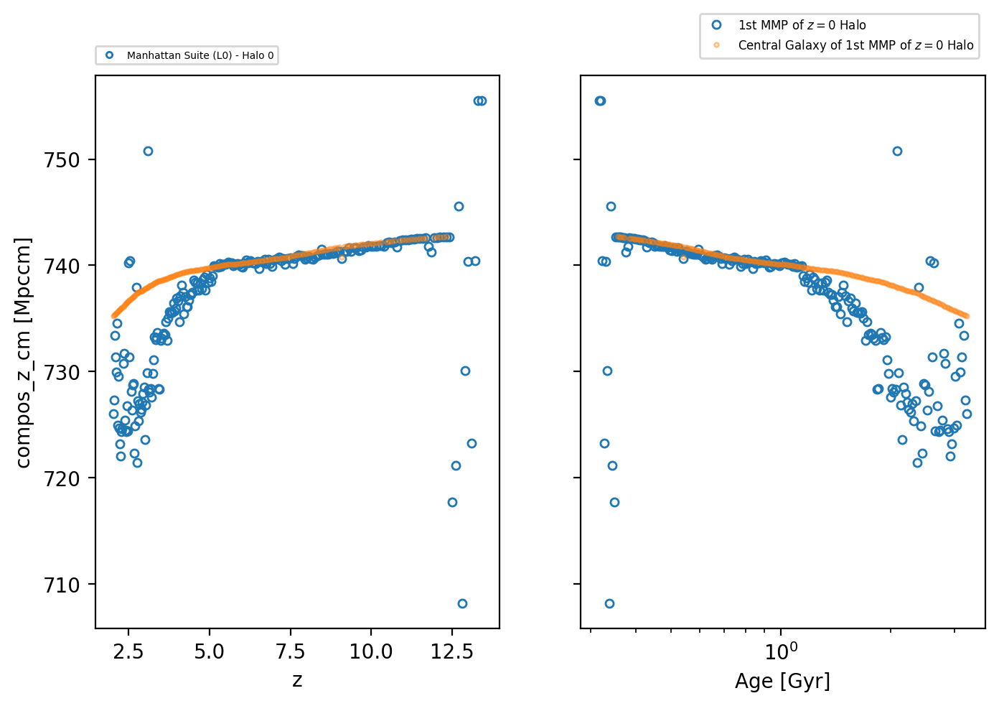


compos_z_phys

Manhattan Suite (L0) - Halo 0

halo
central



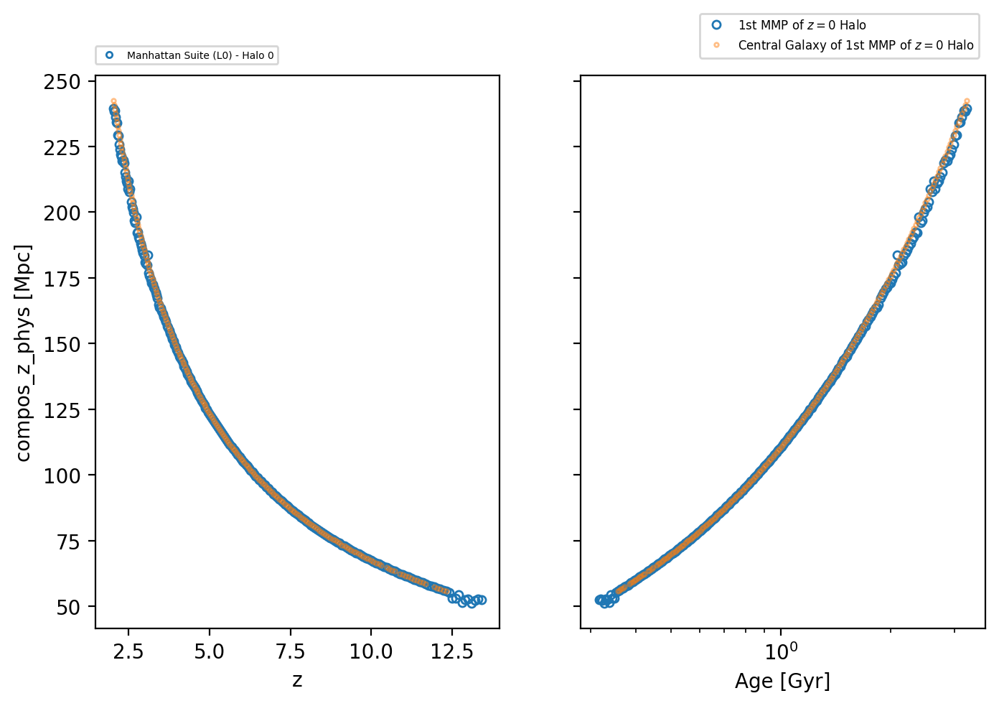


delta_t

Manhattan Suite (L0) - Halo 0

halo
central



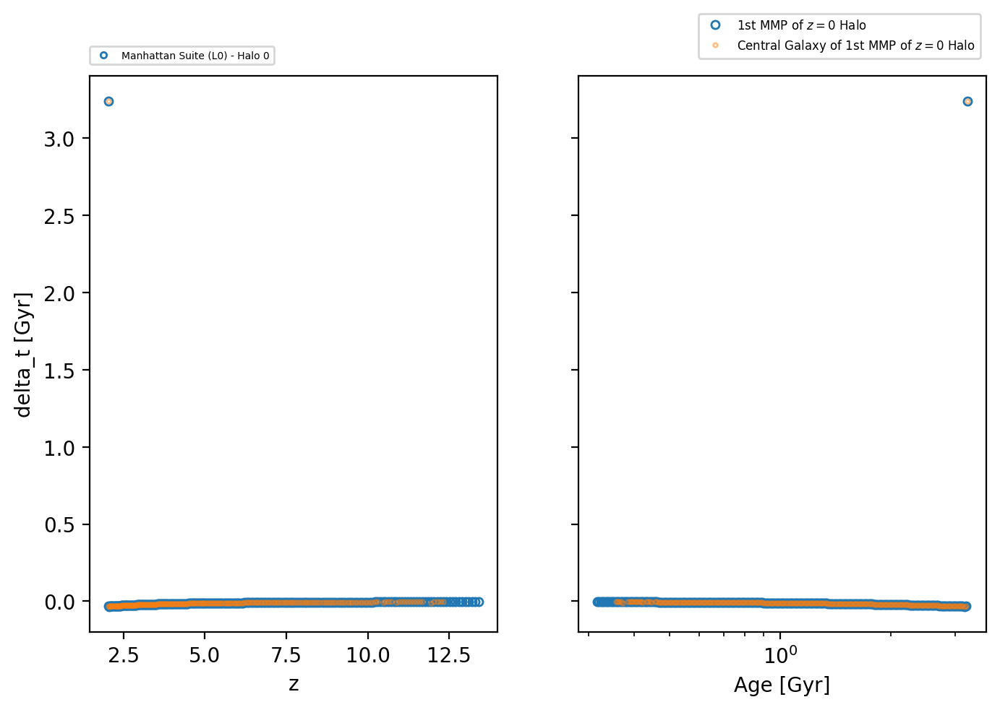


dm2_30kpc_mass

Manhattan Suite (L0) - Halo 0

halo
dm2_30kpc_mass does not exist
central



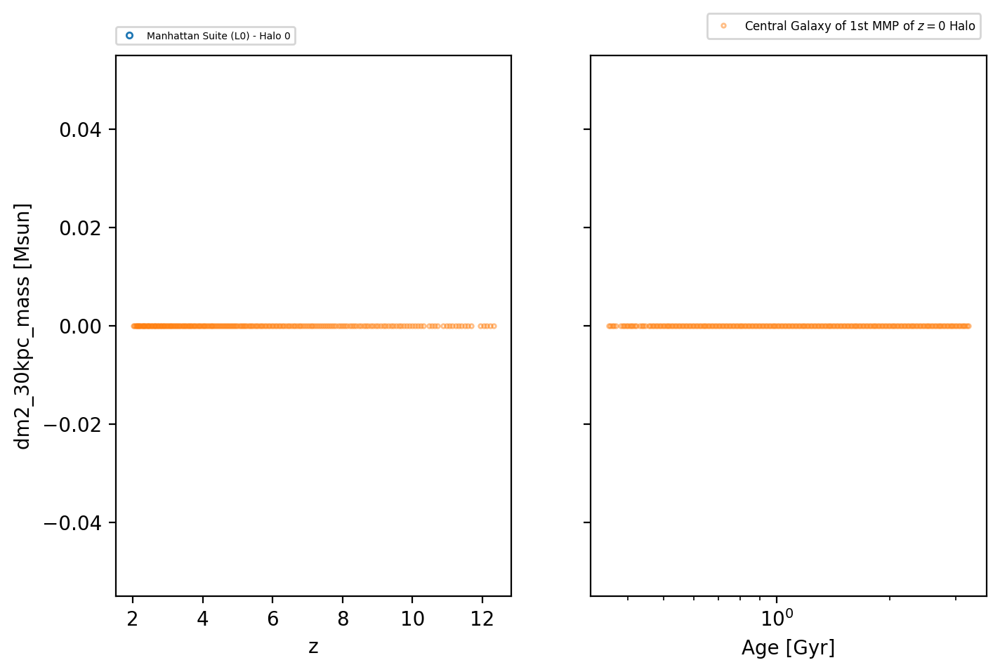


dm2_stellar_half_mass_radius_mass

Manhattan Suite (L0) - Halo 0

halo
dm2_stellar_half_mass_radius_mass does not exist
central
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204]
[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0

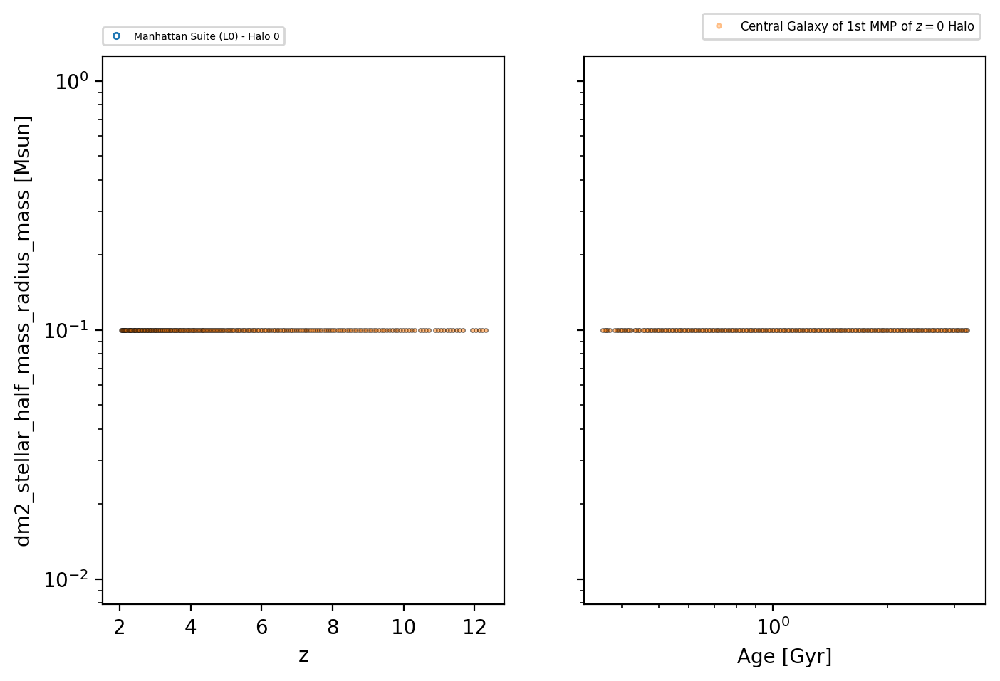


dm_30kpc_mass

Manhattan Suite (L0) - Halo 0

halo
dm_30kpc_mass does not exist
central
[]
10.042009855501213
[]



KeyboardInterrupt: 

In [8]:
sim_markers = ['o', '+', '^', 'x']
# sim_markers = ['o', 'o', '+', '^', 'x']
# sim_markers = ['+', '^', 'x']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['first_mmp_halo']#, 'second_mmp_halo']
# obj_types = ['first_mmp_halo']#, 'first_mmp_central_halo']
# obj_types = ['first_mmp_halo', 'first_mmp_halo_central']
# obj_types = ['first_mmp_halo_central']
obj_types = ['halo', 'central']
# obj_types = ['first_mmp_central']#, 'second_mmp_central']
# obj_types = ['first_mmp_central', 'first_mmp_halo_central']
# obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    # r'1st MMP of $z=0$ Halo', r'2nd MMP of $z=0$ Halo',
    # r'1st MMP of $z=0$ Halo', #r'Halo of 1st MMP of $z=0$ Central Galaxy',
    r'1st MMP of $z=0$ Halo', r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'1st MMP of $z=0$ Central Galaxy', r'2nd MMP of $z=0$ Central Galaxy',
    # r'1st MMP of $z=0$ Central Galaxy', r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# colors = ['C0', 'C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
# sizes = [3, 2, 3, 2]
sizes = [4, 2]
# sizes = [2, 4]
# sizes = [6, 4, 2]
# obj_markers = []
alphas = [1, 0.5]
# alphas = [0.5, 1]

for prop in props:
    print(prop)
    print()
    # if prop_name in ['z', 'age', 'snap_num']: continue

    fig, ax = plt.subplots(num=1, figsize=(8,5),
                           nrows=1, ncols=2, sharey='row')
    fig.set_dpi(200)


    handle_list = []
    # label = None
    # sim_counter = 0
    plotted_sim_counter = 0
    for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
        print(sim)
        print()
        
        # marker = sim_info['marker']
        curr_handle= Line2D([], [], color=colors[sim_counter], ls='',
                            marker=sim_markers[sim_counter], ms=3,
                            mfc='none', label=sim)
        # curr_handle= Line2D([], [], color='grey', ls='',
        #                     marker=sim_markers[sim_counter], ms=3,
        #                     mfc='none', label=sim)
        handle_list.append(curr_handle)

        plotted = False
        for obj_counter, obj_type in enumerate(obj_types):
            print(obj_type)
            x1 = sim_info['halo_props'][obj_type]['z']
            x2 = sim_info['halo_props'][obj_type]['age']

            try:
                y = sim_info['halo_props'][obj_type][prop]
            except:
                print(f'{prop} does not exist')
                continue
            plotted = True

            if plotted_sim_counter == 0:
                # if label == None:
                label = obj_names[obj_counter]
            else:
                label = None

            # color = colors[sim_counter]
            color = colors[obj_counter]
            alpha = alphas[obj_counter]
            size = sizes[obj_counter]

            try:
                ax[0].plot(x1[:], y[:], 
                           marker=sim_markers[sim_counter],
                           mfc='none', mec=color,
                           # mfc=color, mec=color,
                           ms=size, alpha=alpha,
                           ls='', label=label)
                ax[1].plot(x2[:], y[:], 
                           marker=sim_markers[sim_counter],
                           mfc='none', mec=color,
                           # mfc=color, mec=color,
                           ms=size, alpha=alpha,
                           ls='', label=label)
            except Exception as error:
                print(f'Could not plot: {error}')
                continue
            # label = 0
            # ax[1].plot(x2, y, marker=sim_markers[sim_counter], ms=obj_sizes[obj_counter],
            #            mfc='none', mec=mec, ls='', label=label)

            ## Plot all 0 values as 1 dex below minimum nonzero value
            # if prop_name in log_base_props:
            if prop in log_props:
                zero_value_indexes = np.where(np.array(y[:])==0)[0]
                nonzero_value_indexes = np.where(np.array(y[:])!=0)[0]
                print(zero_value_indexes)
                try:
                    print(min(np.log10(np.array(y[:])[nonzero_value_indexes])))
                    zero_value_for_plotting = np.array([10**(min(np.log10(np.array(y[:])[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
                except:
                    zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
                print(zero_value_for_plotting)

                ax[0].plot(np.array(x1[:])[zero_value_indexes], zero_value_for_plotting, 
                           marker=sim_markers[sim_counter],
                           mfc=color, ms=size, alpha=alpha,
                           mec='black', mew=0.5, ls='')
                ax[1].plot(np.array(x2[:])[zero_value_indexes], zero_value_for_plotting, 
                           marker=sim_markers[sim_counter],
                           mfc=color, ms=size, alpha=alpha,
                           mec='black', mew=0.5, ls='')
                # ax[0].plot(np.array(x1)[zero_value_indexes], zero_value_for_plotting, 
                #            marker=marker, ms=ms, mec=mec, mfc=mec, ls='')
                # ax[1].plot(np.array(x2)[zero_value_indexes], zero_value_for_plotting, 
                #            marker=marker, ms=ms, mec=mec, mfc=mec, ls='')

        print()
        if plotted: plotted_sim_counter += 1

    ax[1].set_xscale('log')

    ax[0].set_xlabel('z')
    ax[1].set_xlabel('Age [Gyr]')

    try:
        ax[0].set_ylabel(f'{prop} [{y.attrs['units']}]')
    except:
        ax[0].set_ylabel(f'{prop}')
    
    # if prop_name in log_base_props:
    if prop in log_props:
        try:
            ax[0].set_yscale('log')
            ax[1].set_yscale('log') 
        except Exception as error:
            print(f'Cannot log-scale: {error}')
    
    # ax[1].legend(loc='upper right', fontsize=8)
    ax[0].legend(handles=handle_list, fontsize=5, loc=(0, 1.02))
    # ax[0].legend(handles=marker_list, labels=sim_dict.keys(), fontsize=6)
    ax[1].legend(fontsize=6, loc='lower right', bbox_to_anchor=(1,1.02))
    plt.show()
    print()

Hyenas-C Ref L1 (Simba-C L1 Calibration; $M_{\mathrm{BH,seed}}=10^4\,\mathrm{M_{\odot}/h}$) - Halo 3224 (Caesar Halo 0); Aviv (snap)

first_mmp_halo
bh_mass does not exist

Hyenas-C Ref L1 (Simba-C L1 Calibration; $M_{\mathrm{BH,seed}}=10^3\,\mathrm{M_{\odot}/h}$) - Halo 3224 (Caesar Halo 0); Aviv (snap)

first_mmp_halo
[ 0  1  2  3  4  5  7  8  9 10]
3.169460135330767
[147.7270874 147.7270874 147.7270874 147.7270874 147.7270874 147.7270874
 147.7270874 147.7270874 147.7270874 147.7270874]



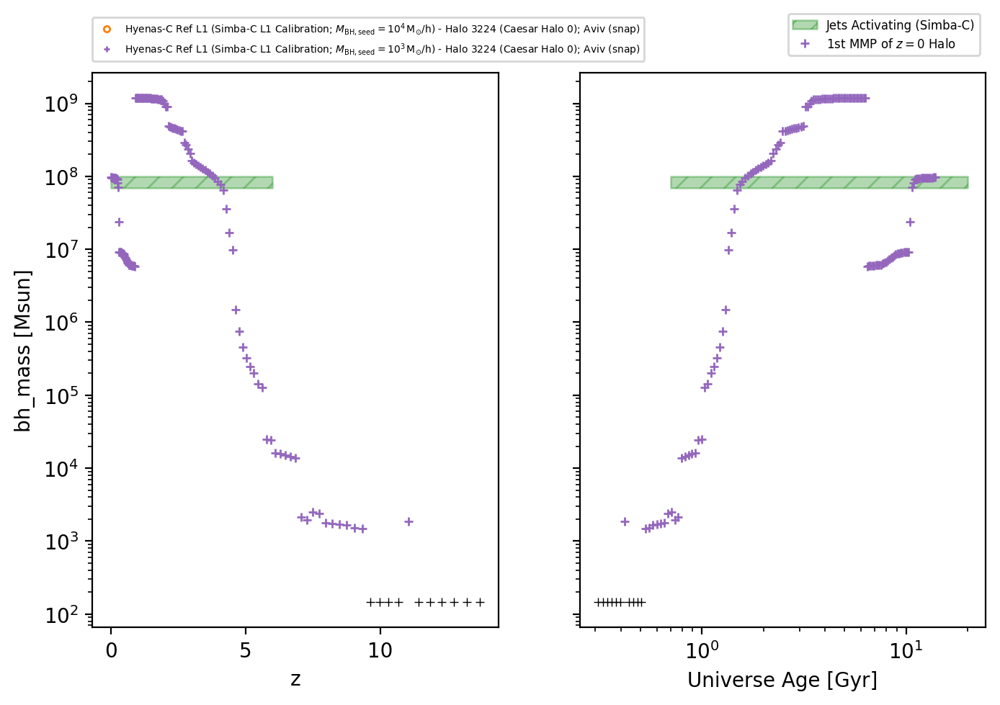

In [34]:
sim_markers = ['o', '+', '^', 'x']
# sim_markers = ['o', 'o', '+', '^', 'x']
# sim_markers = ['o', '+', '+', '^', 'x']
# sim_markers = ['+', '^', 'x']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
obj_types = ['first_mmp_halo']#, 'second_mmp_halo']
# obj_types = ['first_mmp_halo', 'first_mmp_central_halo']
# obj_types = ['first_mmp_central']#, 'second_mmp_central']
# obj_types = ['first_mmp_central', 'first_mmp_halo_central']
# obj_types = ['first_mmp_halo_central']
# obj_types = ['first_mmp_halo_central']
# obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    # r'1st MMP of $z=0$ Halo', r'2nd MMP of $z=0$ Halo',
    r'1st MMP of $z=0$ Halo', #r'Halo of 1st MMP of $z=0$ Central Galaxy',
    # r'1st MMP of $z=0$ Central Galaxy', r'2nd MMP of $z=0$ Central Galaxy',
    # r'1st MMP of $z=0$ Central Galaxy', r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
colors = ['C1', 'C4', 'C6']
# colors = ['C0', 'C0', 'C1', 'C4', 'C6']
# colors = ['C0', 'C1', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
# sizes = [3, 2, 3, 2]
# sizes = [2, 4]
sizes = [5, 4, 2]
# sizes = [4, 4, 4]
# obj_markers = []
# alphas = [0.5, 1, 0.5, 1, 0.5]
alphas = [1, 0.5, 1, 0.5]

prop = 'bh_mass'

fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=2, sharey='row')
fig.set_dpi(200)



if prop == 'bh_mass':
    # ax[0].fill_betweenx(y=[4e7,6e7], x1=0.5, x2=20, color='C0', alpha=0.3, hatch='//',
    #                  label='Jets Activating (Simba)')
    ax[0].fill_betweenx(y=[7e7,1e8], x1=0, x2=6, color='green', alpha=0.3, hatch='//',)
                     # label='Jets Activating (Simba-C)')
    ax[1].fill_betweenx(y=[7e7,1e8], x1=0.7, x2=20, color='green', alpha=0.3, hatch='//',
                     label='Jets Activating (Simba-C)')
    # ax.legend(fontsize=6)

if prop == 'bh_fedd':
    ax[0].fill_betweenx(y=[2e-2,2e-1], x1=0, x2=6, color='green', alpha=0.3, hatch='//',)
             # label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')
    ax[1].fill_betweenx(y=[2e-2,2e-1], x1=0.7, x2=20, color='green', alpha=0.3, hatch='//',
             label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')
    # ax.legend(fontsize=6)


handle_list = []
# label = None
# sim_counter = 0
plotted_sim_counter = 0
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()
    
    # marker = sim_info['marker']
    curr_handle= Line2D([], [], color=colors[sim_counter], ls='',
                        marker=sim_markers[sim_counter], ms=3,
                        mfc='none', label=sim)
    # curr_handle= Line2D([], [], color='grey', ls='',
    #                     marker=sim_markers[sim_counter], ms=3,
    #                     mfc='none', label=sim)
    handle_list.append(curr_handle)

    plotted = False
    for obj_counter, obj_type in enumerate(obj_types):
        print(obj_type)
        x1 = sim_info['halo_props'][obj_type]['z']
        x2 = sim_info['halo_props'][obj_type]['age']

        try:
            y = sim_info['halo_props'][obj_type][prop]
        except:
            print(f'{prop} does not exist')
            continue
        plotted = True

        if plotted_sim_counter == 0:
            # if label == None:
            label = obj_names[obj_counter]
        else:
            label = None

        color = colors[sim_counter]
        # color = colors[obj_counter]
        alpha = alphas[obj_counter]
        size = sizes[sim_counter]

        ax[0].plot(x1[:], y[:], 
                   marker=sim_markers[sim_counter],
                   mfc='none', mec=color,
                   # mfc=color, mec=color,
                   ms=size, alpha=alpha,
                   ls='', label=label)
        ax[1].plot(x2[:], y[:], 
                   marker=sim_markers[sim_counter],
                   mfc='none', mec=color,
                   # mfc=color, mec=color,
                   ms=size, alpha=alpha,
                   ls='', label=label)
        # label = 0
        # ax[1].plot(x2, y, marker=sim_markers[sim_counter], ms=obj_sizes[obj_counter],
        #            mfc='none', mec=mec, ls='', label=label)

        ## Plot all 0 values as 1 dex below minimum nonzero value
        # if prop_name in log_base_props:
        if prop in log_props:
            zero_value_indexes = np.where(np.array(y[:])==0)[0]
            nonzero_value_indexes = np.where(np.array(y[:])!=0)[0]
            print(zero_value_indexes)
            try:
                print(min(np.log10(np.array(y[:])[nonzero_value_indexes])))
                zero_value_for_plotting = np.array([10**(min(np.log10(np.array(y[:])[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
            except:
                zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
            print(zero_value_for_plotting)

            ax[0].plot(np.array(x1[:])[zero_value_indexes], zero_value_for_plotting, 
                       marker=sim_markers[sim_counter],
                       mfc=color, ms=size, alpha=alpha,
                       mec='black', mew=0.5, ls='')
            ax[1].plot(np.array(x2[:])[zero_value_indexes], zero_value_for_plotting, 
                       marker=sim_markers[sim_counter],
                       mfc=color, ms=size, alpha=alpha,
                       mec='black', mew=0.5, ls='')
            # ax[0].plot(np.array(x1)[zero_value_indexes], zero_value_for_plotting, 
            #            marker=marker, ms=ms, mec=mec, mfc=mec, ls='')
            # ax[1].plot(np.array(x2)[zero_value_indexes], zero_value_for_plotting, 
            #            marker=marker, ms=ms, mec=mec, mfc=mec, ls='')

    print()
    if plotted: plotted_sim_counter += 1

ax[1].set_xscale('log')

ax[0].set_xlabel('z')
ax[1].set_xlabel('Universe Age [Gyr]')

try:
    ax[0].set_ylabel(f'{prop} [{y.attrs['units']}]')
except:
    ax[0].set_ylabel(f'{prop}')

# if prop_name in log_base_props:
if prop in log_props:
    try:
        ax[0].set_yscale('log')
        ax[1].set_yscale('log') 
    except Exception as error:
        print(f'Cannot log-scale: {error}')

# ax[1].legend(loc='upper right', fontsize=8)
ax[0].legend(handles=handle_list, fontsize=5, loc=(0, 1.02))
# ax[0].legend(handles=marker_list, labels=sim_dict.keys(), fontsize=6)
ax[1].legend(fontsize=6, loc='lower right', bbox_to_anchor=(1,1.02))
plt.show()
print()

Hyenas-C Ref L1 (Simba-C L1 Calibration; $M_{\mathrm{BH,seed}}=10^4\,\mathrm{M_{\odot}/h}$) - Halo 3224 (Caesar Halo 0); Aviv (snap)

first_mmp_halo
bh_mass does not exist

Hyenas-C Ref L1 (Simba-C L1 Calibration; $M_{\mathrm{BH,seed}}=10^3\,\mathrm{M_{\odot}/h}$) - Halo 3224 (Caesar Halo 0); Aviv (snap)

first_mmp_halo
[ 0  1  2  3  4  5  7  8  9 10]
3.169460135330767
[147.7270874 147.7270874 147.7270874 147.7270874 147.7270874 147.7270874
 147.7270874 147.7270874 147.7270874 147.7270874]



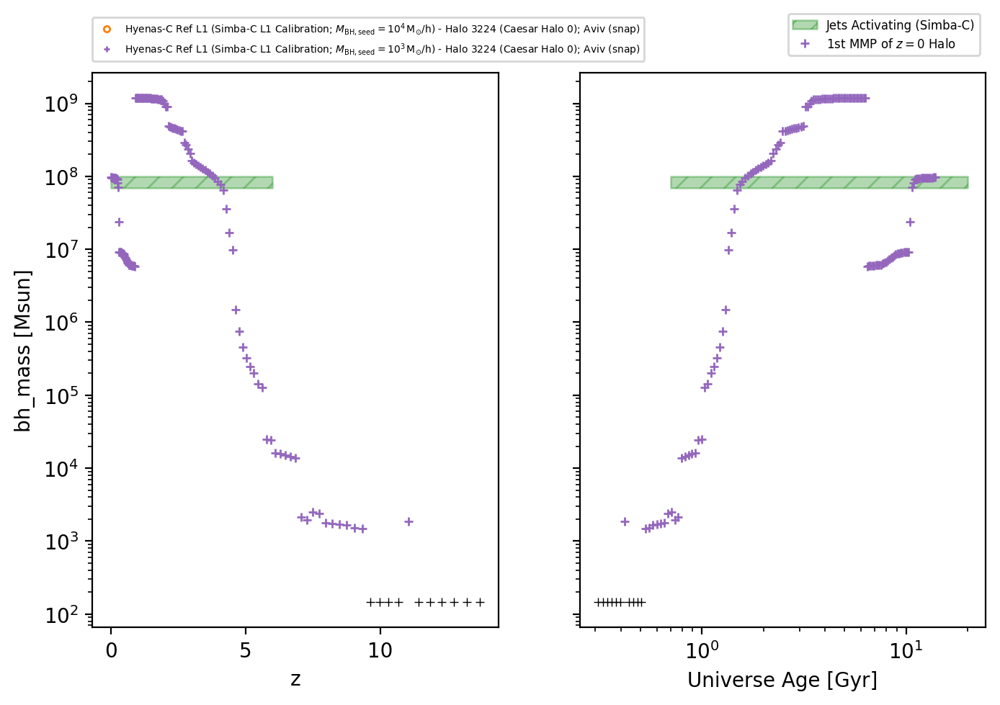

In [ ]:
sim_markers = ['o', '+', '^', 'x']
# sim_markers = ['o', 'o', '+', '^', 'x']
# sim_markers = ['o', '+', '+', '^', 'x']
# sim_markers = ['+', '^', 'x']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['first_mmp_halo']#, 'second_mmp_halo']
# obj_types = ['first_mmp_halo', 'first_mmp_central_halo']
# obj_types = ['first_mmp_central']#, 'second_mmp_central']
# obj_types = ['first_mmp_central', 'first_mmp_halo_central']
# obj_types = ['first_mmp_halo_central']
# obj_types = ['first_mmp_halo_central']
# obj_types = ['central', 'halo_central']
obj_types = ['halo']

obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    # r'1st MMP of $z=0$ Halo', r'2nd MMP of $z=0$ Halo',
    r'1st MMP of $z=0$ Halo', #r'Halo of 1st MMP of $z=0$ Central Galaxy',
    # r'1st MMP of $z=0$ Central Galaxy', r'2nd MMP of $z=0$ Central Galaxy',
    # r'1st MMP of $z=0$ Central Galaxy', r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]

# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# colors = ['C1', 'C4', 'C6']
# colors = ['C0', 'C0', 'C1', 'C4', 'C6']
# colors = ['C0', 'C1', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
# sizes = [3, 2, 3, 2]
# sizes = [2, 4]
sizes = [5, 4, 2]
# sizes = [4, 4, 4]
# obj_markers = []
# alphas = [0.5, 1, 0.5, 1, 0.5]
alphas = [1, 0.5, 1, 0.5]

props = ['Tvir_dave+2019', 'Tvir_van_ve_Voort_2019', 'Tvir_van_ve_Voort_2019_v2']

fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=2, sharey='row')
fig.set_dpi(200)


sim_handle_list = []
obj_handle_list = []
prop_handle_list = []
for prop in props:

    # if prop == 'bh_mass':
    #     # ax[0].fill_betweenx(y=[4e7,6e7], x1=0.5, x2=20, color='C0', alpha=0.3, hatch='//',
    #     #                  label='Jets Activating (Simba)')
    #     ax[0].fill_betweenx(y=[7e7,1e8], x1=0, x2=6, color='green', alpha=0.3, hatch='//',)
    #                     # label='Jets Activating (Simba-C)')
    #     ax[1].fill_betweenx(y=[7e7,1e8], x1=0.7, x2=20, color='green', alpha=0.3, hatch='//',
    #                     label='Jets Activating (Simba-C)')
    #     # ax.legend(fontsize=6)

    # if prop == 'bh_fedd':
    #     ax[0].fill_betweenx(y=[2e-2,2e-1], x1=0, x2=6, color='green', alpha=0.3, hatch='//',)
    #             # label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')
    #     ax[1].fill_betweenx(y=[2e-2,2e-1], x1=0.7, x2=20, color='green', alpha=0.3, hatch='//',
    #             label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')
    #     # ax.legend(fontsize=6)


    # handle_list = []
    # label = None
    # sim_counter = 0
    plotted_sim_counter = 0
    for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
        print(sim)
        print()
        
        # marker = sim_info['marker']
        curr_handle = Line2D([], [], color=colors[sim_counter], ls='',
                            marker=sim_markers[sim_counter], ms=3,
                            mfc='none', label=sim)
        # curr_handle= Line2D([], [], color='grey', ls='',
        #                     marker=sim_markers[sim_counter], ms=3,
        #                     mfc='none', label=sim)
        handle_list.append(curr_handle)

        plotted = False
        for obj_counter, obj_type in enumerate(obj_types):
            print(obj_type)
            x1 = sim_info['halo_props'][obj_type]['z']
            x2 = sim_info['halo_props'][obj_type]['age']

            try:
                y = sim_info['halo_props'][obj_type][prop]
            except:
                print(f'{prop} does not exist')
                continue
            plotted = True

            if plotted_sim_counter == 0:
                # if label == None:
                label = obj_names[obj_counter]
            else:
                label = None

            color = colors[sim_counter]
            # color = colors[obj_counter]
            alpha = alphas[obj_counter]
            size = sizes[sim_counter]

            ax[0].plot(x1[:], y[:], 
                    marker=sim_markers[sim_counter],
                    mfc='none', mec=color,
                    # mfc=color, mec=color,
                    ms=size, alpha=alpha,
                    ls='', label=label)
            ax[1].plot(x2[:], y[:], 
                    marker=sim_markers[sim_counter],
                    mfc='none', mec=color,
                    # mfc=color, mec=color,
                    ms=size, alpha=alpha,
                    ls='', label=label)
            # label = 0
            # ax[1].plot(x2, y, marker=sim_markers[sim_counter], ms=obj_sizes[obj_counter],
            #            mfc='none', mec=mec, ls='', label=label)

            ## Plot all 0 values as 1 dex below minimum nonzero value
            # if prop_name in log_base_props:
            if prop in log_props:
                zero_value_indexes = np.where(np.array(y[:])==0)[0]
                nonzero_value_indexes = np.where(np.array(y[:])!=0)[0]
                print(zero_value_indexes)
                try:
                    print(min(np.log10(np.array(y[:])[nonzero_value_indexes])))
                    zero_value_for_plotting = np.array([10**(min(np.log10(np.array(y[:])[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
                except:
                    zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
                print(zero_value_for_plotting)

                ax[0].plot(np.array(x1[:])[zero_value_indexes], zero_value_for_plotting, 
                        marker=sim_markers[sim_counter],
                        mfc=color, ms=size, alpha=alpha,
                        mec='black', mew=0.5, ls='')
                ax[1].plot(np.array(x2[:])[zero_value_indexes], zero_value_for_plotting, 
                        marker=sim_markers[sim_counter],
                        mfc=color, ms=size, alpha=alpha,
                        mec='black', mew=0.5, ls='')
                # ax[0].plot(np.array(x1)[zero_value_indexes], zero_value_for_plotting, 
                #            marker=marker, ms=ms, mec=mec, mfc=mec, ls='')
                # ax[1].plot(np.array(x2)[zero_value_indexes], zero_value_for_plotting, 
                #            marker=marker, ms=ms, mec=mec, mfc=mec, ls='')

        print()
        if plotted: plotted_sim_counter += 1

ax[1].set_xscale('log')

ax[0].set_xlabel('z')
ax[1].set_xlabel('Universe Age [Gyr]')

try:
    ax[0].set_ylabel(f'{prop} [{y.attrs['units']}]')
except:
    ax[0].set_ylabel(f'{prop}')

# if prop_name in log_base_props:
if prop in log_props:
    try:
        ax[0].set_yscale('log')
        ax[1].set_yscale('log') 
    except Exception as error:
        print(f'Cannot log-scale: {error}')

# ax[1].legend(loc='upper right', fontsize=8)
ax[0].legend(handles=handle_list, fontsize=5, loc=(0, 1.02))
# ax[0].legend(handles=marker_list, labels=sim_dict.keys(), fontsize=6)
ax[1].legend(fontsize=6, loc='lower right', bbox_to_anchor=(1,1.02))
plt.show()
print()

## Make nice individual plots

/tmp/ipykernel_1723701/4220797411.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = matplotlib.cm.get_cmap('tab10')


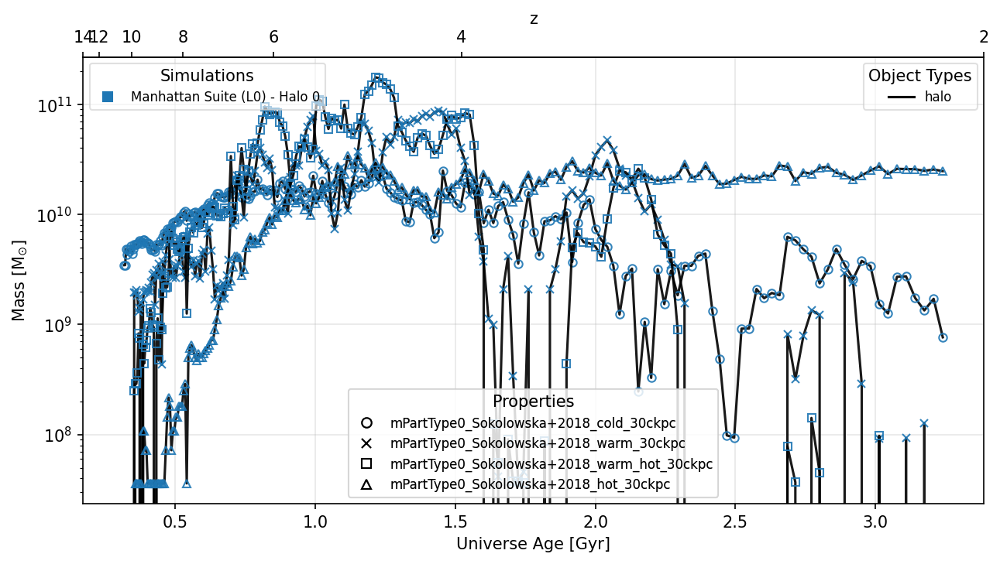

In [45]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'mPartType0_Sokolowska+2018_cold_30ckpc',
    'mPartType0_Sokolowska+2018_warm_30ckpc',
    'mPartType0_Sokolowska+2018_warm_hot_30ckpc',
    'mPartType0_Sokolowska+2018_hot_30ckpc',
                ]   # properties to loop over (marker distinguishes these)
obj_types = ['halo']#, 'central']                   # object types to loop over (linestyle distinguishes these)
y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
sim_names = list(sim_dict.keys())
cmap = matplotlib.cm.get_cmap('tab10')
sim_colors = {sim: cmap(i % cmap.N) for i, sim in enumerate(sim_names)}
obj_linestyles = {obj: ls for obj, ls in zip(obj_types, ['-', '--', ':', '-.'])}
prop_markers = {prop: mk for prop, mk in zip(props_to_plot, ['o', 'x', 's', '^', 'P', 'D', '*'])}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim in sim_names:
    sim_info = sim_dict[sim]
    color = sim_colors[sim]

    for obj in obj_types:
        linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop in props_to_plot:
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            marker = prop_markers.get(prop, 'o')
            ax.plot(age_arr, y,
                    color='black', ls=linestyle, marker=marker,
                    mfc='none', mec=color, ms=5, alpha=0.9)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.6)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='upper right', fontsize=8, framealpha=0.6)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower center', fontsize=8, framealpha=0.6)
ax.add_artist(leg_prop)

plt.show()

1


ValueError: x and y must have same first dimension, but have shapes (90,) and (73,)

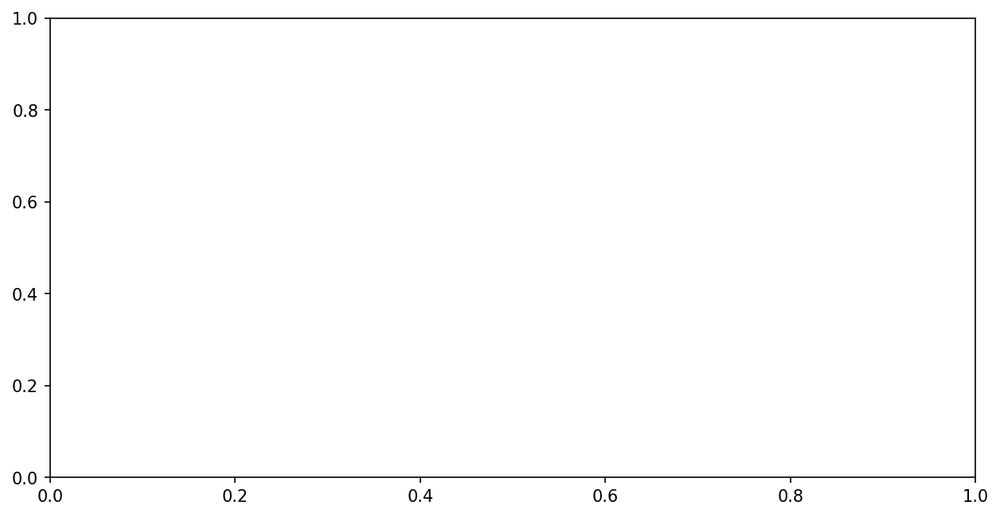

In [32]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'nPartType5_r200c',
    'nPartType5_no_accretion_r200c',
    'nPartType5_quasar_r200c',
    'nPartType5_quasar_ascale_r200c',
    'nPartType5_quasar_high_fedd_r200c',
    'nPartType5_quasar_low_fedd_r200c',
    'nPartType5_jets_r200c',
    'nPartType5_jets_ascale_r200c',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
# y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
# ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='upper center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='center right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

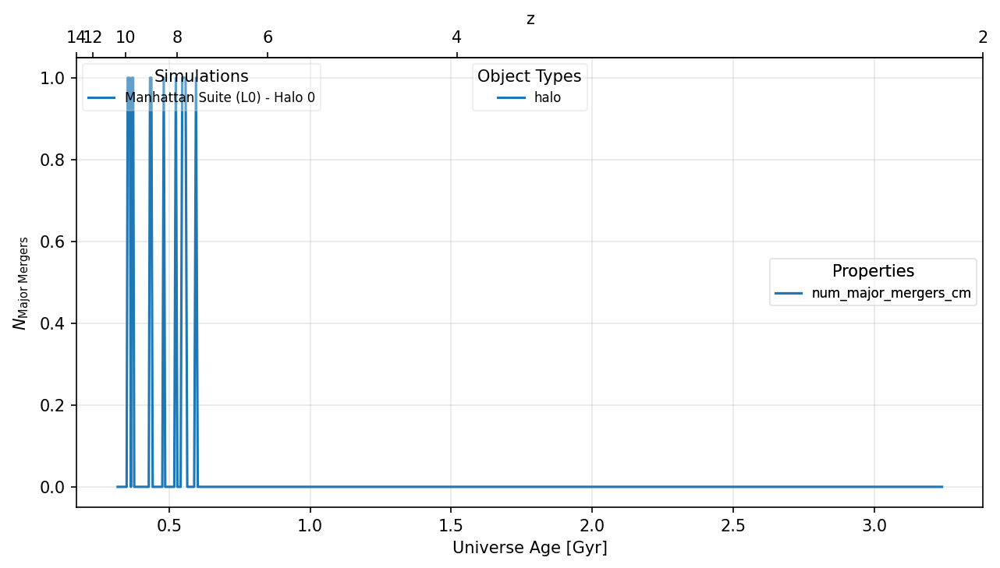

In [61]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'num_major_mergers_cm',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
# y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1))],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
# ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='upper center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='center right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

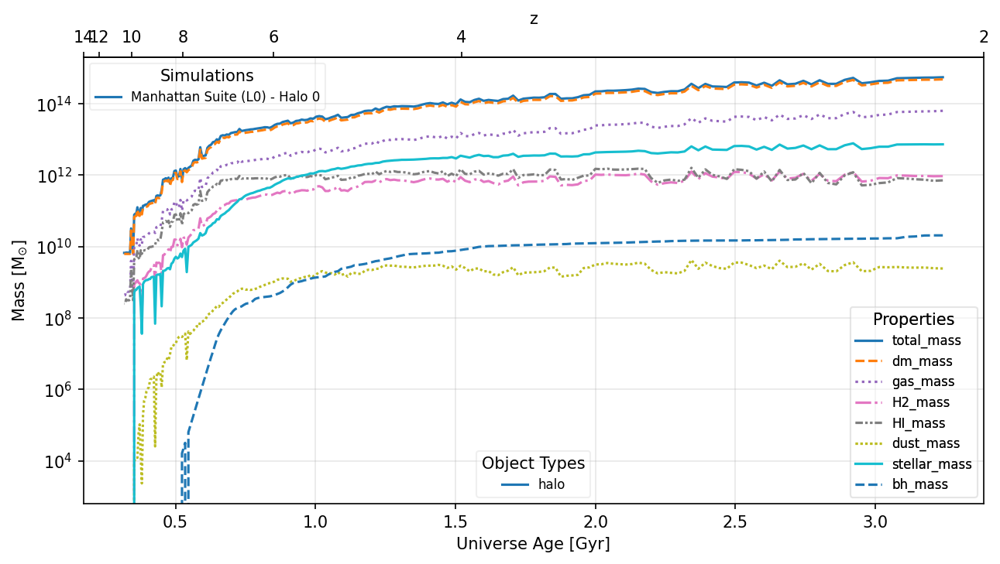

In [8]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'total_mass',
    'dm_mass',
    'gas_mass',
    'H2_mass',
    'HI_mass',
    'dust_mass',
    'stellar_mass',
    'bh_mass',
    # 'H2_ism_mass',
    # 'HI_ism_mass',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

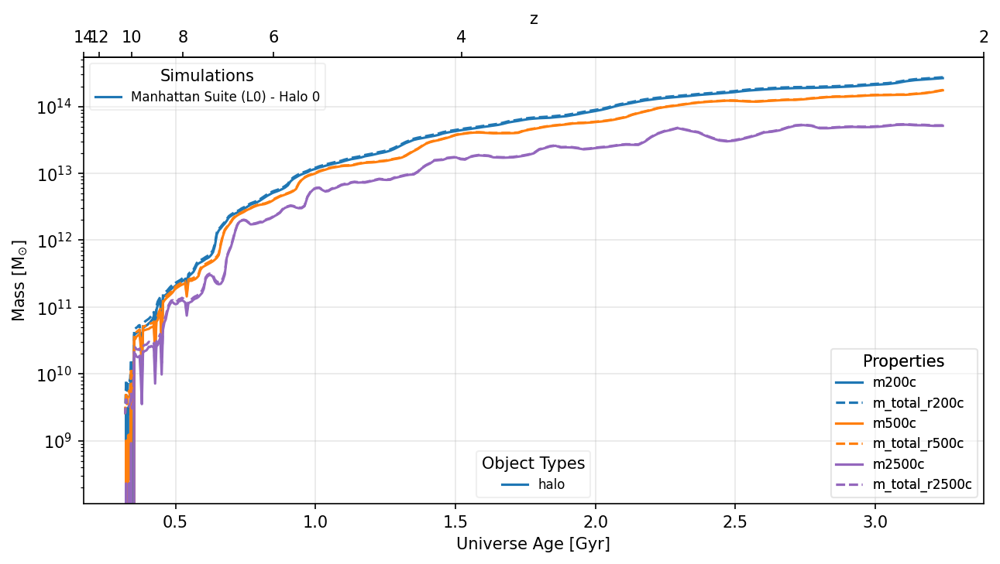

In [25]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'm200c',
    'm_total_r200c',
    'm500c',
    'm_total_r500c',
    'm2500c',
    'm_total_r2500c'
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C0', 'C1', 'C1', 'C4', 'C4', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    'ls':['-', '--', '-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Msun
Msun
Msun


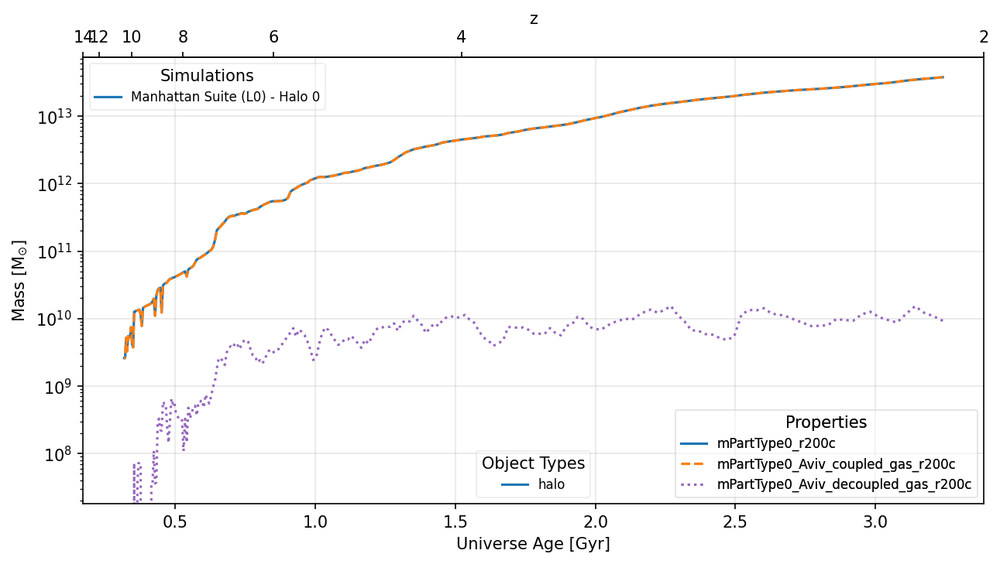

In [27]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'mPartType0_r200c',
    'mPartType0_Aviv_coupled_gas_r200c',
    'mPartType0_Aviv_decoupled_gas_r200c',
    # 'mPartType0_r500c',
    # 'mPartType0_Aviv_coupled_gas_r500c',
    # 'mPartType0_Aviv_decoupled_gas_r500c',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*100,
    'mfc':['none']*100,
    'mec':['none']*100,
    'ms':[5]*100,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*100,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Missing f_PartType0_Aviv_coupled_gas_r200c-gas
Missing f_PartType0_Aviv_decoupled_gas_r200c-gas
Missing f_PartType0_Aviv_coupled_gas_r500c-gas
Missing f_PartType0_Aviv_decoupled_gas_r500c-gas
Missing f_PartType0_Aviv_coupled_gas_r2500c-gas
Missing f_PartType0_Aviv_decoupled_gas_r2500c-gas
1
1
1
1
1
1


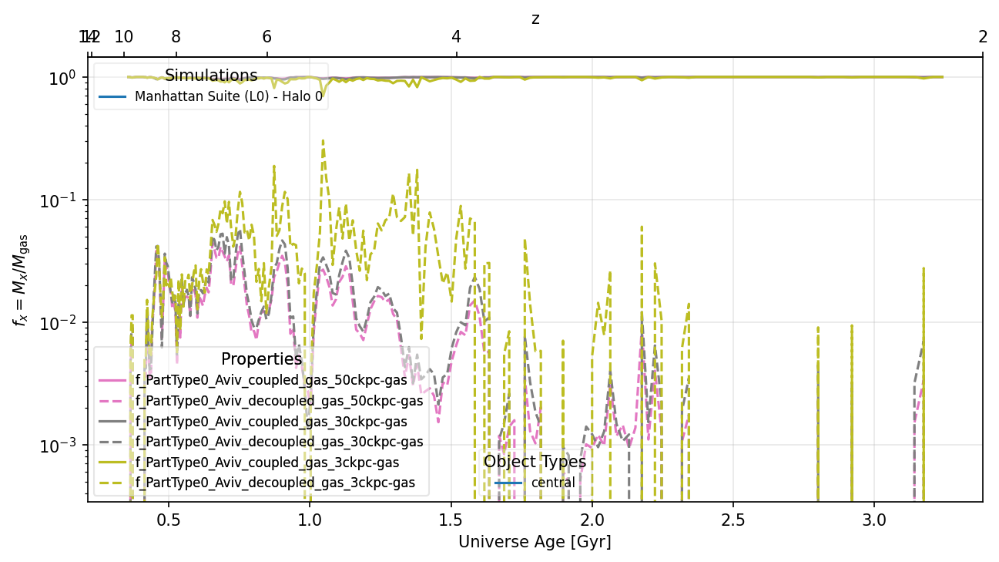

In [36]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'f_PartType0_Aviv_coupled_gas_r200c-gas',
    'f_PartType0_Aviv_decoupled_gas_r200c-gas',
    'f_PartType0_Aviv_coupled_gas_r500c-gas',
    'f_PartType0_Aviv_decoupled_gas_r500c-gas',
    'f_PartType0_Aviv_coupled_gas_r2500c-gas',
    'f_PartType0_Aviv_decoupled_gas_r2500c-gas',
    'f_PartType0_Aviv_coupled_gas_50ckpc-gas',
    'f_PartType0_Aviv_decoupled_gas_50ckpc-gas',
    'f_PartType0_Aviv_coupled_gas_30ckpc-gas',
    'f_PartType0_Aviv_decoupled_gas_30ckpc-gas',
    'f_PartType0_Aviv_coupled_gas_3ckpc-gas',
    'f_PartType0_Aviv_decoupled_gas_3ckpc-gas',
    # 'mPartType0_r500c',
    # 'mPartType0_Aviv_coupled_gas_r500c',
    # 'mPartType0_Aviv_decoupled_gas_r500c',
                ]   # properties to loop over
obj_types = ['central']#, 'central']                   # object types to loop over
y_label = r'$f_x = M_x/M_{\mathrm{gas}}$'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*100,
    'mfc':['none']*100,
    'mec':['none']*100,
    'ms':[5]*100,
    # 'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    'color':['C0', 'C0', 'C1', 'C1', 'C4', 'C4', 'C6', 'C6', 'C7', 'C7', 'C8', 'C8'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    'ls':['-', '--', '-', '--', '-', '--', '-', '--', '-', '--', '-', '--',],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*100,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Msun
Msun
Msun


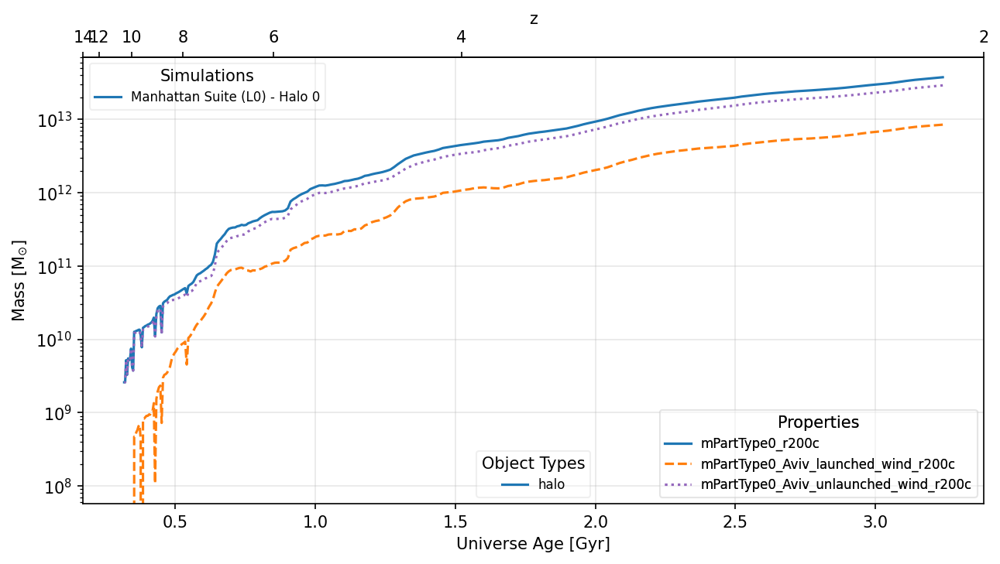

In [37]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'mPartType0_r200c',
    'mPartType0_Aviv_launched_wind_r200c',
    'mPartType0_Aviv_unlaunched_wind_r200c',
    # 'mPartType0_r500c',
    # 'mPartType0_Aviv_coupled_gas_r500c',
    # 'mPartType0_Aviv_decoupled_gas_r500c',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*100,
    'mfc':['none']*100,
    'mec':['none']*100,
    'ms':[5]*100,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*100,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Missing f_PartType0_Aviv_unlaunched_wind_r200c-gas
Missing f_PartType0_Aviv_launched_wind_r200c-gas
Missing f_PartType0_Aviv_unlaunched_wind_r500c-gas
Missing f_PartType0_Aviv_launched_wind_r500c-gas
Missing f_PartType0_Aviv_unlaunched_wind_r2500c-gas
Missing f_PartType0_Aviv_launched_wind_r2500c-gas
1
1
1
1
1
1


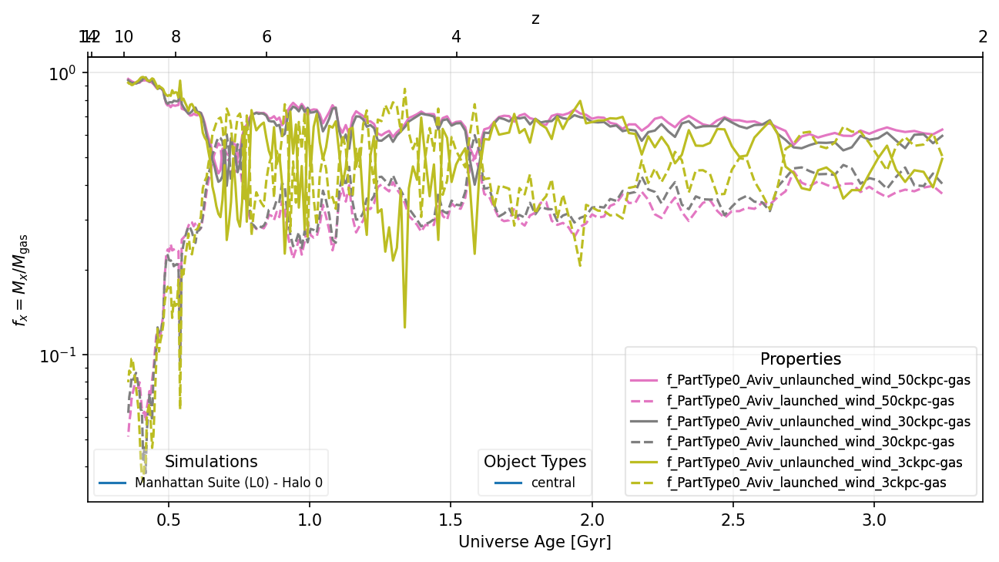

In [43]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'f_PartType0_Aviv_unlaunched_wind_r200c-gas',
    'f_PartType0_Aviv_launched_wind_r200c-gas',
    'f_PartType0_Aviv_unlaunched_wind_r500c-gas',
    'f_PartType0_Aviv_launched_wind_r500c-gas',
    'f_PartType0_Aviv_unlaunched_wind_r2500c-gas',
    'f_PartType0_Aviv_launched_wind_r2500c-gas',
    'f_PartType0_Aviv_unlaunched_wind_50ckpc-gas',
    'f_PartType0_Aviv_launched_wind_50ckpc-gas',
    'f_PartType0_Aviv_unlaunched_wind_30ckpc-gas',
    'f_PartType0_Aviv_launched_wind_30ckpc-gas',
    'f_PartType0_Aviv_unlaunched_wind_3ckpc-gas',
    'f_PartType0_Aviv_launched_wind_3ckpc-gas',
    # 'mPartType0_r500c',
    # 'mPartType0_Aviv_coupled_gas_r500c',
    # 'mPartType0_Aviv_decoupled_gas_r500c',
                ]   # properties to loop over
obj_types = ['central']#, 'central']                   # object types to loop over
y_label = r'$f_x = M_x/M_{\mathrm{gas}}$'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*100,
    'mfc':['none']*100,
    'mec':['none']*100,
    'ms':[5]*100,
    # 'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    'color':['C0', 'C0', 'C1', 'C1', 'C4', 'C4', 'C6', 'C6', 'C7', 'C7', 'C8', 'C8'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    'ls':['-', '--', '-', '--', '-', '--', '-', '--', '-', '--', '-', '--',],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*100,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Msun
Msun
Msun
Msun
Msun
Msun
Msun


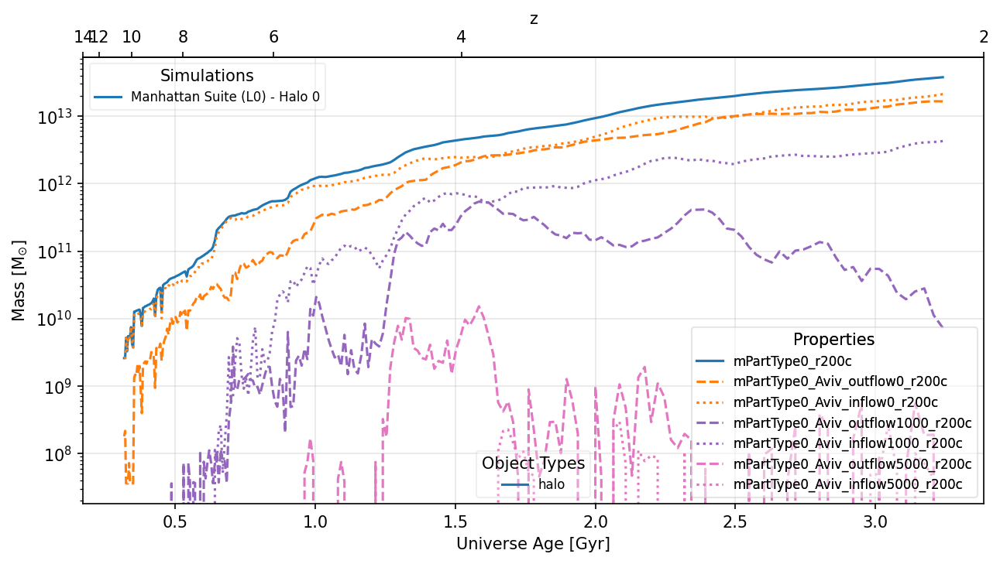

In [44]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'mPartType0_r200c',
    'mPartType0_Aviv_outflow0_r200c',
    'mPartType0_Aviv_inflow0_r200c',
    'mPartType0_Aviv_outflow1000_r200c',
    'mPartType0_Aviv_inflow1000_r200c',
    'mPartType0_Aviv_outflow5000_r200c',
    'mPartType0_Aviv_inflow5000_r200c',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*100,
    'mfc':['none']*100,
    'mec':['none']*100,
    'ms':[5]*100,
    # 'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    'color':['C0', 'C1', 'C1', 'C4', 'C4', 'C6', 'C6'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    'ls':['-', '--', ':', '--', ':', '--', ':'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*100,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

1
1
1
1
1
1


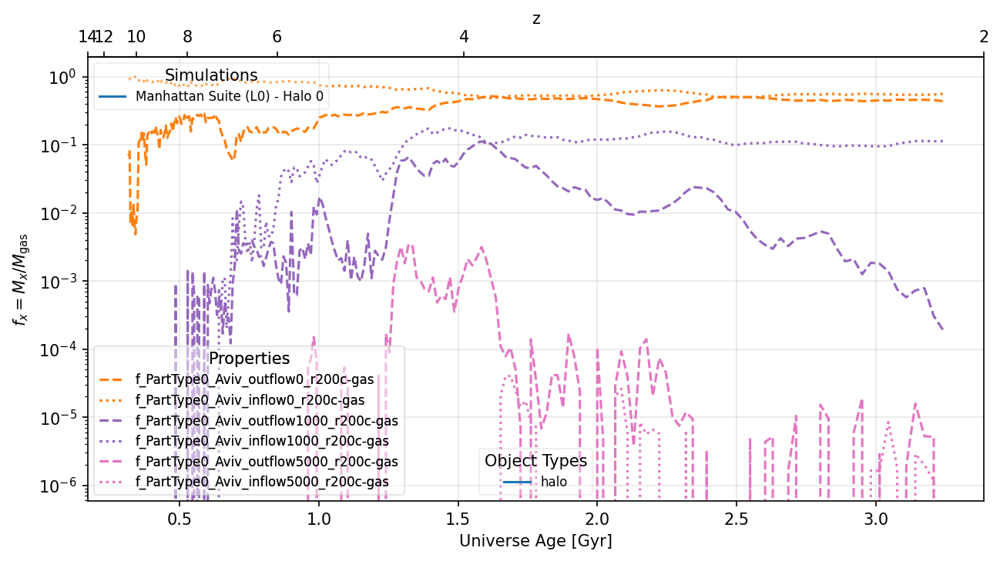

In [46]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'f_PartType0_Aviv_outflow0_r200c-gas',
    'f_PartType0_Aviv_inflow0_r200c-gas',
    'f_PartType0_Aviv_outflow1000_r200c-gas',
    'f_PartType0_Aviv_inflow1000_r200c-gas',
    'f_PartType0_Aviv_outflow5000_r200c-gas',
    'f_PartType0_Aviv_inflow5000_r200c-gas',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'$f_x = M_x/M_{\mathrm{gas}}$'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*100,
    'mfc':['none']*100,
    'mec':['none']*100,
    'ms':[5]*100,
    # 'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    'color':['C1', 'C1', 'C4', 'C4', 'C6', 'C6'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    'ls':['--', ':', '--', ':', '--', ':'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*100,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

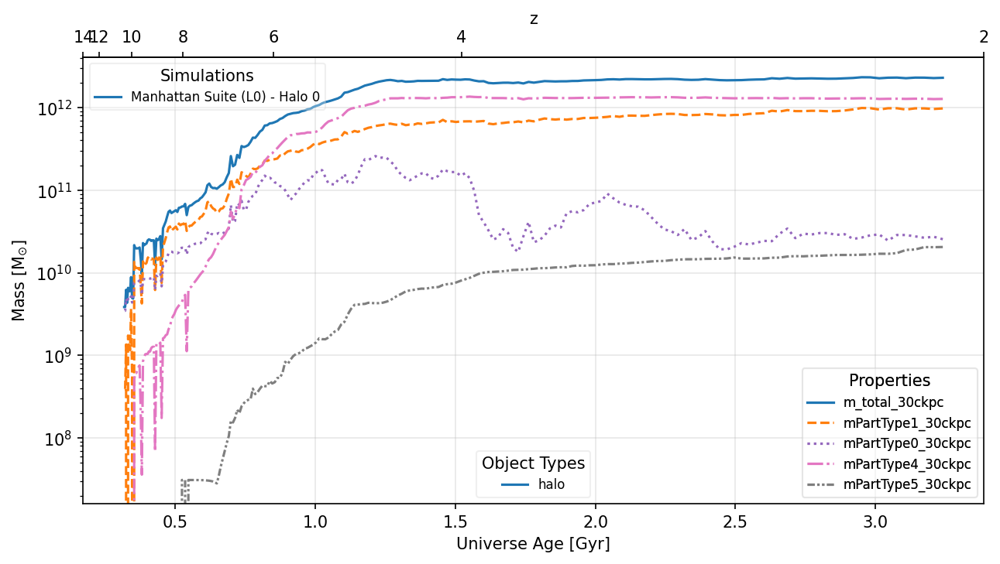

In [24]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'm_total_30ckpc',
    'mPartType1_30ckpc',
    'mPartType0_30ckpc',
    'mPartType4_30ckpc',
    'mPartType5_30ckpc',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'Mass [$\mathrm{M_{\odot}}$]'         # y-axis label (you can include units here)
# y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

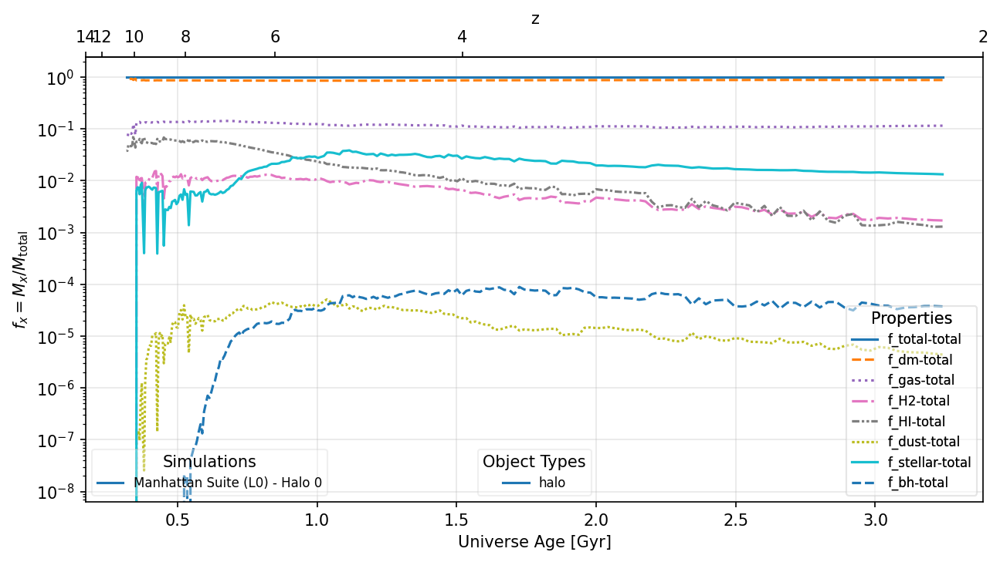

In [9]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'f_total-total',
    'f_dm-total',
    'f_gas-total',
    'f_H2-total',
    'f_HI-total',
    'f_dust-total',
    'f_stellar-total',
    'f_bh-total',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'$f_x = M_x/M_{\mathrm{total}}$'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

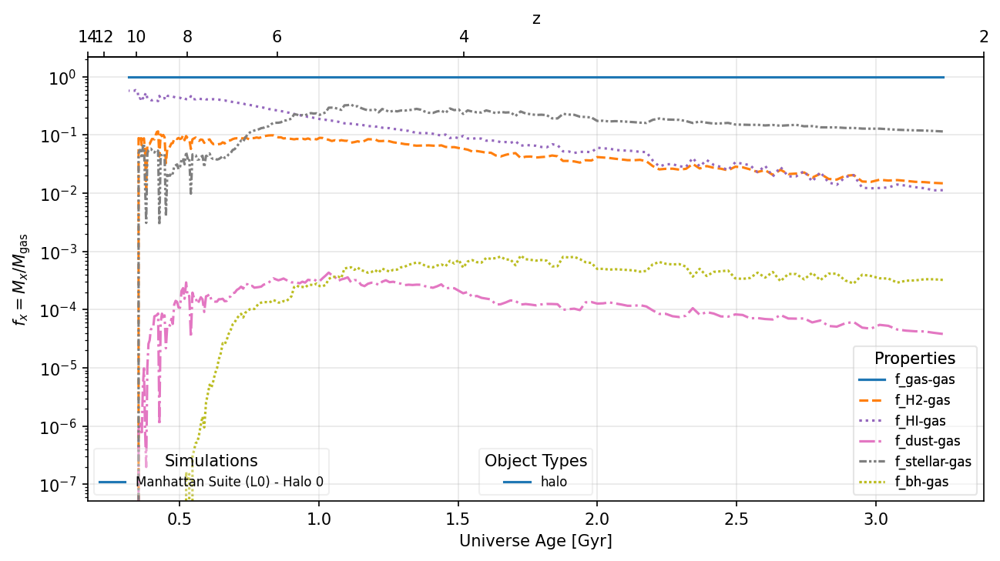

In [11]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    # 'f_dm-gas',
    'f_gas-gas',
    'f_H2-gas',
    'f_HI-gas',
    'f_dust-gas',
    'f_stellar-gas',
    'f_bh-gas',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'$f_x = M_x/M_{\mathrm{gas}}$'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

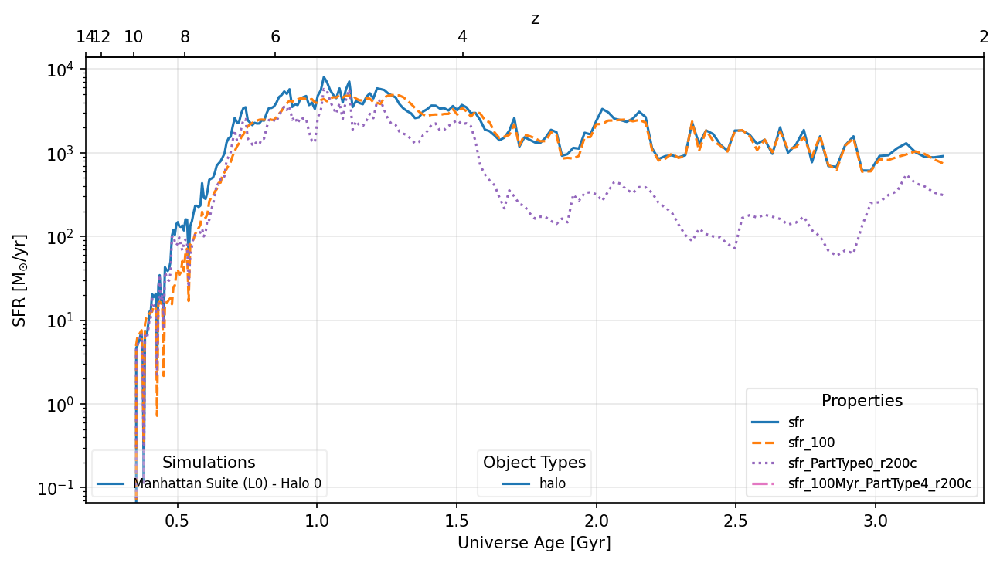

In [14]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'sfr',
    'sfr_100',
    'sfr_PartType0_r200c',
    # 'sfr_100Myr_PartType4_r200c',
    # 'sfr_snap',
    # 'stellar_mass_gradient',
    # 'mPartType4_r200c_gradient',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'SFR $[\mathrm{M_{\odot}/yr}]$'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

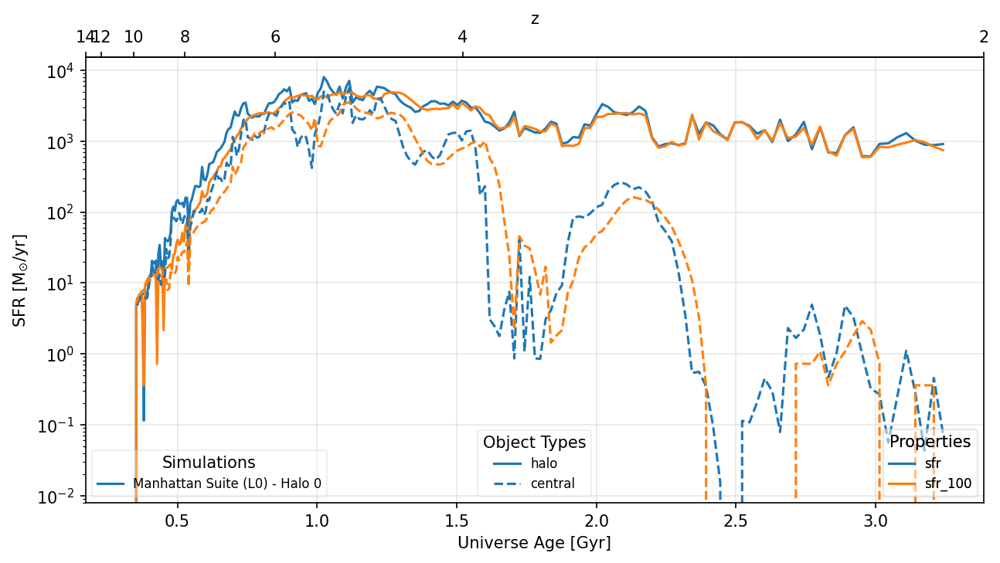

In [15]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'sfr',
    'sfr_100',
    # 'sfr_PartType0_r200c',
    # 'sfr_100Myr_PartType4_r200c',
    # 'sfr_snap',
    # 'stellar_mass_gradient',
    # 'mPartType4_r200c_gradient',
                ]   # properties to loop over
obj_types = ['halo', 'central']                   # object types to loop over
y_label = r'SFR $[\mathrm{M_{\odot}/yr}]$'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Missing PartType0_NWindLaunches_20ckpc


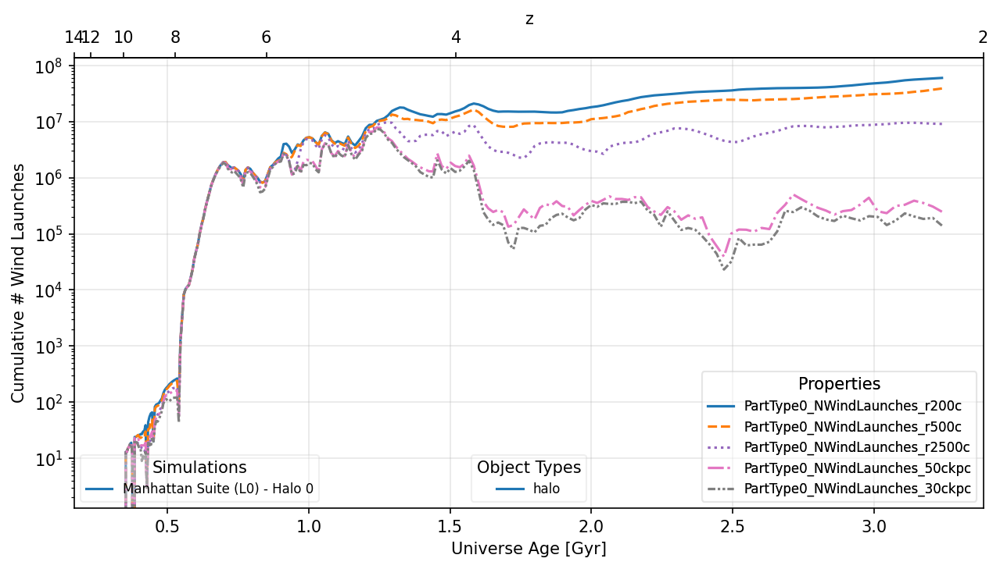

In [20]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'PartType0_NWindLaunches_r200c',
    'PartType0_NWindLaunches_r500c',
    'PartType0_NWindLaunches_r2500c',
    'PartType0_NWindLaunches_50ckpc',
    'PartType0_NWindLaunches_30ckpc',
    'PartType0_NWindLaunches_20ckpc',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'Cumulative # Wind Launches'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Missing PartType0_NWindLaunches_r200c
Missing PartType0_NWindLaunches_r500c
Missing PartType0_NWindLaunches_r2500c


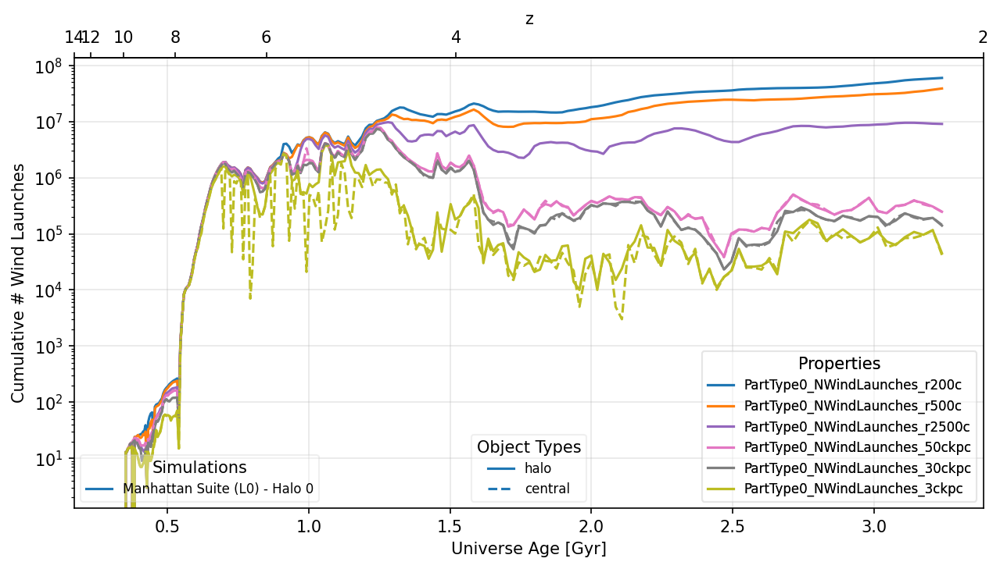

In [22]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'PartType0_NWindLaunches_r200c',
    'PartType0_NWindLaunches_r500c',
    'PartType0_NWindLaunches_r2500c',
    'PartType0_NWindLaunches_50ckpc',
    'PartType0_NWindLaunches_30ckpc',
    'PartType0_NWindLaunches_3ckpc',
                ]   # properties to loop over
obj_types = ['halo', 'central']                   # object types to loop over
y_label = r'Cumulative # Wind Launches'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

Missing PartType0_NNewWindLaunches_r200c
Missing PartType0_NNewWindLaunches_r500c
Missing PartType0_NNewWindLaunches_r2500c


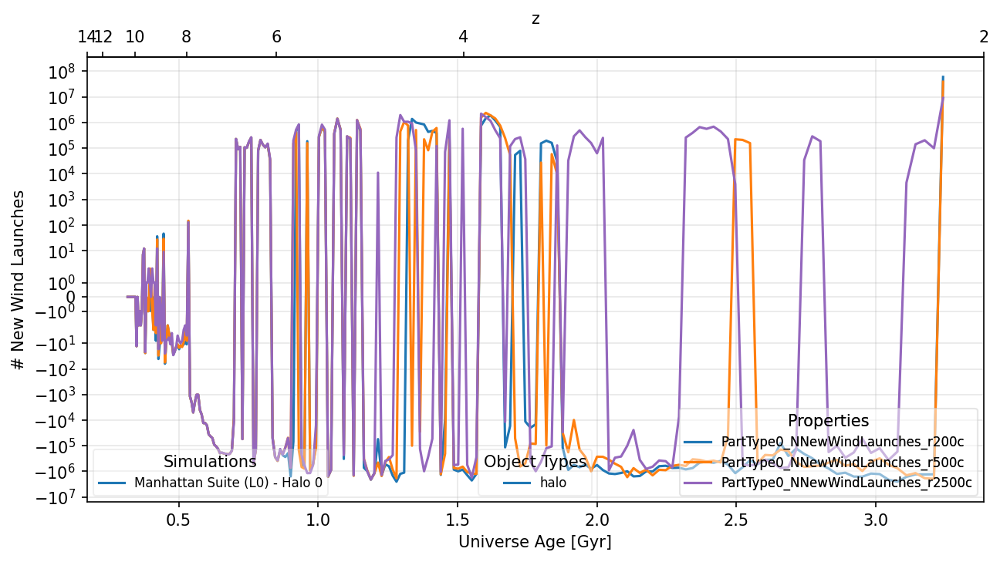

In [25]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'PartType0_NNewWindLaunches_r200c',
    'PartType0_NNewWindLaunches_r500c',
    'PartType0_NNewWindLaunches_r2500c',
    # 'PartType0_NNewWindLaunches_50ckpc',
    # 'PartType0_NNewWindLaunches_30ckpc',
    # 'PartType0_NNewWindLaunches_3ckpc',
                ]   # properties to loop over
obj_types = ['halo', 'central']                   # object types to loop over
y_label = r'# New Wind Launches'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('symlog')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

erg/s
erg/s
erg/s
erg/s
Missing bh_Lbol_r2500c
Missing bh_Lbol_r500c
Missing bh_Lbol_r200c


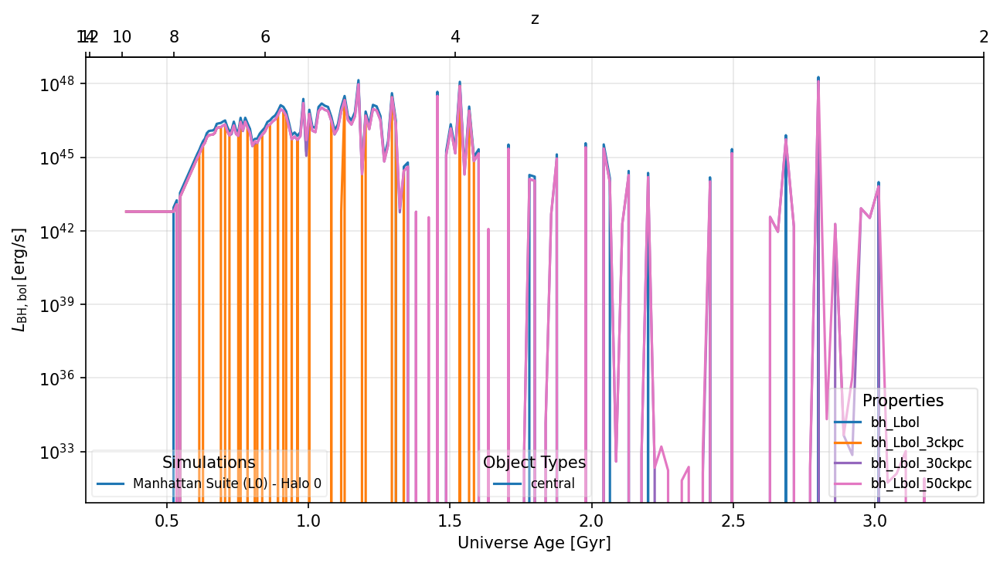

In [17]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'bh_Lbol',
    'bh_Lbol_3ckpc',
    'bh_Lbol_30ckpc',
    'bh_Lbol_50ckpc',
    'bh_Lbol_r2500c',
    'bh_Lbol_r500c',
    'bh_Lbol_r200c',
                ]   # properties to loop over
obj_types = ['central']#, 'central']                   # object types to loop over
y_label = r'$L_{\mathrm{BH,bol}}\,[\mathrm{erg/s}]$'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

erg/s
erg/s


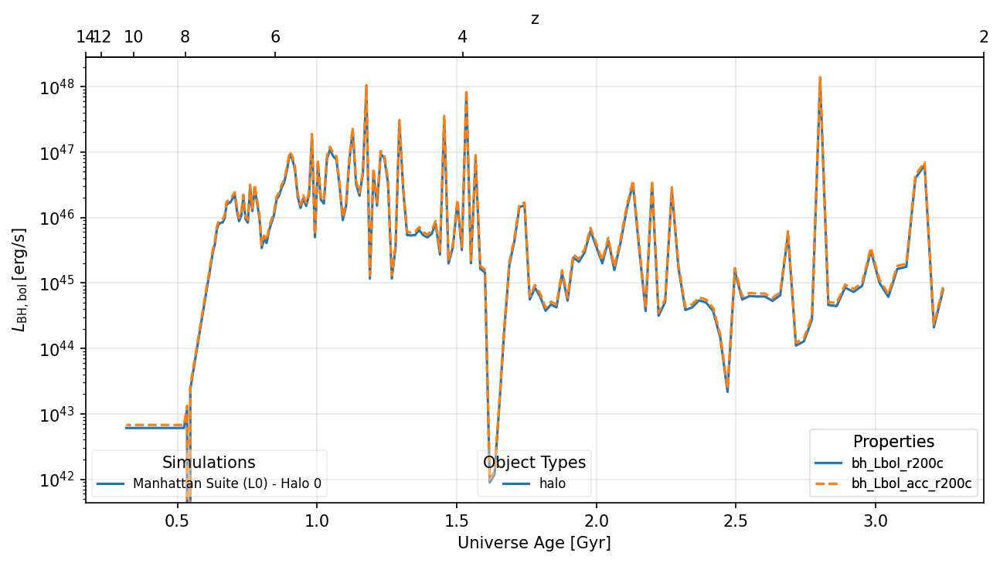

In [20]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    # 'bh_Lbol',
    # 'bh_Lbol_acc'
    # 'bh_Lbol_3ckpc',
    # 'bh_Lbol_30ckpc',
    # 'bh_Lbol_50ckpc',
    # 'bh_Lbol_r2500c',
    # 'bh_Lbol_r500c',
    'bh_Lbol_r200c',
    'bh_Lbol_acc_r200c',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
y_label = r'$L_{\mathrm{BH,bol}}\,[\mathrm{erg/s}]$'         # y-axis label (you can include units here)

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {
    # 'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
}
prop_plotting = {
    'marker':[None]*10,
    'mfc':['none']*10,
    'mec':['none']*10,
    'ms':[5]*10,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C0', 'C0', 'C1', 'C1'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['-', '--', '-', '--'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*10,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='lower left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

K
K
K


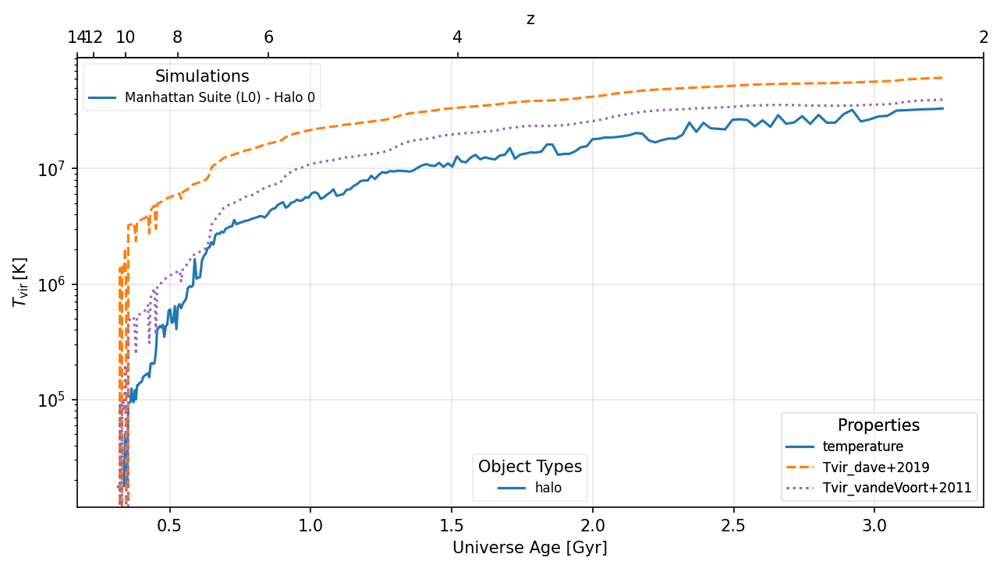

In [50]:
# single-panel multi-loop plotting utility
# - loops over sim_dict, obj_types and props_to_plot
# - bottom x-axis: Universe Age [Gyr]
# - top x-axis: corresponding redshift (interpolated from available age<->z pairs)
# - colour -> simulation, linestyle -> obj_type, marker -> property
# - three separate legends: simulations, obj_types, properties

# Customize these lists / label as needed
props_to_plot = [
    'temperature',
    'Tvir_dave+2019',
    'Tvir_vandeVoort+2011',
                ]   # properties to loop over
obj_types = ['halo']#, 'central']                   # object types to loop over
# y_label = r'$f_x = M_x/M_{\mathrm{gas}}$'         # y-axis label (you can include units here)
y_label = r'$T_{\mathrm{vir}} \,[\mathrm{K}]$'
# y_label = r'$N_{\mathrm{Major\,\,Mergers}}$'
# y_label = r'$N_{\mathrm{BH}}$'

# plotting appearance (easy to change)
# sim_names = list(sim_dict.keys())
# cmap = matplotlib.cm.get_cmap('tab10')
sim_plotting = {}
obj_plotting = {}
prop_plotting = {
    'marker':[None]*100,
    'mfc':['none']*100,
    'mec':['none']*100,
    'ms':[5]*100,
    'color':['C0', 'C1', 'C4', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12'],
    # 'color':['C1', 'C1', 'C4', 'C4', 'C6', 'C6'],
    'ls':['-', '--', ':', '-.', (0,(3,1,1,1,1,1)), (0,(1,1)), '-', '--', ':', '-.'],
    # 'ls':['--', ':', '--', ':', '--', ':'],
    # 'lw':[2, 1.5, 1, 0.5],
    # 'lw':[1,1,1,1,1,1,1,1],
    # 'lw':[2,2,2,2,2,2,2,2],
    'alpha':[1]*100,
    # 'alpha':[1, 1, 1, 0.5],
}

fig, ax = plt.subplots(figsize=(10, 5))
fig.set_dpi(150)

# collect age<->z pairs across everything to build a consistent mapping
ages_all = []
zs_all = []
for sim, sim_info in sim_dict.items():
    for obj in obj_types:
        try:
            a = sim_info['halo_props'][obj]['age'][:]
            z = sim_info['halo_props'][obj]['z'][:]
        except Exception:
            continue
        ages_all.append(a)
        zs_all.append(z)

if len(ages_all) == 0:
    raise RuntimeError("No age/z arrays found for the requested obj_types in the available simulations.")

ages_cat = np.concatenate(ages_all)
zs_cat = np.concatenate(zs_all)
# sort by increasing age (age increases, z decreases) and remove duplicates
order = np.argsort(ages_cat)
ages_sorted = ages_cat[order]
zs_sorted = zs_cat[order]
ages_unique, idx = np.unique(ages_sorted, return_index=True)
zs_unique = zs_sorted[idx]

# interpolation functions for secondary axis
def age_to_z(age):
    return np.interp(age, ages_unique, zs_unique)

def z_to_age(z):
    # inverse interpolation (zs_unique may be decreasing; ensure monotonic for interp)
    # here we sort by z increasing for inverse interp
    z_order = np.argsort(zs_unique)
    zs_for_inv = zs_unique[z_order]
    ages_for_inv = ages_unique[z_order]
    return np.interp(z, zs_for_inv, ages_for_inv)

# main plotting loop
handles_sim = []
handles_obj = []
handles_prop = []
seen_sim = set()
seen_obj = set()
seen_prop = set()

for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    # sim_info = sim_dict[sim]
    # color = sim_colors[sim]

    for obj_counter, obj in enumerate(obj_types):
        # linestyle = obj_linestyles.get(obj, '-')
        # try to access age array for x
        try:
            age_arr = sim_info['halo_props'][obj]['age'][:]
        except Exception:
            # missing object type for this simulation
            continue

        for prop_counter, prop in enumerate(props_to_plot):
            try:
                y_ds = sim_info['halo_props'][obj][prop]
                y = y_ds[:]
                y_units = y_ds.attrs['units']
                print(y_units)
            except Exception:
                # property missing -> skip
                print(f'Missing {prop}')
                continue

            # marker = prop_markers.get(prop, 'o')

            sim_plotting_curr = {name:vals[sim_counter] for name, vals in sim_plotting.items()}
            obj_plotting_curr = {name:vals[obj_counter] for name, vals in obj_plotting.items()}
            prop_plotting_curr = {name:vals[prop_counter] for name, vals in prop_plotting.items()}
            
            
            # ax.plot(age_arr, y,
            #         color=line_color, ls=linestyle, marker=marker,
            #         mfc='none', mec=marker_color, ms=marker_size, alpha=alpha)
            ax.plot(age_arr, y,
                    **sim_plotting_curr, **obj_plotting_curr, **prop_plotting_curr)

            # build legend handles (only once per category)
            if sim not in seen_sim:
                # handles_sim.append(Line2D([], [], color=color, ls='', marker='s', mfc=color, mec=color, label=sim))
                handles_sim.append(Line2D([], [], **sim_plotting_curr, label=sim))
                seen_sim.add(sim)
            if obj not in seen_obj:
                # handles_obj.append(Line2D([], [], color='black', ls=linestyle, marker='', label=obj))
                handles_obj.append(Line2D([], [], **obj_plotting_curr, label=obj))
                seen_obj.add(obj)
            if prop not in seen_prop:
                # handles_prop.append(Line2D([], [], color='black', ls='', marker=marker, mfc='none', mec='black', label=prop))
                handles_prop.append(Line2D([], [], **prop_plotting_curr, label=prop))
                seen_prop.add(prop)

# axis labels and scales (adjust if you want log x/y)
ax.set_xlabel('Universe Age [Gyr]')
ax.set_ylabel(y_label)
ax.set_yscale('log')
ax.grid(alpha=0.3)

# top axis showing redshift
ax_top = ax.secondary_xaxis('top', functions=(age_to_z, z_to_age))
ax_top.set_xlabel('z')

# place 3 legends: simulations, obj_types, properties
# simulations legend (colors) - upper left
leg_sim = ax.legend(handles=handles_sim, title='Simulations', loc='upper left', fontsize=8, framealpha=0.3)
ax.add_artist(leg_sim)
# object types legend (linestyles) - upper right
leg_obj = ax.legend(handles=handles_obj, title='Object Types', loc='lower center', fontsize=8, framealpha=0.3)
ax.add_artist(leg_obj)
# properties legend (markers) - lower left
leg_prop = ax.legend(handles=handles_prop, title='Properties', loc='lower right', fontsize=8, framealpha=0.3)
ax.add_artist(leg_prop)

plt.show()

## Mbh, BH fedd, Mgas, Mstar over cosmic time

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

y units: Msun
y units: Msun
y units: Msun
y units: Msun
y units: 1
y units: 1
y units: 1
y units: 1
y units: Msun
y units: Msun
y units: Msun
y units: Msun

Hyenas-C Smag L1 (Simba-C L1 Calibration) - Halo 3224

y units: Msun
y units: Msun
y units: Msun
y units: Msun
y units: 1
y units: 1
y units: 1
y units: 1
y units: Msun
y units: Msun
y units: Msun
y units: Msun

Hyenas-C Grad L1 (Simba-C L1 Calibration) - Halo 3224

y units: Msun
y units: Msun
y units: Msun
y units: Msun
y units: 1
y units: 1
y units: 1
y units: 1
y units: Msun
y units: Msun
y units: Msun
y units: Msun



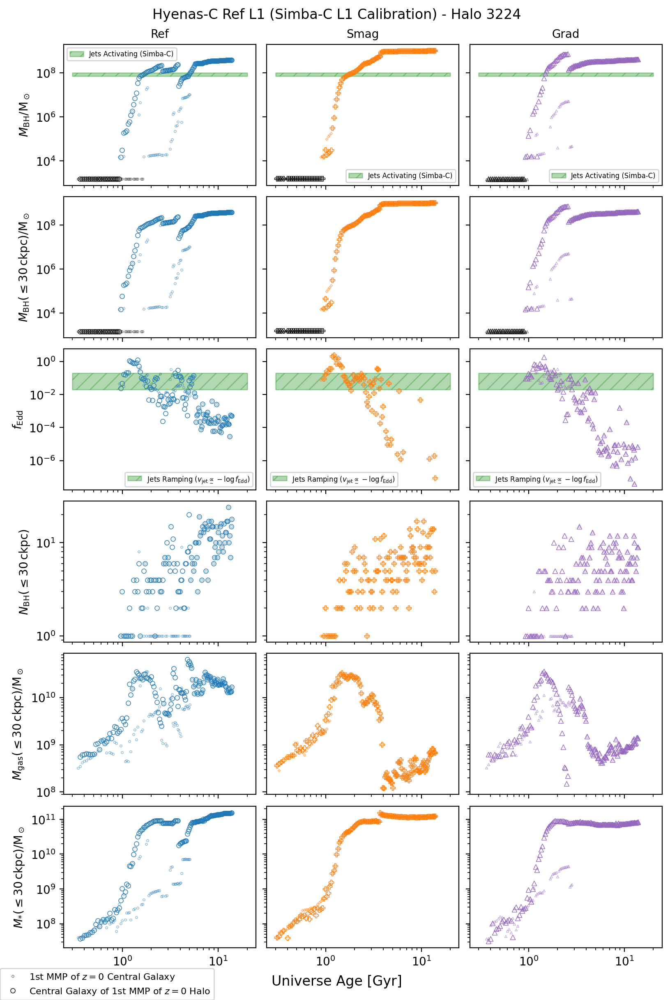

In [128]:
sim_markers = ['o', 'P', '^', 'X']
sim_colors = ['C0', 'C1', 'C4', 'C6']

props_to_plot = [
    'bh_mass', 'bh_30kpc_mass', 'bh_fedd',
    'nPartType5_30ckpc', #'nPartType5_50ckpc',
    # 'gas_mass', 
    'gas_30kpc_mass',
    # 'stellar_mass', 
    'star_30kpc_mass', #'stellar_30kpc_mass',
]

prop_labels = [
    r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$',
    r'$M_{\mathrm{BH}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$',
    r'$f_{\mathrm{Edd}}$',
    r'$N_{\mathrm{BH}}(\leq\mathrm{30\,ckpc})$',
    # r'$N_{\mathrm{BH}}(\leq\mathrm{50\,ckpc})$',
    # r'$M_{\mathrm{gas}}/\mathrm{M_\odot}$',
    r'$M_{\mathrm{gas}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$',
    # r'$M_{\mathrm{*}}/\mathrm{M_\odot}$',
    r'$M_{\mathrm{*}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$',
    # r'$M_{\mathrm{*}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$',
]


# obj_types = ['first_mmp_halo', 'first_mmp_central_halo']
# obj_types = ['first_mmp_halo', 'second_mmp_halo']
# obj_types = ['first_mmp_central_halo', 'second_mmp_central_halo']
obj_types = ['first_mmp_central', 'first_mmp_halo_central']
# obj_types = ['first_mmp_central', 'second_mmp_central']
# obj_types = ['first_mmp_halo_central', 'second_mmp_halo_central']
obj_names = [
    # r'1st MMP of $z=0$ Halo', r'Halo of 1st MMP of $z=0$ Central Galaxy',
    # r'1st MMP of $z=0$ Halo', r'2nd MMP of $z=0$ Halo',
    # r'Halo of 1st MMP of $z=0$ Central Galaxy', r'Halo of 2nd MMP of $z=0$ Central Galaxy',
    r'1st MMP of $z=0$ Central Galaxy', r'Central Galaxy of 1st MMP of $z=0$ Halo',
    # r'1st MMP of $z=0$ Central Galaxy', r'2nd MMP of $z=0$ Central Galaxy',
    # r'Central Galaxy of 1st MMP of $z=0$ Halo', r'Central Galaxy of 2nd MMP of $z=0$ Halo',
]
# obj_sizes = [4, 2]
obj_sizes = [2, 4]
# obj_alphas = [1, 0.5]
obj_alphas = [0.5, 1]


nrows = len(props_to_plot)
ncols = len(list(sim_dict.keys()))

fig, axes = plt.subplots(num=1, figsize=(8,12),
                       nrows=nrows, ncols=ncols,
                       sharex='col', sharey='row', layout='constrained')
fig.set_dpi(200)
# fig.set_xscale('log')
fig.suptitle('Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224')
fig.supxlabel('Universe Age [Gyr]')

handles = [Line2D([],[],marker='o',mfc='none',ls='',mec='black',mew=0.5,ms=ms,alpha=alpha) for ms, alpha in zip(obj_sizes, obj_alphas)]
leg = Legend(fig, handles=handles, labels=obj_names, fontsize=8, loc=(0, 0))
fig.add_artist(leg)


title_type = 'manual'
titles = [
    # r'$M_{\mathrm{BH,seed}}=10^4\,\mathrm{M_{\odot}/h}$',
    # r'$M_{\mathrm{BH,seed}}=10^3\,\mathrm{M_{\odot}/h}$',
    'Ref',
    'Smag',
    'Grad',
]

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    if title_type == 'sim':
        axes[0,sim_counter].set_title(sim, fontsize=10, wrap=True)
    elif title_type == 'manual':
        axes[0,sim_counter].set_title(titles[sim_counter], fontsize=10, wrap=True)

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]
    halo_props = sim_info['halo_props']

    for prop_counter, prop in enumerate(props_to_plot):
        ax = axes[prop_counter, sim_counter]
        if sim_counter == 0:
            ax.set_ylabel(prop_labels[prop_counter], fontsize=10)
            
        ax.set_xscale('log')
        ax.set_yscale('log')

        if prop == 'bh_mass':
            # ax.fill_betweenx(y=[4e7,6e7], x1=0.5, x2=20, color='C0', alpha=0.3, hatch='//',
            #                  label='Jets Activating (Simba)')
            ax.fill_betweenx(y=[7e7,1e8], x1=0.3, x2=20, color='green', alpha=0.3, hatch='//',
                             label='Jets Activating (Simba-C)')
            ax.legend(fontsize=6)

        if prop == 'bh_fedd':
            ax.fill_betweenx(y=[2e-2,2e-1], x1=0.3, x2=20, color='green', alpha=0.3, hatch='//',
                     label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')
            ax.legend(fontsize=6)

        for obj_counter, obj_type in enumerate(obj_types):

            size = obj_sizes[obj_counter]
            alpha = obj_alphas[obj_counter]

            x = halo_props[obj_type]['age'][:]
            # x1 = halo_props['first_mmp_central']['age'][:]
            # x2 = halo_props['first_mmp_halo_central']['age'][:]

            try:
                y = halo_props[obj_type][prop]
                print(f'y units: {y.attrs['units']}')
            except Exception as error:
                print(f'Error with {obj_type}: {error}')
                continue
                # do1 = False
    
            # do1 = True
            # try:
            #     y1 = halo_props['first_mmp_central'][prop]
            #     print(f'y1 units: {y1.attrs['units']}')
            # except:
            #     do1 = False
    
            # do2 = True
            # try:
            #     y2 = halo_props['first_mmp_halo_central'][prop]
            #     print(f'y2 units: {y2.attrs['units']}\n')
            # except:
            #     do2 = False
    
            # if sim_counter == 0:
            #     label = r"$z=0$ Central's First MMP"
            #     # label = r"Central of $z=0$ Halo's First MMP"
            # else:
            #     label = None

            ax.plot(x[:], y[:], 
                    marker=marker, mfc='none', mec=color,
                    mew=0.5, ms=size, alpha=alpha, ls='')
    
            # if do1:
            #     ax.plot(x1[:], y1[:], 
            #             marker=marker, mfc='none', mec=color,
            #             mew=0.5, ms=4, alpha=1, ls='')
    
            # if do2:
            #     ax.plot(x2[:], y2[:], 
            #             marker=marker, mfc='none', mec=color,
            #             mew=0.5, ms=2, alpha=0.5, ls='')
        
            # curr_handle= Line2D([], [], color=color, ls='',
            #                     marker=marker, ms=5, mec='black',
            #                     mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
            # handle_list.append(curr_handle)
            # labels_list.append(sim)
    
    
            ## Plot all 0 values as 1 dex below minimum nonzero value
            zero_value_indexes = np.where(np.array(y[:])==0)[0]
            nonzero_value_indexes = np.where(np.array(y[:])!=0)[0]
            # print(zero_value_indexes)
            try:
                # print(min(np.log10(np.array(y[:])[nonzero_value_indexes])))
                zero_value_for_plotting = np.array([10**(min(np.log10(np.array(y[:])[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
            except:
                zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
            # print(zero_value_for_plotting)
    
            ax.plot(np.array(x[:])[zero_value_indexes], zero_value_for_plotting, 
                    marker=marker, mfc='none', ms=size, alpha=alpha,
                    mec='black', mew=0.5, ls='')
            
            # if do1:
            #     zero_value_indexes = np.where(np.array(y1[:])==0)[0]
            #     nonzero_value_indexes = np.where(np.array(y1[:])!=0)[0]
            #     # print(zero_value_indexes)
            #     try:
            #         # print(min(np.log10(np.array(y[:])[nonzero_value_indexes])))
            #         zero_value_for_plotting = np.array([10**(min(np.log10(np.array(y1[:])[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
            #     except:
            #         zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
            #     # print(zero_value_for_plotting)
        
            #     ax.plot(np.array(x1[:])[zero_value_indexes], zero_value_for_plotting, 
            #             marker=marker, mfc='none', ms=4, alpha=1,
            #             mec='black', mew=0.5, ls='')
    
    
            # if do2:
            #     zero_value_indexes = np.where(np.array(y2[:])==0)[0]
            #     nonzero_value_indexes = np.where(np.array(y2[:])!=0)[0]
            #     # print(zero_value_indexes)
            #     try:
            #         # print(min(np.log10(np.array(y[:])[nonzero_value_indexes])))
            #         zero_value_for_plotting = np.array([10**(min(np.log10(np.array(y2[:])[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
            #     except:
            #         zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
            #     # print(zero_value_for_plotting)
        
            #     ax.plot(np.array(x2[:])[zero_value_indexes], zero_value_for_plotting, 
            #             marker=marker, mfc='none', ms=2, alpha=0.5,
            #             mec='black', mew=0.5, ls='')

    print()

## BH fedd vs Mbh

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

Hyenas-C Smag L1 (Simba-C L1 Calibration) - Halo 3224

Hyenas-C Grad L1 (Simba-C L1 Calibration) - Halo 3224



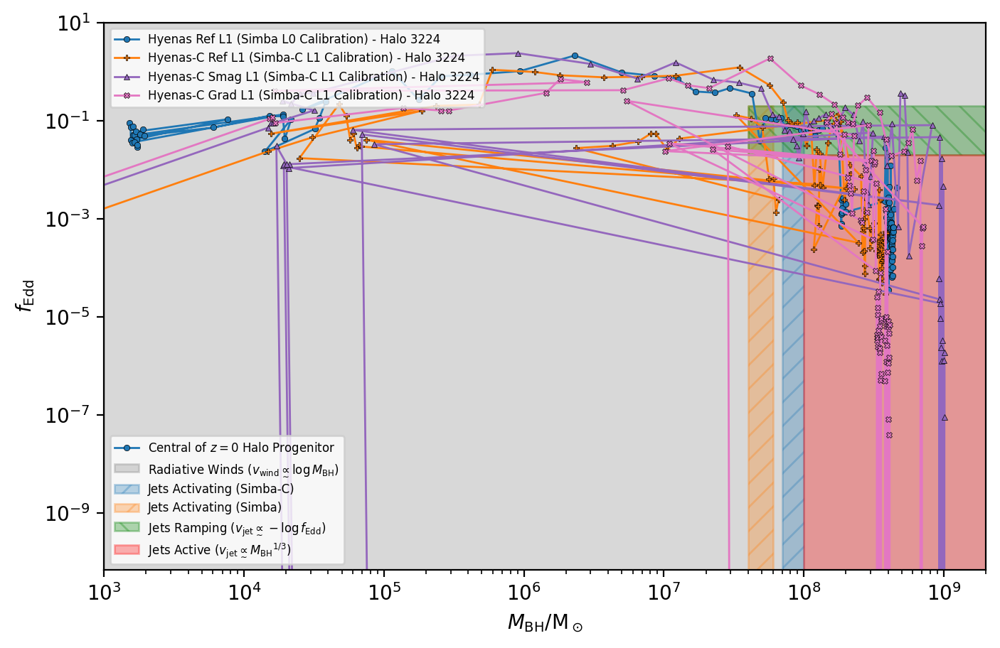

In [10]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']

    central_fedd_to_plot = copy.deepcopy(halo_props['central']['bh_fedd'][:])
    # central_fedd_to_plot[central_fedd_to_plot==0] = 1e-10

    halo_central_fedd_to_plot = copy.deepcopy(halo_props['halo_central']['bh_fedd'][:])
    # halo_central_fedd_to_plot[halo_central_fedd_to_plot==0] = 1e-10

    if sim_counter == 0:
        label_central = r'$z=0$ Central Progenitor'
        label_halo_central = r'Central of $z=0$ Halo Progenitor'
    else:
        label_central = None
        label_halo_central = None
    
    # ax.plot(halo_props['central']['bh_mass'][:], central_fedd_to_plot,
    #         marker=marker, ms=3, mew=0.25, mec='black',
    #         color=color, mfc=color, ls='-', lw=1, alpha=1,
    #         label=label_central)

    ax.plot(halo_props['halo_central']['bh_mass'][:], halo_central_fedd_to_plot,
            marker=marker, ms=3, mew=0.25, mec='black',
            color=color, mfc=color, ls='-', lw=1, alpha=1,
            label=label_halo_central)

    curr_handle= Line2D([], [], color=color, ls='-',
                        marker=marker, ms=3, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[0,2e-1], x1=7e7, x2=1e8, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')
ax.fill_betweenx(y=[0,2e-1], x1=4e7, x2=6e7, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba)')

ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$f_{\mathrm{Edd}}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_ylim(7e-11,1e1)
ax.set_xlim(1e3, 2e9)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

Hyenas-C Smag L1 (Simba-C L1 Calibration) - Halo 3224

Hyenas-C Grad L1 (Simba-C L1 Calibration) - Halo 3224



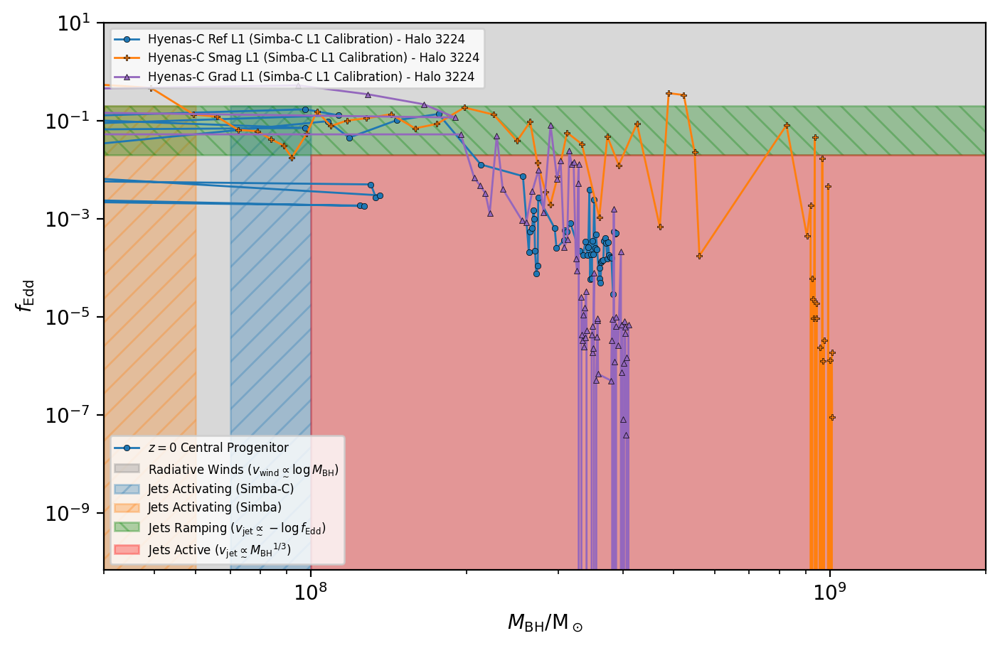

In [236]:
# sim_markers = ['o', '+', '^', 'x']
sim_markers = ['o', 'P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']

    central_fedd_to_plot = copy.deepcopy(halo_props['central']['bh_fedd'][:])
    # central_fedd_to_plot[central_fedd_to_plot==0] = 1e-10

    halo_central_fedd_to_plot = copy.deepcopy(halo_props['halo_central']['bh_fedd'][:])
    # halo_central_fedd_to_plot[halo_central_fedd_to_plot==0] = 1e-10

    if sim_counter == 0:
        label_central = r'$z=0$ Central Progenitor'
        label_halo_central = r'Central of $z=0$ Halo Progenitor'
    else:
        label_central = None
        label_halo_central = None
    
    ax.plot(halo_props['central']['bh_mass'][:], central_fedd_to_plot,
            marker=marker, ms=3, mew=0.25, mec='black',
            color=color, mfc=color, ls='-', lw=1, alpha=1,
            label=label_central)

    # ax.plot(halo_props['halo_central']['bh_mass'][:], halo_central_fedd_to_plot,
    #         marker=marker, ms=3, mew=0.25, mec='black',
    #         color=color, mfc=color, ls='-', lw=1, alpha=1,
    #         label=label_halo_central)

    curr_handle= Line2D([], [], color=color, ls='-',
                        marker=marker, ms=3, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[0,2e-1], x1=7e7, x2=1e8, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')
ax.fill_betweenx(y=[0,2e-1], x1=4e7, x2=6e7, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba)')

ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$f_{\mathrm{Edd}}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_ylim(7e-11,1e1)
ax.set_xlim(4e7, 2e9)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

## Mgas vs Mbh

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

Hyenas-C Smag L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

Hyenas-C Grad L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun



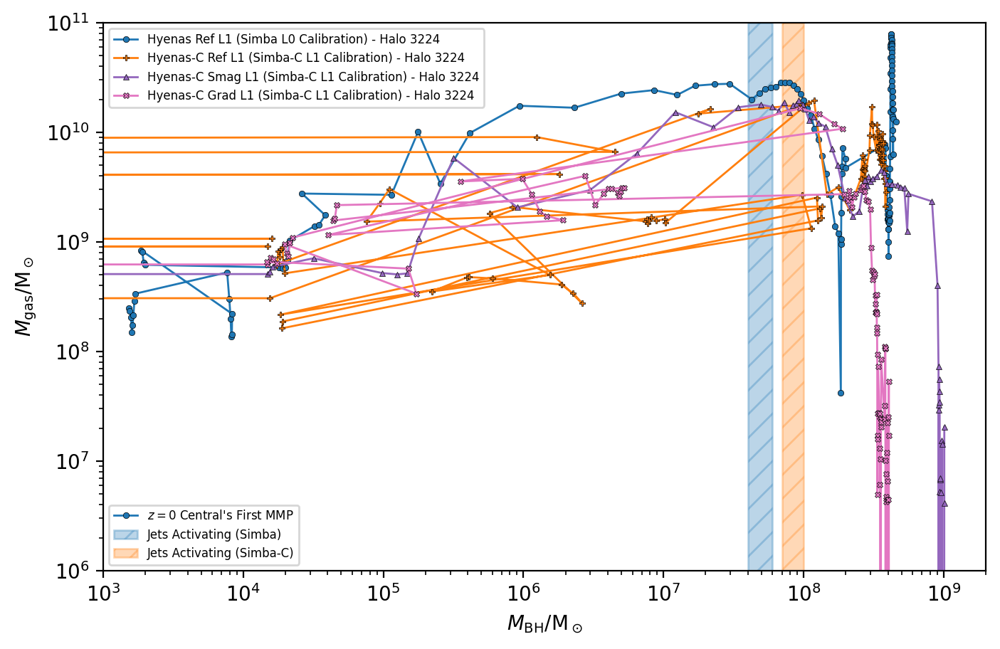

In [15]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']

    x = halo_props['central']['bh_mass']
    y = halo_props['central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=3, mew=0.25, mec='black',
            color=color, mfc=color, ls='-', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='-',
                        marker=marker, ms=3, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e3, 2e9)
ax.set_ylim(1e6,1e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

Hyenas-C Smag L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

Hyenas-C Grad L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun



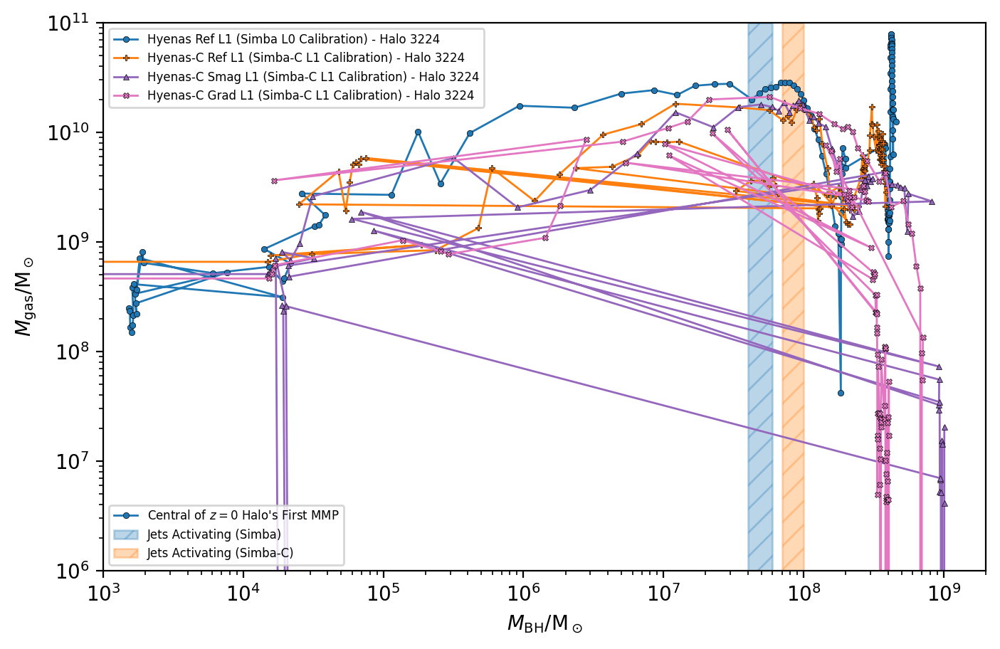

In [16]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']

    x = halo_props['halo_central']['bh_mass']
    y = halo_props['halo_central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=3, mew=0.25, mec='black',
            color=color, mfc=color, ls='-', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='-',
                        marker=marker, ms=3, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e3, 2e9)
ax.set_ylim(1e6,1e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun



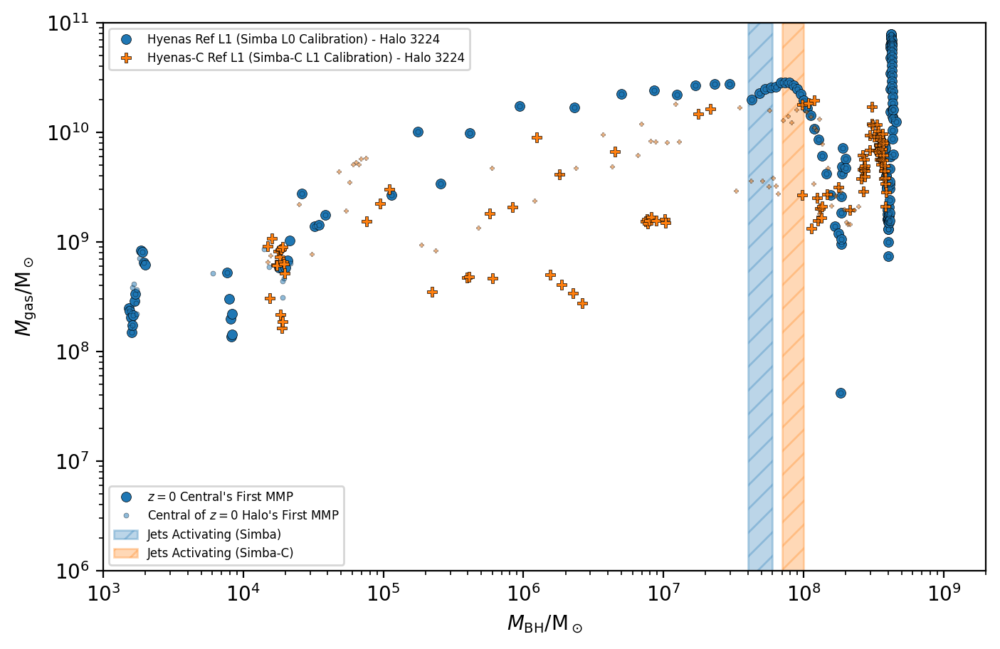

In [22]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_mass']
    y = halo_props['central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_mass']
    y = halo_props['halo_central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e3, 2e9)
ax.set_ylim(1e6,1e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun



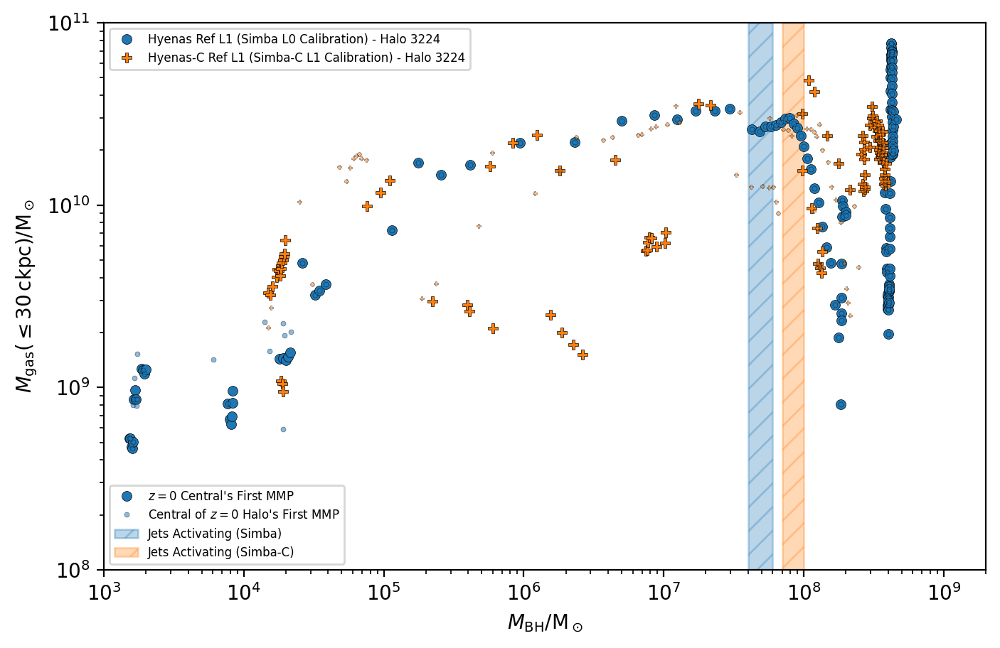

In [24]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_mass']
    y = halo_props['central']['gas_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_mass']
    y = halo_props['halo_central']['gas_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e3, 2e9)
ax.set_ylim(1e8,1e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun



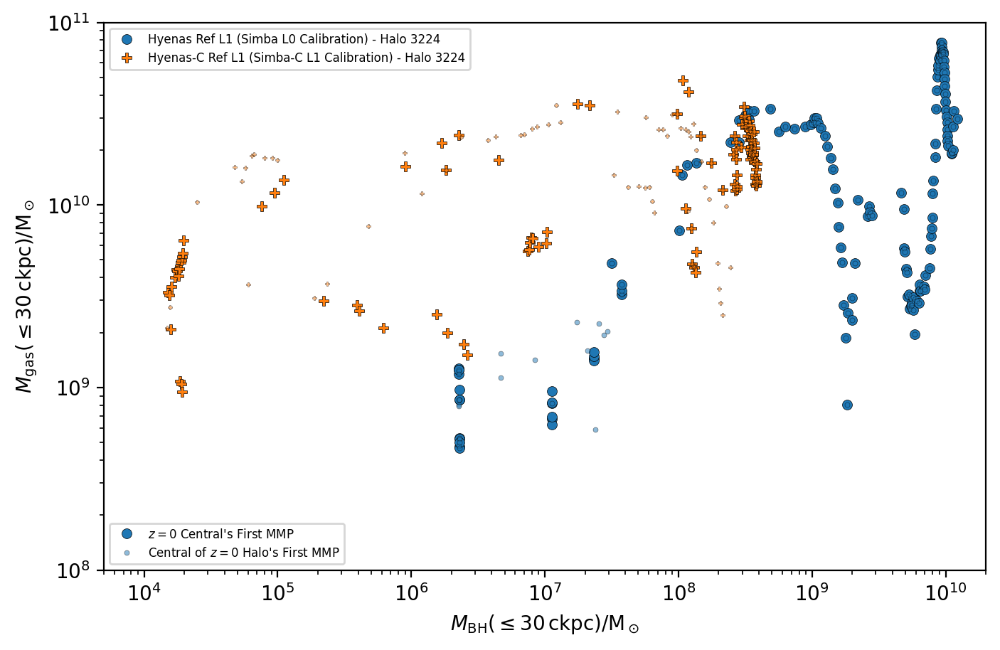

In [27]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_30kpc_mass']
    y = halo_props['central']['gas_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_30kpc_mass']
    y = halo_props['halo_central']['gas_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

# ax.fill_betweenx(y=[1e6,1e11], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
# ax.fill_betweenx(y=[1e6,1e11], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(5e3, 2e10)
ax.set_ylim(1e8,1e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun



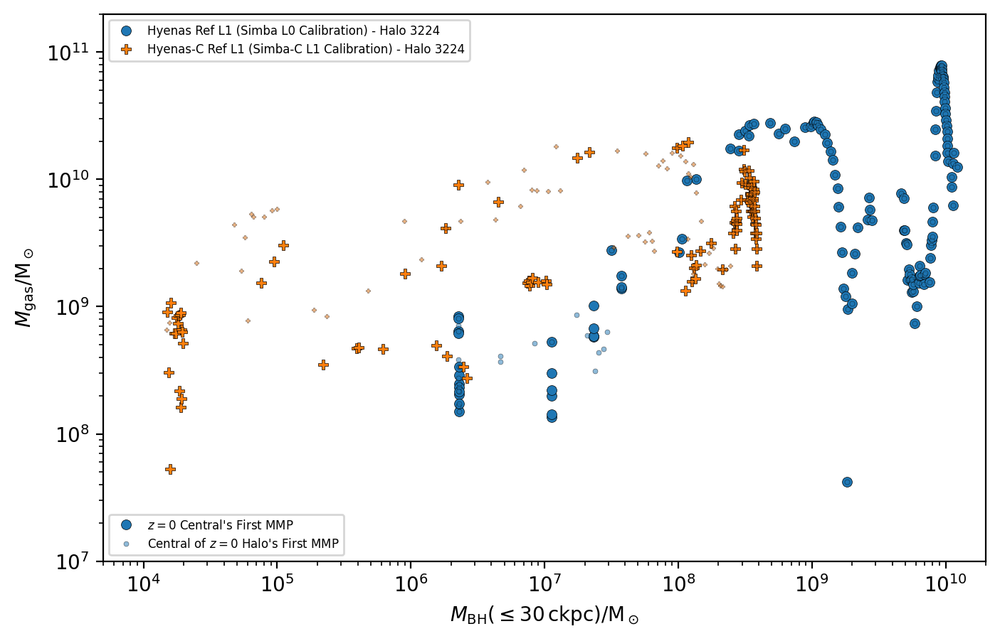

In [36]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_30kpc_mass']
    y = halo_props['central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_30kpc_mass']
    y = halo_props['halo_central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

# ax.fill_betweenx(y=[1e6,1e11], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
# ax.fill_betweenx(y=[1e6,1e11], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(5e3, 2e10)
ax.set_ylim(1e7,2e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

## Mstar vs Mbh

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun



ValueError: x and y must have same first dimension, but have shapes (138,) and (143,)

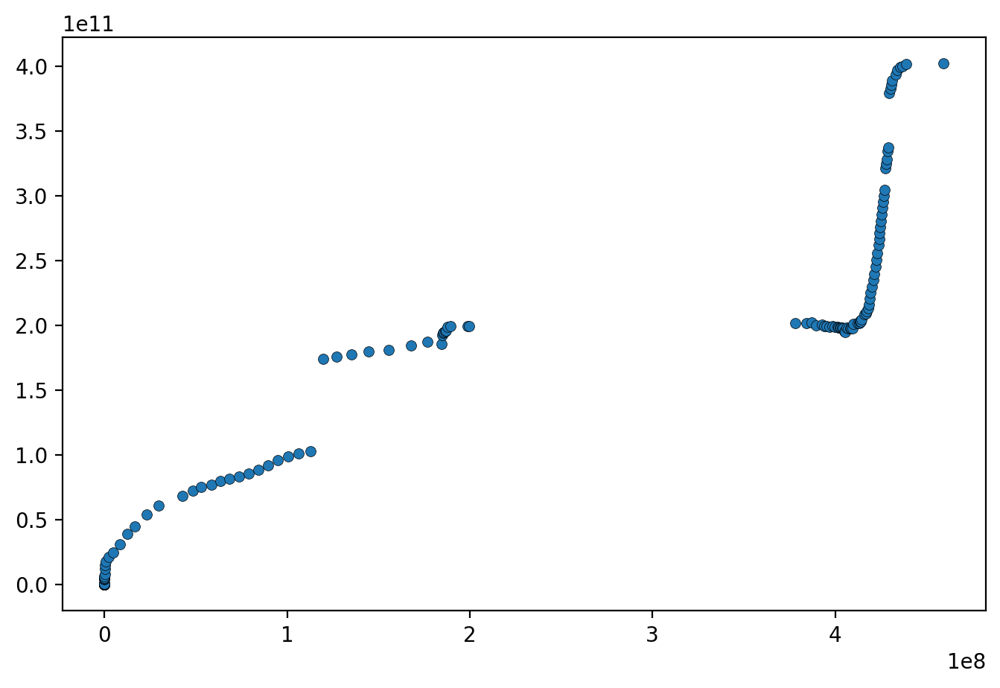

In [55]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_mass']
    y = halo_props['central']['stellar_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_mass']
    y = halo_props['halo_central']['stellar_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{*}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e3, 2e9)
ax.set_ylim(5e6,1e12)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224



KeyError: "Unable to synchronously open object (object 'stellar_30kpc_mass' doesn't exist)"

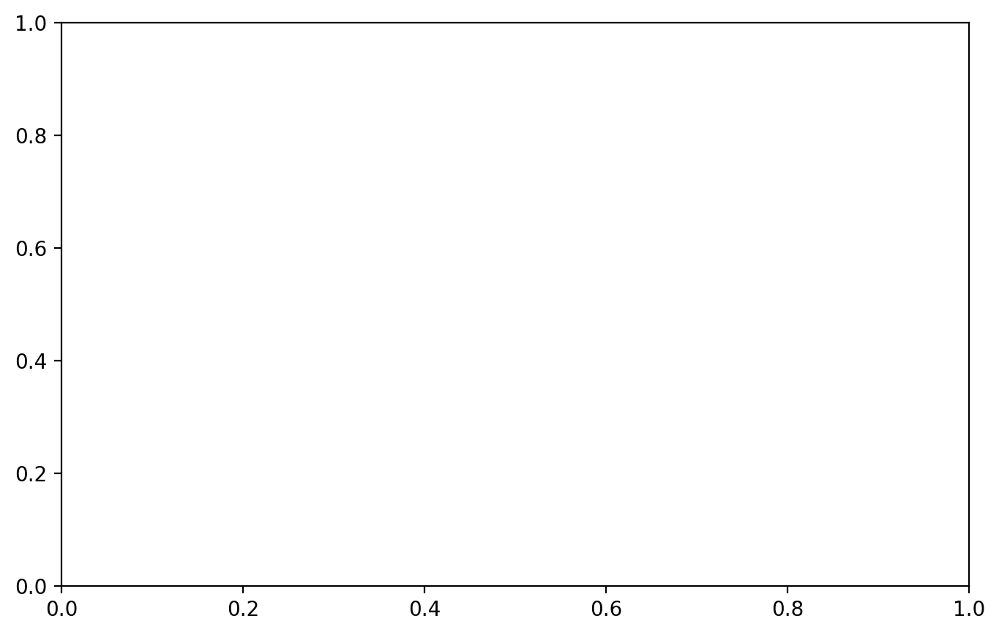

In [34]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_mass']
    y = halo_props['central']['stellar_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_mass']
    y = halo_props['halo_central']['stellar_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{*}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e3,2e9)
ax.set_ylim(5e6,1e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun



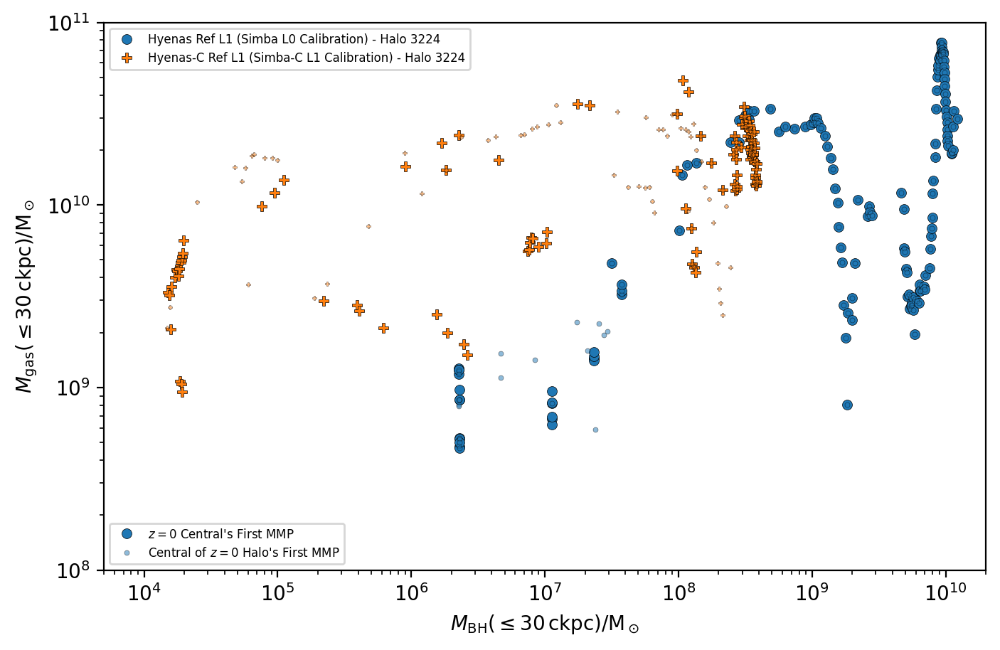

In [27]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_30kpc_mass']
    y = halo_props['central']['stellar_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_30kpc_mass']
    y = halo_props['halo_central']['stellar_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

# ax.fill_betweenx(y=[1e6,1e11], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
# ax.fill_betweenx(y=[1e6,1e11], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{*}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(5e3, 2e10)
ax.set_ylim(5e6,1e12)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: Msun
y units: Msun

x units: Msun
y units: Msun



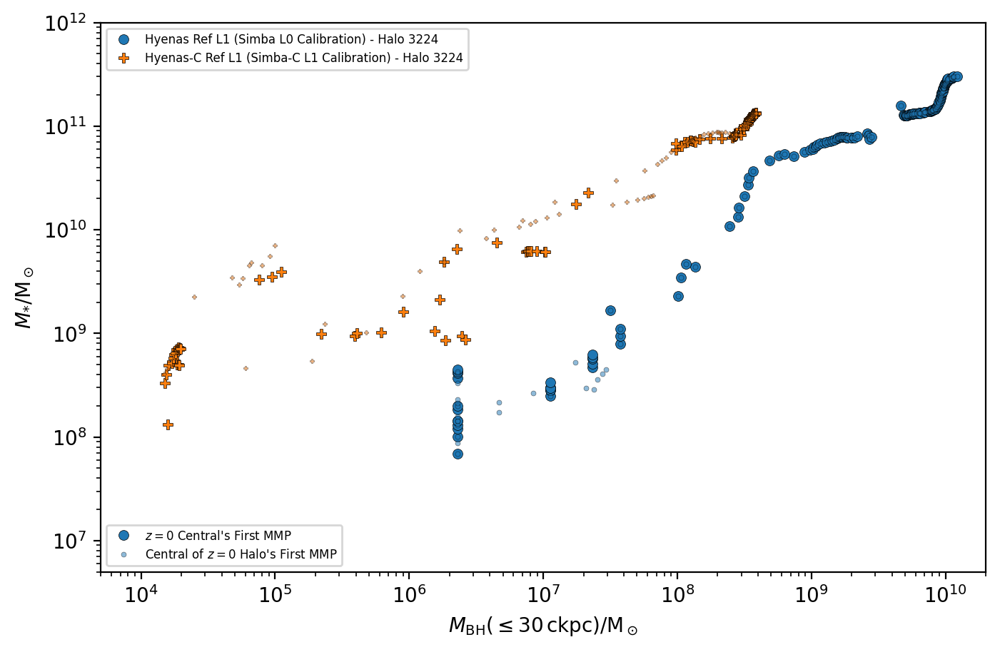

In [37]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_30kpc_mass']
    y = halo_props['central']['stellar_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_30kpc_mass']
    y = halo_props['halo_central']['stellar_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='', lw=1, alpha=0.5,
            label=label)


# ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=2e9, color='grey', alpha=0.3,
#                  label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

# ax.fill_betweenx(y=[1e6,1e11], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
# ax.fill_betweenx(y=[1e6,1e11], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

# ax.fill_betweenx(y=[2e-2,2e-1], x1=4e7, x2=2e9, color='green', alpha=0.3, hatch='\\\\',
#                  label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

# ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=2e9, color='red', alpha=0.3,
#                  label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$M_{\mathrm{BH}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')
ax.set_ylabel(r'$M_{\mathrm{*}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(5e3, 2e10)
ax.set_ylim(5e6,1e12)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

## Mgas vs fedd

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: 1
y units: Msun

x units: 1
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: 1
y units: Msun

x units: 1
y units: Msun



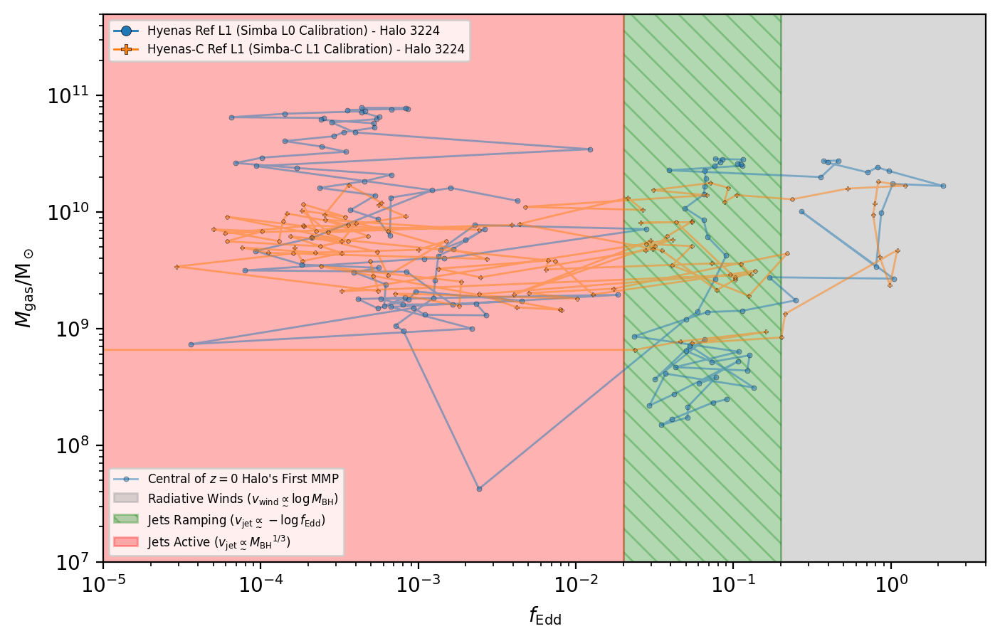

In [48]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_fedd']
    y = halo_props['central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    # ax.plot(x[:], y[:],
    #         marker=marker, ms=5, mew=0.25, mec='black',
    #         color=color, mfc=color, ls='-', lw=1, alpha=1,
    #         label=label)

    curr_handle= Line2D([], [], color=color, ls='-',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_fedd']
    y = halo_props['halo_central']['gas_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='-', lw=1, alpha=0.5,
            label=label)


ax.fill_betweenx(y=[1e0,1e15], x1=2e-1, x2=1e2, color='grey', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

# ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
# ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

ax.fill_betweenx(y=[1e0,1e15], x1=2e-2, x2=2e-1, color='green', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=0, x2=2e-2, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$f_{\mathrm{Edd}}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e-5, 4e0)
ax.set_ylim(1e7,5e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: 1
y units: Msun

x units: 1
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: 1
y units: Msun

x units: 1
y units: Msun



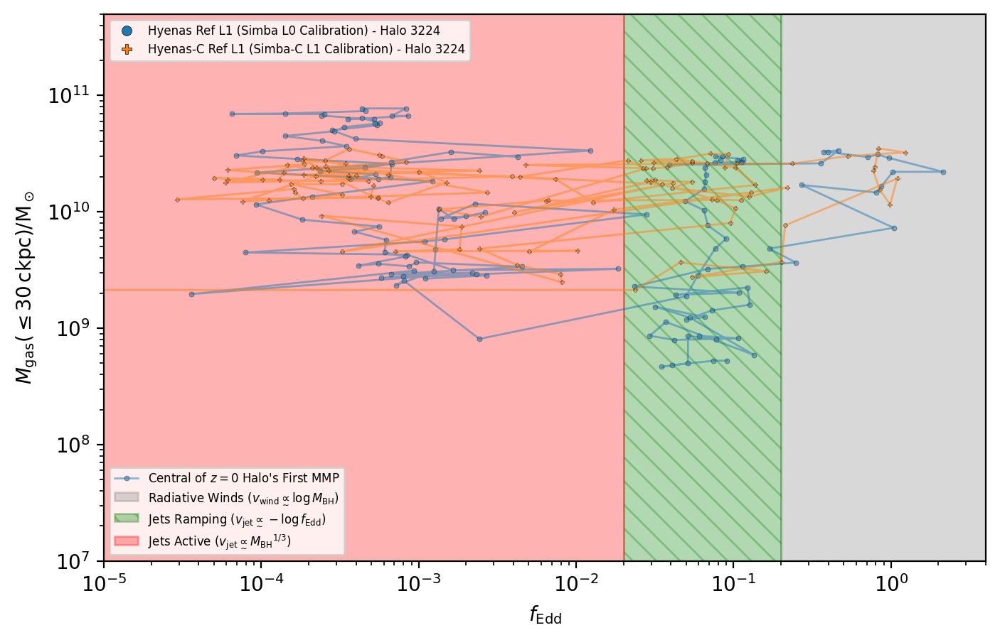

In [47]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_fedd']
    y = halo_props['central']['gas_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    # ax.plot(x[:], y[:],
    #         marker=marker, ms=5, mew=0.25, mec='black',
    #         color=color, mfc=color, ls='', lw=1, alpha=1,
    #         label=label)


    x = halo_props['halo_central']['bh_fedd']
    y = halo_props['halo_central']['gas_30kpc_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=2.5, mew=0.25, mec='black',
            color=color, mfc=color, ls='-', lw=1, alpha=0.5,
            label=label)



    curr_handle= Line2D([], [], color=color, ls='',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


ax.fill_betweenx(y=[1e0,1e15], x1=2e-1, x2=1e2, color='grey', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

# ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
# ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

ax.fill_betweenx(y=[1e0,1e15], x1=2e-2, x2=2e-1, color='green', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=0, x2=2e-2, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$f_{\mathrm{Edd}}$')
ax.set_ylabel(r'$M_{\mathrm{gas}}(\leq\mathrm{30\,ckpc})/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e-5, 4e0)
ax.set_ylim(1e7,5e11)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()

## Mstar vs fedd

Hyenas Ref L1 (Simba L0 Calibration) - Halo 3224

x units: 1
y units: Msun

x units: 1
y units: Msun

Hyenas-C Ref L1 (Simba-C L1 Calibration) - Halo 3224

x units: 1
y units: Msun

x units: 1
y units: Msun



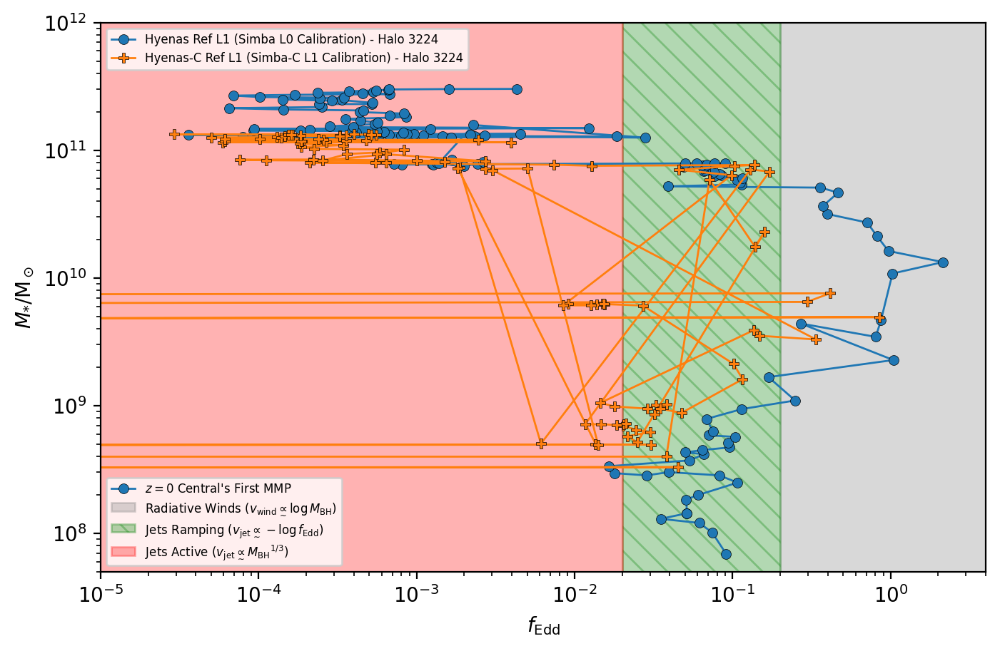

In [51]:
sim_markers = ['o', 'P', '^', 'X']
# sim_markers = ['P', '^', 'X']
# sim_colors = ['C0', 'C1']

# obj_types = ['halo', 'central_halo', 'central', 'halo_central']
# obj_types = ['halo', 'central_halo']
obj_types = ['central', 'halo_central']
obj_names = [
    # r'$z=0$ Halo Progenitor', r'Halo of $z=0$ Central Progenitor',
    r'$z=0$ Central Progenitor', r'Central of $z=0$ Halo Progenitor',
]
# obj_colors = [['C0', 'C1', 'C2'], ['blue', 'red', 'green']]
colors = ['C0', 'C1', 'C4', 'C6']
# comparison_sizes = [[7, 5, 3], [6.5, 4.5, 2.5]]
# obj_sizes = [[6, 4], [5.5, 3.5]]
obj_sizes = [3, 2, 3, 2]
# obj_markers = []
alphas = [1, 0.5, 1, 0.5]


fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')
fig.set_dpi(200)

handle_list = []
labels_list = []
for sim_counter, (sim, sim_info) in enumerate(sim_dict.items()):
    print(sim)
    print()

    marker = sim_markers[sim_counter]
    color = colors[sim_counter]

    halo_props = sim_info['halo_props']
    

    x = halo_props['central']['bh_fedd']
    y = halo_props['central']['stellar_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        label = r"$z=0$ Central's First MMP"
        # label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    ax.plot(x[:], y[:],
            marker=marker, ms=5, mew=0.25, mec='black',
            color=color, mfc=color, ls='-', lw=1, alpha=1,
            label=label)

    curr_handle= Line2D([], [], color=color, ls='-',
                        marker=marker, ms=5, mec='black',
                        mfc=color, alpha=1, mew=0.25, lw=1, label=sim)
    handle_list.append(curr_handle)
    labels_list.append(sim)


    x = halo_props['halo_central']['bh_fedd']
    y = halo_props['halo_central']['stellar_mass']

    print(f'x units: {x.attrs['units']}')
    print(f'y units: {y.attrs['units']}\n')

    if sim_counter == 0:
        # label = r"$z=0$ Central's First MMP"
        label = r"Central of $z=0$ Halo's First MMP"
    else:
        label = None
    
    # ax.plot(x[:], y[:],
    #         marker=marker, ms=2.5, mew=0.25, mec='black',
    #         color=color, mfc=color, ls='-', lw=1, alpha=0.5,
    #         label=label)


ax.fill_betweenx(y=[1e0,1e15], x1=2e-1, x2=1e2, color='grey', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')

# ax.fill_betweenx(y=[1e0,1e15], x1=4e7, x2=6e7, color='C0', alpha=0.3, hatch='//', label='Jets Activating (Simba)')
# ax.fill_betweenx(y=[1e0,1e15], x1=7e7, x2=1e8, color='C1', alpha=0.3, hatch='//', label='Jets Activating (Simba-C)')

ax.fill_betweenx(y=[1e0,1e15], x1=2e-2, x2=2e-1, color='green', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[1e0,1e15], x1=0, x2=2e-2, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

ax.set_xlabel(r'$f_{\mathrm{Edd}}$')
ax.set_ylabel(r'$M_{\mathrm{*}}/\mathrm{M_\odot}$')

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlim(1e-5, 4e0)
ax.set_ylim(5e7,1e12)

ax.legend(fontsize=6, loc='lower left')

# ax.legend(handles=handle_list, fontsize=6, loc=(0, 1.02))
leg2 = Legend(ax, handles=handle_list, labels=labels_list, fontsize=6, loc='upper left')# loc=(0, 1.02))
ax.add_artist(leg2)

# plt.title('Halo Centrals')

plt.show()